In [31]:
try:
    reload(densprofiles)
    reload(define_rcsample)
    reload(fitDens)
    reload(fitDens.densprofiles)
    reload(compareDataModel)
    reload(mockDensData)
except NameError:
    import densprofiles
    import define_rcsample
    import fitDens
    import compareDataModel
    import mockDensData
%matplotlib
import os, os.path
import pickle
import copy
from galpy.util import bovy_plot, bovy_coords
import triangle
import mwdust
import fitsio

Using matplotlib backend: MacOSX


# Setup

Load the selection function and effective selection function

In [2]:
selectFile= '../savs/selfunc-nospdata.sav'
if os.path.exists(selectFile):
    with open(selectFile,'rb') as savefile:
        apo= pickle.load(savefile)
with open('../essf/essf_green15.sav','rb') as savefile:
    locations= pickle.load(savefile)
    effsel= pickle.load(savefile)
    distmods= pickle.load(savefile)
with open('../essf/essf_marshall06.sav','rb') as savefile:
    mlocations= pickle.load(savefile)
    meffsel= pickle.load(savefile)
    mdistmods= pickle.load(savefile)
# Fill in regions not covered by Marshall map
meffsel[meffsel < -0.5]= effsel[meffsel < -0.5]
with open('../essf/essf_zero.sav','rb') as savefile:
    zlocations= pickle.load(savefile)
    zeffsel= pickle.load(savefile)
    zdistmods= pickle.load(savefile)
with open('../essf/essf_drimmel03.sav','rb') as savefile:
    dlocations= pickle.load(savefile)
    deffsel= pickle.load(savefile)
    ddistmods= pickle.load(savefile)
# Get (lcen,bcen) for each location
lcen= numpy.zeros(len(locations))
bcen= numpy.zeros(len(locations))
hmax= numpy.zeros(len(locations))
for ii,loc in enumerate(locations):
    tlcen, tbcen= apo.glonGlat(loc)
    lcen[ii]= tlcen
    bcen[ii]= tbcen
    hmax[ii]= apo.Hmax(loc,cohort='long')
    if numpy.isnan(hmax[ii]):
        hmax[ii]= apo.Hmax(loc,cohort='medium')
        if numpy.isnan(hmax[ii]):
            hmax[ii]= apo.Hmax(loc,cohort='short')
# Get the locations of various subsamples
highbIndx= numpy.fabs(bcen) > 10.
outDiskIndx= (lcen > 150.)*(lcen < 250.)*(True-highbIndx)
betwDiskIndx= (lcen <= 150.)*(lcen >= 70.)*(True-highbIndx)
inDiskIndx= (lcen < 70.)*(lcen >= 25.)*(True-highbIndx)
bulgeIndx= ((lcen < 25.)+(lcen > 335.))*(True-highbIndx)
brightIndx= (hmax <= 12.21)
mediumIndx= (hmax > 12.21)*(hmax <= 12.81)
faintIndx= (hmax > 12.81)

Function to load the data:

In [3]:
ldata= None
data_highbIndx= None
data_outDiskIndx= None
data_betwDiskIndx= None
data_inDiskIndx= None
data_bulgeIndx= None
data_brightIndx= None
data_mediumIndx= None
data_faintIndx= None
def load_data(subsample='lowlow'):
    global ldata
    global data_highbIndx
    global data_outDiskIndx
    global data_betwDiskIndx
    global data_inDiskIndx    
    global data_bulgeIndx    
    global data_brightIndx
    global data_mediumIndx
    global data_faintIndx
    if subsample.lower() == 'all':
        ldata= define_rcsample.get_rcsample()
    elif subsample.lower() == 'alllowalpha':
        ldata= define_rcsample.get_rcsample()
        ldata= ldata[ldata[define_rcsample._AFETAG] < 0.1]
    elif subsample.lower() == 'lowlow':
        ldata= define_rcsample.get_lowlowsample()
    elif subsample.lower() == 'highfeh':
        ldata= define_rcsample.get_highfehsample()
    elif subsample.lower() == 'highalpha':
        ldata= define_rcsample.get_highalphasample()
    elif subsample.lower() == 'solar':
        ldata= define_rcsample.get_solarsample()
    # Get the indices of the various subsamples defined above
    data_highbIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[highbIndx]: data_highbIndx[ii]= True
    data_outDiskIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[outDiskIndx]: data_outDiskIndx[ii]= True
    data_betwDiskIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[betwDiskIndx]: data_betwDiskIndx[ii]= True
    data_inDiskIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[inDiskIndx]: data_inDiskIndx[ii]= True
    data_bulgeIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[bulgeIndx]: data_bulgeIndx[ii]= True
    data_brightIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[brightIndx]: data_brightIndx[ii]= True
    data_mediumIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[mediumIndx]: data_mediumIndx[ii]= True
    data_faintIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[faintIndx]: data_faintIndx[ii]= True

Function to load mock data

In [4]:
def load_mock_data(type='exp',subsample='lowlow',nls=21):
    global ldata
    global data_highbIndx
    global data_outDiskIndx
    global data_betwDiskIndx
    global data_inDiskIndx    
    global data_bulgeIndx    
    global data_brightIndx
    global data_mediumIndx
    global data_faintIndx
    if not nls is None:
        ldata= fitsio.read('../mocks/%s-%s-nls21-20k.fits' % (subsample,type))
    else:
        ldata= fitsio.read('../mocks/%s-%s-20k.fits' % (subsample,type))
    # Assign location IDs
    locids= numpy.zeros(len(ldata),dtype='int')
    XYZ= bovy_coords.galcencyl_to_XYZ(ldata['RC_GALR_H'],ldata['RC_GALPHI_H'],ldata['RC_GALZ_H'],
                                      Xsun=define_rcsample._R0,
                                            Ysun=0.,
                                            Zsun=define_rcsample._Z0)
    lbd= bovy_coords.XYZ_to_lbd(XYZ[0],XYZ[1],XYZ[2],degree=True)
    for ii,loc in enumerate(locations):
        tlcen, tbcen= apo.glonGlat(loc)
        trad= apo.radius(loc)
        tindx= (tlcen-lbd[:,0])**2.+(tbcen-lbd[:,1])**2. < trad**2.
        locids[tindx]= loc
    # Get the indices of the various subsamples defined above
    data_highbIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if locids[ii] in numpy.array(locations)[highbIndx]: data_highbIndx[ii]= True
    data_outDiskIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if locids[ii] in numpy.array(locations)[outDiskIndx]: data_outDiskIndx[ii]= True
    data_betwDiskIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if locids[ii] in numpy.array(locations)[betwDiskIndx]: data_betwDiskIndx[ii]= True
    data_inDiskIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if locids[ii] in numpy.array(locations)[inDiskIndx]: data_inDiskIndx[ii]= True
    data_bulgeIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if locids[ii] in numpy.array(locations)[bulgeIndx]: data_bulgeIndx[ii]= True
    data_brightIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if locids[ii] in numpy.array(locations)[brightIndx]: data_brightIndx[ii]= True
    data_mediumIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if locids[ii] in numpy.array(locations)[mediumIndx]: data_mediumIndx[ii]= True
    data_faintIndx= numpy.zeros(len(ldata),dtype='bool')
    for ii in range(len(ldata)):
        if locids[ii] in numpy.array(locations)[faintIndx]: data_faintIndx[ii]= True

Function to fit and compare the data and the best fit:

In [5]:
def fit(type='brokenexp',fitIndx=None,data_fitIndx=None,dmap='green15'):
    if fitIndx is None:
        fitIndx= numpy.ones(len(locations),dtype='bool') #True-betwDiskIndx
        data_fitIndx= numpy.ones(len(ldata),dtype='bool') #True-data_betwDiskIndx
    if dmap == 'green15':
        tlocations= copy.deepcopy(locations)
        teffsel= copy.deepcopy(effsel)
        tdistmods= copy.deepcopy(distmods)
    elif dmap.lower() == 'marshall06':        
        tlocations= copy.deepcopy(mlocations)
        teffsel= copy.deepcopy(meffsel)
        tdistmods= copy.deepcopy(mdistmods)
    elif dmap.lower() == 'zero':        
        tlocations= copy.deepcopy(zlocations)
        teffsel= copy.deepcopy(zeffsel)
        tdistmods= copy.deepcopy(zdistmods)
    elif dmap.lower() == 'drimmel03':        
        tlocations= copy.deepcopy(dlocations)
        teffsel= copy.deepcopy(deffsel)
        tdistmods= copy.deepcopy(ddistmods)
    bf= fitDens.fitDens(ldata[data_fitIndx],numpy.array(tlocations)[fitIndx],copy.deepcopy(teffsel)[fitIndx],tdistmods,type=type)[0]
    # Full prediction
    Xs,pd= compareDataModel.predict_spacedist(bf,numpy.array(tlocations)[fitIndx],copy.deepcopy(teffsel)[fitIndx],tdistmods,type=type,coord='dm')
    # Now plot the data and the best fit
    figsize(18,12)   
    subplot(2,4,1)
    try:
        Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(tlocations)[highbIndx*fitIndx],copy.deepcopy(teffsel)[highbIndx*fitIndx],tdistmods,type=type,coord='dm')
        hist(ldata['RC_DM_H'][data_highbIndx*data_fitIndx],histtype='step',normed=True,range=[7.,15.5],bins=31)
        plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
        xlabel(r'$\mu$')
        bovy_plot.bovy_text(r'$%i / %i\ \mathrm{stars}$' % (numpy.sum(data_highbIndx*data_fitIndx),numpy.sum(data_fitIndx))
                            +'\n'+r'$%i / %i\ \mathrm{predicted}$' % (numpy.sum(pdt)/numpy.sum(pd)*numpy.sum(data_fitIndx),numpy.sum(data_fitIndx)),top_left=True,size=14.)
        bovy_plot.bovy_text(r'$\mathrm{High\ latitude}$',title=True,size=14.)
    except ValueError: pass
    subplot(2,4,2)
    try:
        Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(tlocations)[outDiskIndx*fitIndx],copy.deepcopy(teffsel)[outDiskIndx*fitIndx],tdistmods,type=type,coord='dm')
        hist(ldata['RC_DM_H'][data_outDiskIndx*data_fitIndx],histtype='step',normed=True,range=[7.,15.5],bins=31)
        plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
        xlabel(r'$\mu$')
        bovy_plot.bovy_text(r'$%i / %i\ \mathrm{stars}$' % (numpy.sum(data_outDiskIndx*data_fitIndx),numpy.sum(data_fitIndx))
                            +'\n'+r'$%i / %i\ \mathrm{predicted}$' % (numpy.sum(pdt)/numpy.sum(pd)*numpy.sum(data_fitIndx),numpy.sum(data_fitIndx)),top_left=True,size=14.)
        bovy_plot.bovy_text(r'$\mathrm{Outer\ disk}$',title=True,size=14.)
    except ValueError: pass
    subplot(2,4,3)
    try:
        Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(tlocations)[betwDiskIndx*fitIndx],copy.deepcopy(teffsel)[betwDiskIndx*fitIndx],tdistmods,type=type,coord='dm')
        hist(ldata['RC_DM_H'][data_betwDiskIndx*data_fitIndx],histtype='step',normed=True,range=[7.,15.5],bins=31)
        plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
        xlabel(r'$\mu$')
        bovy_plot.bovy_text(r'$%i / %i\ \mathrm{stars}$' % (numpy.sum(data_betwDiskIndx*data_fitIndx),numpy.sum(data_fitIndx))
                        +'\n'+r'$%i / %i\ \mathrm{predicted}$' % (numpy.sum(pdt)/numpy.sum(pd)*numpy.sum(data_fitIndx),numpy.sum(data_fitIndx)),top_left=True,size=14.)
        Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(mlocations)[betwDiskIndx*fitIndx],copy.deepcopy(meffsel)[betwDiskIndx*fitIndx],distmods,type=type,coord='dm')
        plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
        bovy_plot.bovy_text(r'$\mathrm{Intermediate\ disk}$',title=True,size=14.)
    except ValueError: pass
    subplot(2,4,4)
    try:
        Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(tlocations)[inDiskIndx*fitIndx],copy.deepcopy(teffsel)[inDiskIndx*fitIndx],tdistmods,type=type,coord='dm')
        hist(ldata['RC_DM_H'][data_inDiskIndx*data_fitIndx],histtype='step',normed=True,range=[7.,15.5],bins=31)
        plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
        xlabel(r'$\mu$')
        bovy_plot.bovy_text(r'$%i / %i\ \mathrm{stars}$' % (numpy.sum(data_inDiskIndx*data_fitIndx),numpy.sum(data_fitIndx))
                            +'\n'+r'$%i / %i\ \mathrm{predicted}$' % (numpy.sum(pdt)/numpy.sum(pd)*numpy.sum(data_fitIndx),numpy.sum(data_fitIndx)),top_left=True,size=14.)
        Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(mlocations)[inDiskIndx],copy.deepcopy(meffsel)[inDiskIndx],distmods,type=type,coord='dm')
        plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
        bovy_plot.bovy_text(r'$\mathrm{Inner\ disk}$',title=True,size=14.)
    except ValueError: pass
    subplot(2,4,5)
    try:
        Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(tlocations)[bulgeIndx*fitIndx],copy.deepcopy(teffsel)[bulgeIndx*fitIndx],tdistmods,type=type,coord='dm')
        hist(ldata['RC_DM_H'][data_bulgeIndx*data_fitIndx],histtype='step',normed=True,range=[7.,15.5],bins=31)
        plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
        xlabel(r'$\mu$')
        bovy_plot.bovy_text(r'$%i / %i\ \mathrm{stars}$' % (numpy.sum(data_bulgeIndx*data_fitIndx),numpy.sum(data_fitIndx))
                            +'\n'+r'$%i / %i\ \mathrm{predicted}$' % (numpy.sum(pdt)/numpy.sum(pd)*numpy.sum(data_fitIndx),numpy.sum(data_fitIndx)),top_left=True,size=14.)
        Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(mlocations)[bulgeIndx*fitIndx],copy.deepcopy(meffsel)[bulgeIndx*fitIndx],distmods,type=type,coord='dm')
        plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
        bovy_plot.bovy_text(r'$\mathrm{Towards\ bulge}$',title=True,size=14.)
    except ValueError: pass
    subplot(2,4,6)
    Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(tlocations)[brightIndx*fitIndx],copy.deepcopy(teffsel)[brightIndx*fitIndx],tdistmods,type=type,coord='dm')
    hist(ldata['RC_DM_H'][data_brightIndx*data_fitIndx],histtype='step',normed=True,range=[7.,15.5],bins=31)
    plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
    xlabel(r'$\mu$')
    bovy_plot.bovy_text(r'$%i / %i\ \mathrm{stars}$' % (numpy.sum(data_brightIndx*data_fitIndx),numpy.sum(data_fitIndx))
                        +'\n'+r'$%i / %i\ \mathrm{predicted}$' % (numpy.sum(pdt)/numpy.sum(pd)*numpy.sum(data_fitIndx),numpy.sum(data_fitIndx)),top_left=True,size=14.)
    Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(mlocations)[brightIndx*fitIndx],copy.deepcopy(meffsel)[brightIndx*fitIndx],distmods,type=type,coord='dm')
    plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
    bovy_plot.bovy_text(r'$\mathrm{Short\ fields}$',title=True,size=14.)
    subplot(2,4,7)
    Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(tlocations)[mediumIndx*fitIndx],copy.deepcopy(teffsel)[mediumIndx*fitIndx],tdistmods,type=type,coord='dm')
    hist(ldata['RC_DM_H'][data_mediumIndx*data_fitIndx],histtype='step',normed=True,range=[7.,15.5],bins=31)
    plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
    xlabel(r'$\mu$')
    bovy_plot.bovy_text(r'$%i / %i\ \mathrm{stars}$' % (numpy.sum(data_mediumIndx*data_fitIndx),numpy.sum(data_fitIndx))
                        +'\n'+r'$%i / %i\ \mathrm{predicted}$' % (numpy.sum(pdt)/numpy.sum(pd)*numpy.sum(data_fitIndx),numpy.sum(data_fitIndx)),top_left=True,size=14.)
    Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(mlocations)[mediumIndx*fitIndx],copy.deepcopy(meffsel)[mediumIndx*fitIndx],distmods,type=type,coord='dm')
    plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
    bovy_plot.bovy_text(r'$\mathrm{Medium\ fields}$',title=True,size=14.)
    subplot(2,4,8)
    Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(tlocations)[faintIndx*fitIndx],copy.deepcopy(teffsel)[faintIndx*fitIndx],tdistmods,type=type,coord='dm')
    hist(ldata['RC_DM_H'][data_faintIndx*data_fitIndx],histtype='step',normed=True,range=[7.,15.5],bins=31)
    plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
    xlabel(r'$\mu$')
    bovy_plot.bovy_text(r'$%i / %i\ \mathrm{stars}$' % (numpy.sum(data_faintIndx*data_fitIndx),numpy.sum(data_fitIndx))
                        +'\n'+r'$%i / %i\ \mathrm{predicted}$' % (numpy.sum(pdt)/numpy.sum(pd)*numpy.sum(data_fitIndx),numpy.sum(data_fitIndx)),top_left=True,size=14.)
    Xs,pdt= compareDataModel.predict_spacedist(bf,numpy.array(mlocations)[faintIndx*fitIndx],copy.deepcopy(meffsel)[faintIndx*fitIndx],distmods,type=type,coord='dm')
    plot(Xs,pdt/numpy.sum(pdt)/(Xs[1]-Xs[0]))
    bovy_plot.bovy_text(r'$\mathrm{Long\ fields}$',title=True,size=14.)
    # Return the parameters
    return bf

In [6]:
def sample(type='brokenexp',fitIndx=None,data_fitIndx=None,nsamples=3000,dmap='green15'):
    if fitIndx is None:
        fitIndx= numpy.ones(len(locations),dtype='bool') #True-betwDiskIndx
        data_fitIndx= numpy.ones(len(ldata),dtype='bool') #True-data_betwDiskIndx
    if dmap == 'green15':
        tlocations= copy.deepcopy(locations)
        teffsel= copy.deepcopy(effsel)
        tdistmods= copy.deepcopy(distmods)
    elif dmap.lower() == 'marshall06':        
        tlocations= copy.deepcopy(mlocations)
        teffsel= copy.deepcopy(meffsel)
        tdistmods= copy.deepcopy(mdistmods)
    elif dmap.lower() == 'zero':        
        tlocations= copy.deepcopy(zlocations)
        teffsel= copy.deepcopy(zeffsel)
        tdistmods= copy.deepcopy(zdistmods)
    elif dmap.lower() == 'drimmel03':        
        tlocations= copy.deepcopy(dlocations)
        teffsel= copy.deepcopy(deffsel)
        tdistmods= copy.deepcopy(ddistmods)
    bf, samples= fitDens.fitDens(ldata[data_fitIndx],numpy.array(tlocations)[fitIndx],copy.deepcopy(teffsel)[fitIndx],
                                 tdistmods,type=type,
                                 nsamples=nsamples,mcmc=True)
    labels= []
    for ii in range(len(bf)): labels.append(r"$\mathrm{param}\ %i$" % ii)
    triangle.corner(samples.T,quantiles=[0.16, 0.5, 0.84],labels=labels,
                         show_titles=True, title_args={"fontsize": 12})
    return None

# The low-metallicity, low-alpha subsample

In [32]:
load_data(subsample='lowlow')
fitIndx= None #True-highbIndx
data_fitIndx= None #True-data_highbIndx

Optimization terminated successfully.
         Current function value: 50772.786996
         Iterations: 91
         Function evaluations: 167


array([ 0.05624228,  2.22928365, -6.34730234])

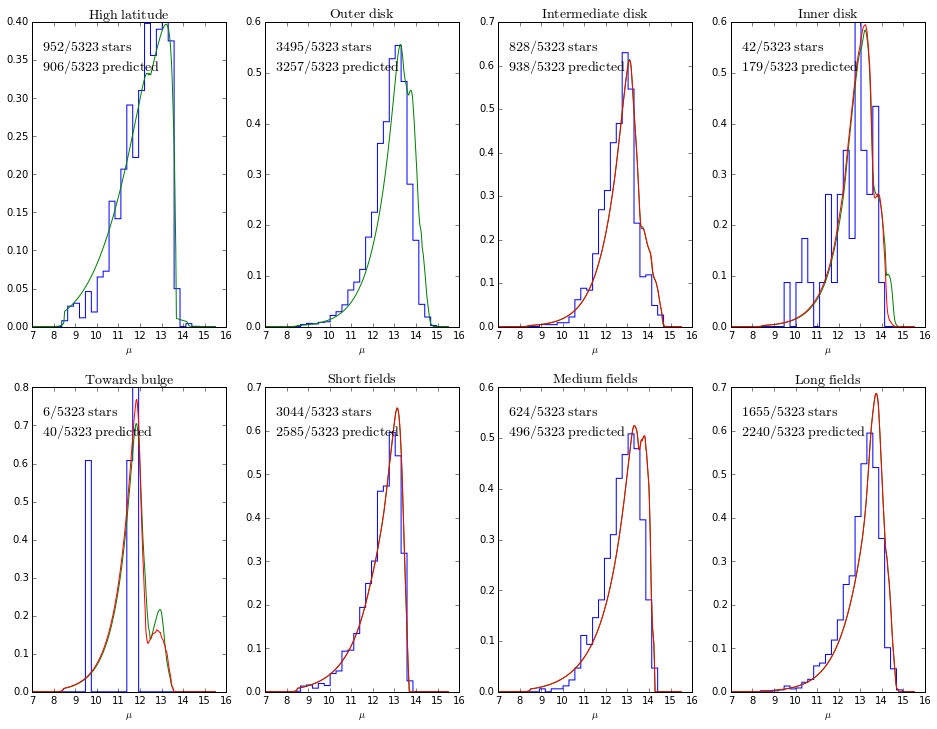

In [33]:
fit(type='expplusconst',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 50435.627794
         Iterations: 116
         Function evaluations: 197


array([-0.2860792 ,  2.10416179,  0.37137729,  2.37827255])

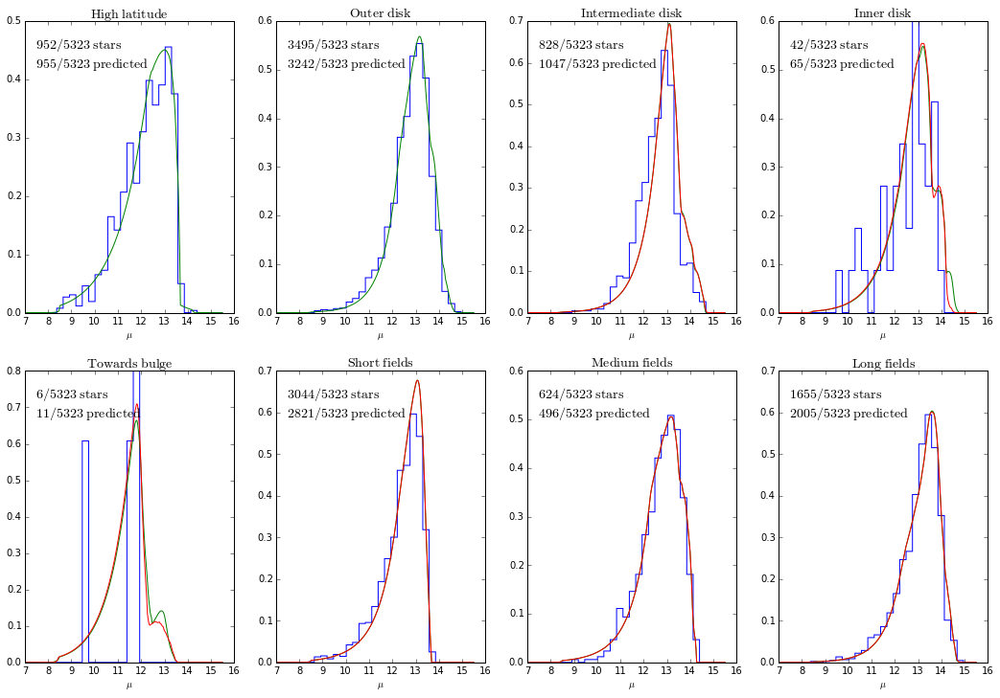

In [9]:
fit(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 50432.421055
         Iterations: 169
         Function evaluations: 286


array([-0.27974677,  2.11179999,  0.36976479,  2.3784276 ])

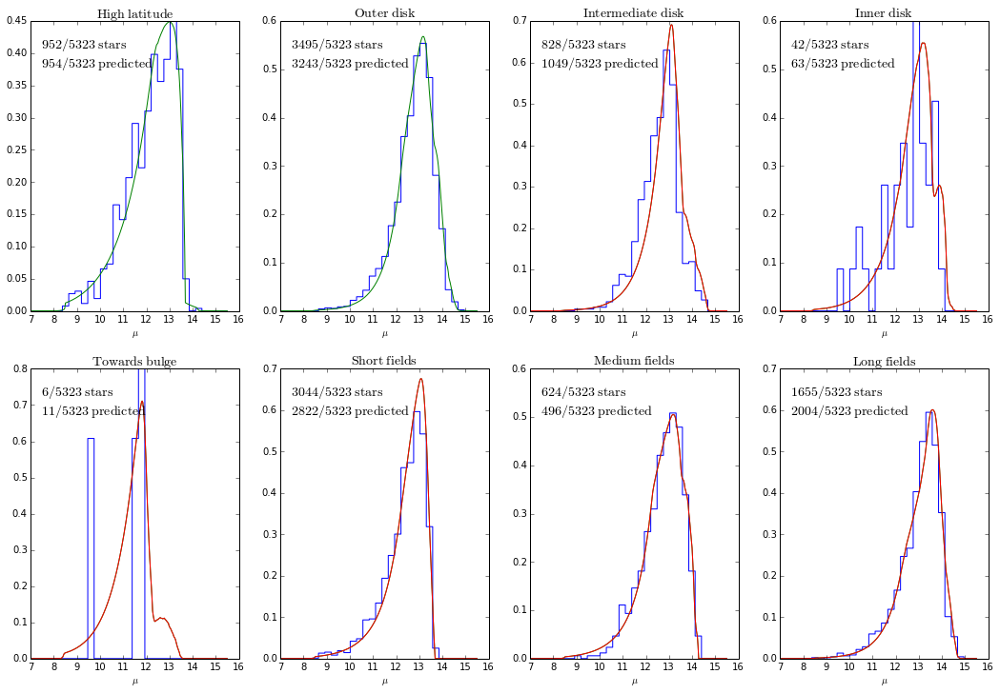

In [85]:
fit(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 51525.821414
         Iterations: 224
         Function evaluations: 366


array([-0.33270138,  1.96964778,  0.61718588,  2.38741902])

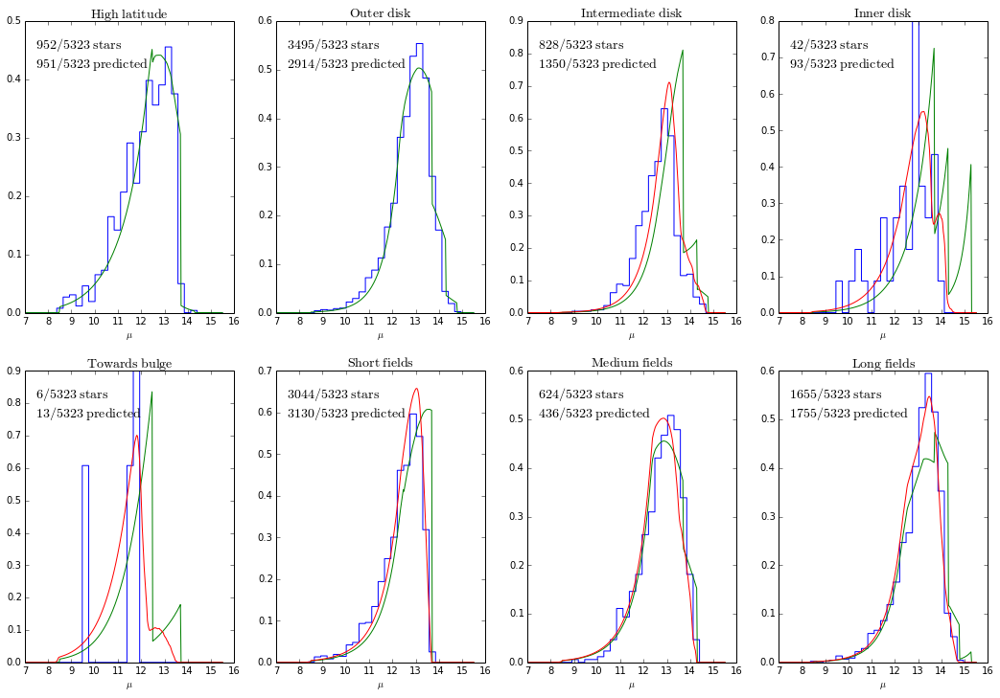

In [225]:
fit(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='zero')

Optimization terminated successfully.
         Current function value: 50395.516584
         Iterations: 264
         Function evaluations: 427


array([-0.26623401,  2.68828866,  0.36345503,  2.38412944, -0.08567938])

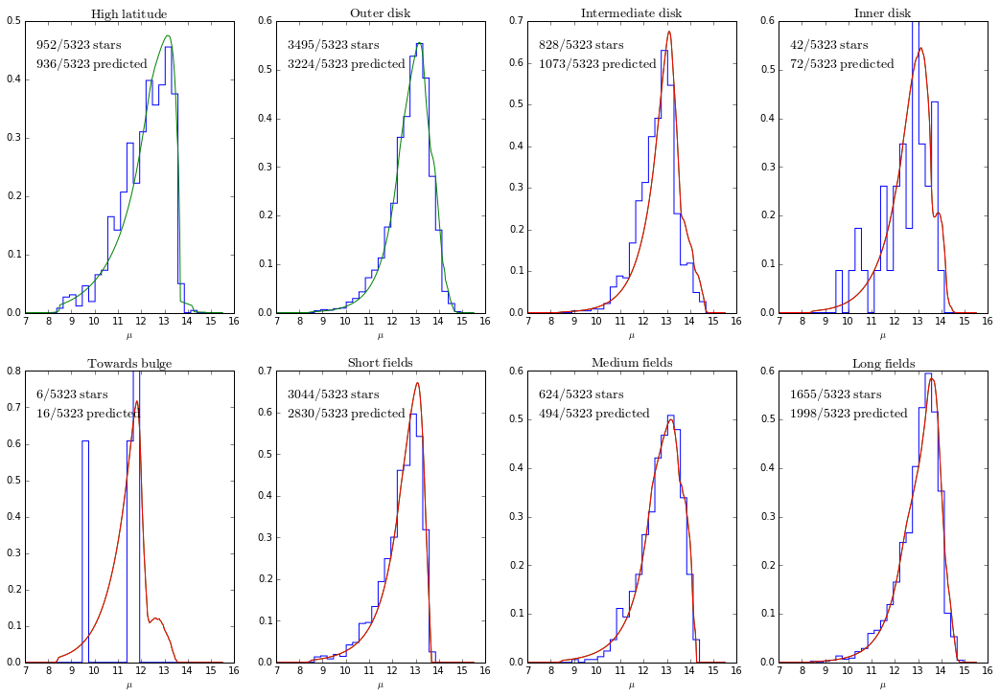

In [8]:
fit(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 50389.831672
         Iterations: 322
         Function evaluations: 529


array([ 0.26483203,  2.7494468 ,  0.35486861,  2.38413029, -0.04582557])

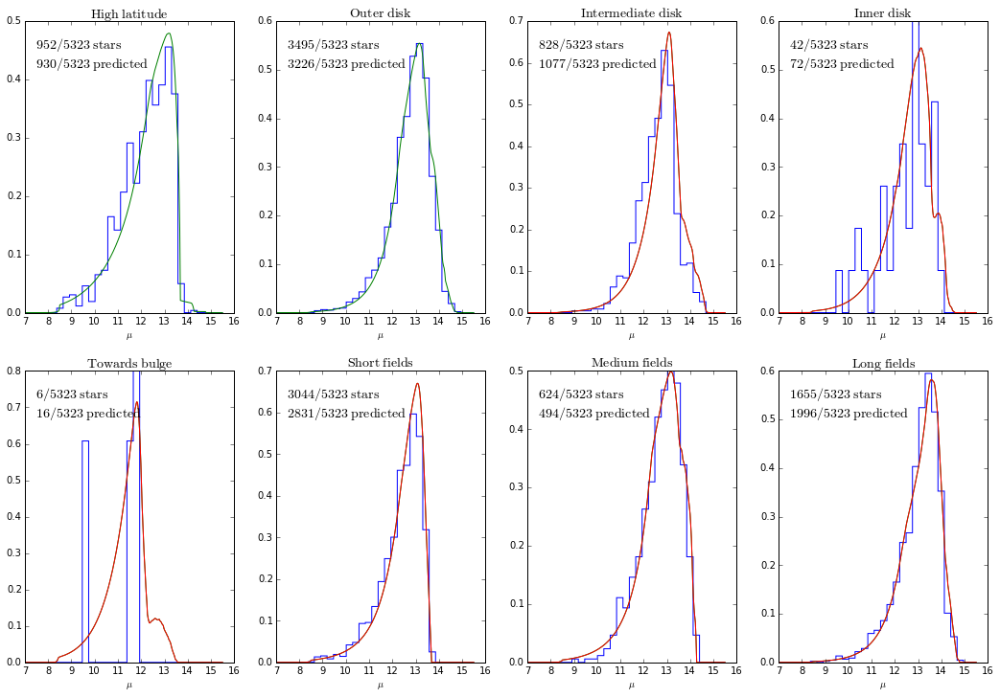

In [9]:
fit(type='tribrokenexplinflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 50435.627759
         Iterations: 140
         Function evaluations: 237


array([ 0.28601156,  2.10417451,  0.37120615,  2.37827569])

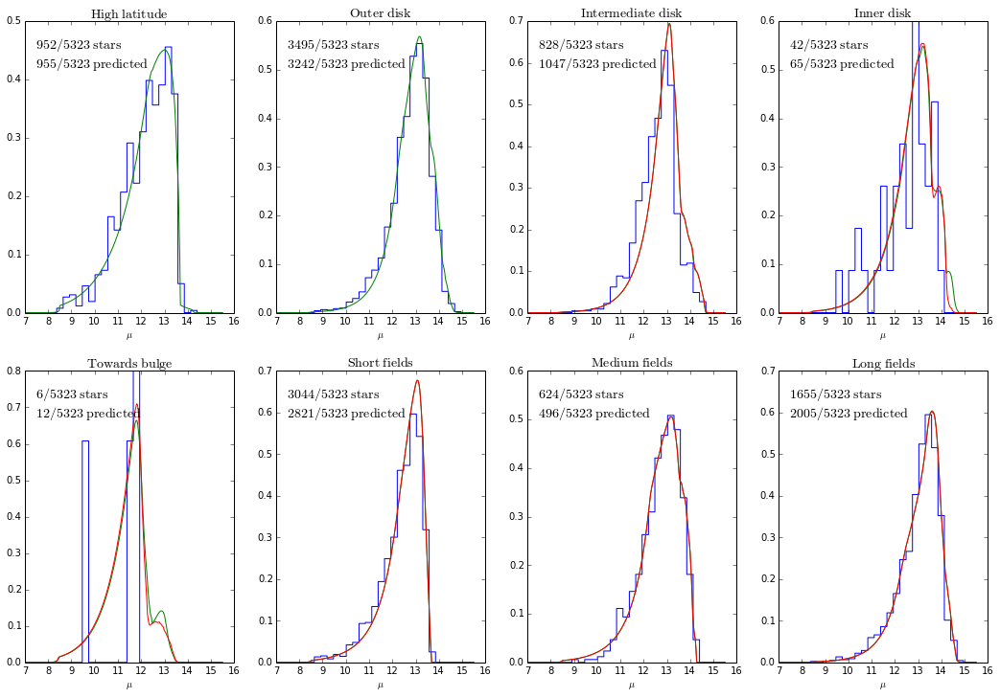

In [10]:
fit(type='tribrokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 50418.994788
         Iterations: 61
         Function evaluations: 114


array([ 0.41739384,  2.10426461,  2.3485529 ])

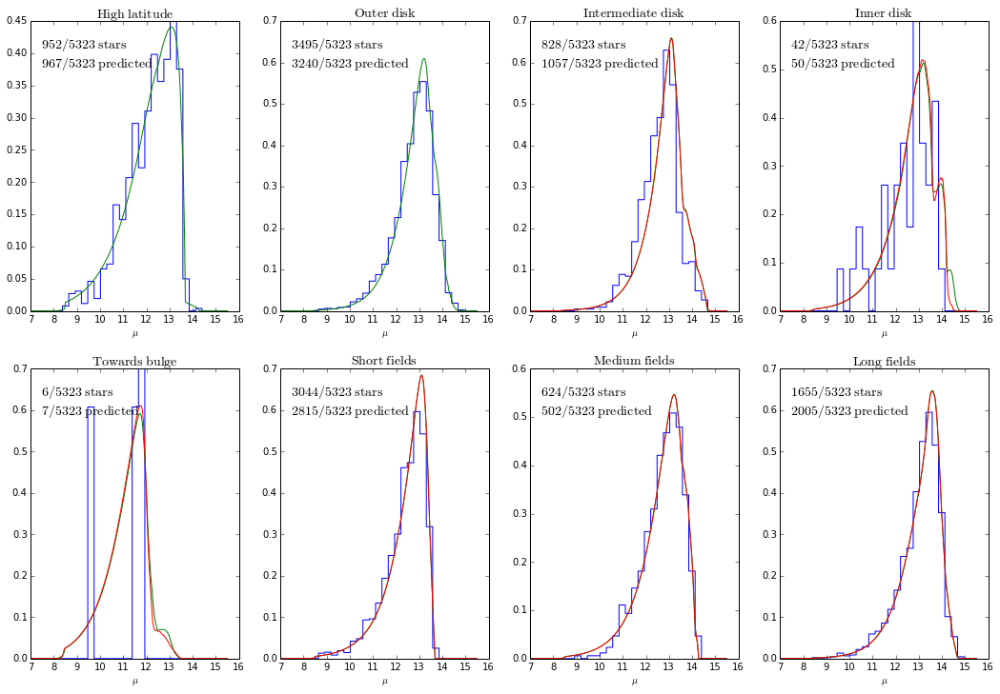

In [11]:
fit(type='gaussexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 50432.421047
         Iterations: 172
         Function evaluations: 289


array([ -2.79739454e-01,   2.11181551e+00,   3.69798054e-01,
         2.37842700e+00,  -4.17451022e-04,   2.11195708e+00])

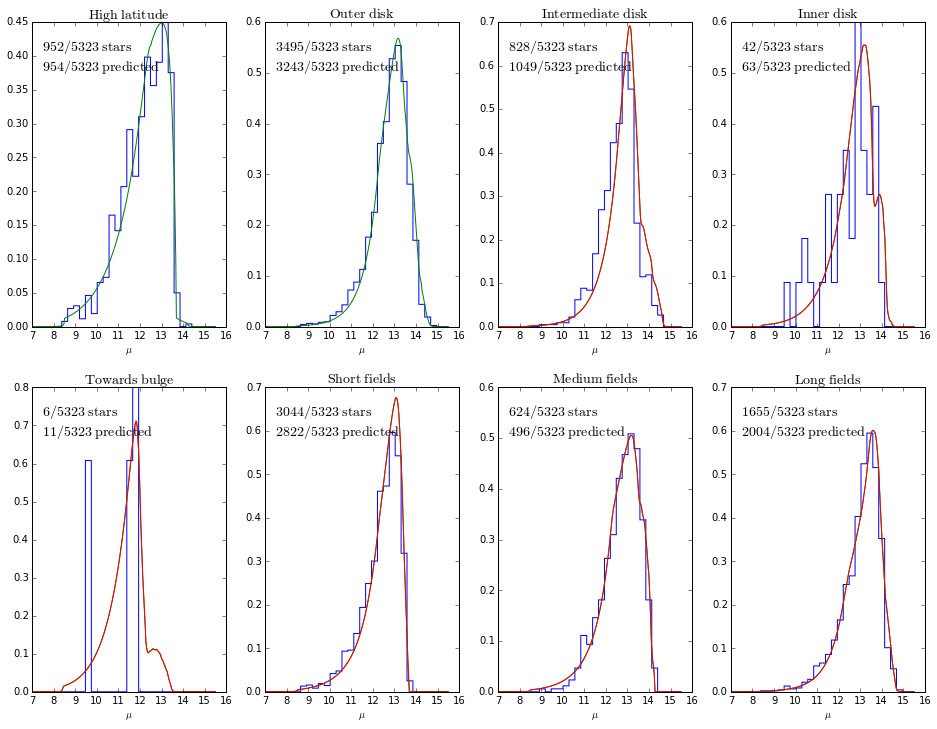

In [34]:
fit(type='brokentwoexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 50395.516583
         Iterations: 357
         Function evaluations: 552


array([ -2.66244085e-01,   2.68832570e+00,   3.63461402e-01,
         2.38412938e+00,  -1.40999259e-03,   2.68818548e+00,
        -8.56841866e-02])

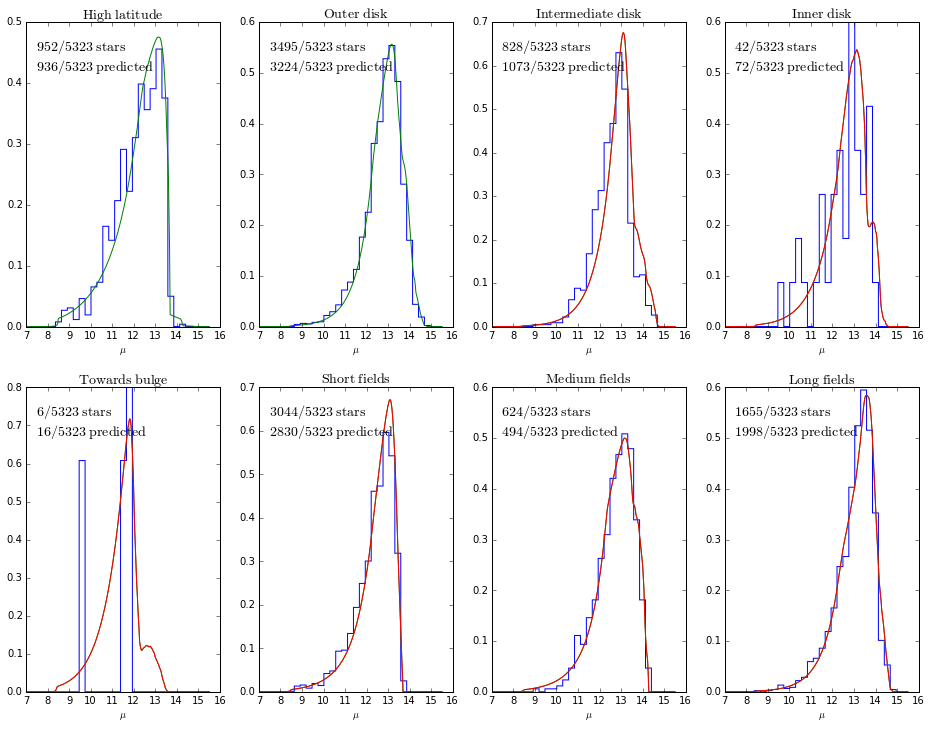

In [35]:
fit(type='brokentwoexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 50435.627739
         Iterations: 184
         Function evaluations: 314
/Library/Python/2.7/site-packages/MarkovPy-0.1-py2.7.egg/markovpy/ensemble.py:234: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if lnprob == None:

Mean, standard devs, acor tau, acor mean, acor s ...
-0.290177261226 0.0386773432331 [ 41.72416767] [-0.29017726] [ 0.00249936]
2.10285597921 0.0400327042427 [ 57.06593115] [ 2.10285598] [ 0.00302543]
0.370757297926 0.0226878556762 [ 49.28618963] [ 0.3707573] [ 0.00159315]
2.37919802367 0.0349445310403 [ 67.94337954] [ 2.37919802] [ 0.00288177]
Quantiles:
[(0.16, -0.31325741893874326), (0.5, -0.28758293739089191), (0.84, -0.26755364085423777)]
Quantiles:
[(0.16, 2.0688581676357631), (0.5, 2.1053308444089436), (0.84, 2.1367456994601133)]
Quantiles:
[(0.16, 0.34931527391815803), (0.5, 0.37118675578593352), (0.84, 0.39180828480777169)]
Quantiles:


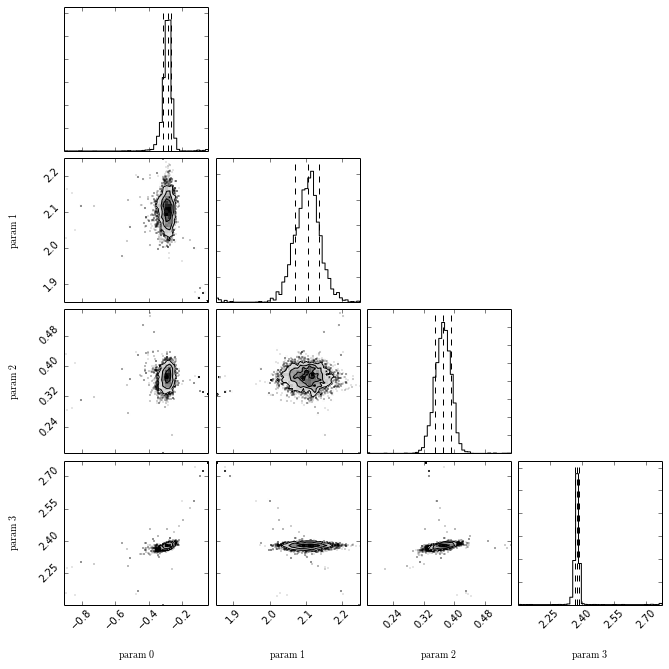

In [12]:
sample(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000)

Optimization terminated successfully.
         Current function value: 50395.516584
         Iterations: 264
         Function evaluations: 427
/Users/bovy/src/markovpy/markovpy/ensemble.py:234: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if lnprob == None:

Mean, standard devs, acor tau, acor mean, acor s ...
-0.26992101392 0.0327459758849 35.2633269102 -0.26992101392 0.00194540041058
2.680733004 0.0835488629171 12.5012487608 2.680733004 0.00295292355641
0.361910102811 0.0264852690045 1.9687658257 0.361910102811 0.000371710352391
2.38289926433 0.0180163147444 18.0593961894 2.38289926433 0.000765937182606
-0.0847043481718 0.0165364264314 18.6143384067 -0.0847043481718 0.000713613195444
Quantiles:
[(0.16, -0.29167973072810877), (0.5, -0.2668967662062996), (0.84, -0.24522575588392392)]
Quantiles:
[(0.16, 2.6002674196551849), (0.5, 2.6782797257369411), (0.84, 2.7628719056206634)]
Quantiles:
[(0.16, 0.3418580246846602), (0.5, 0.36080

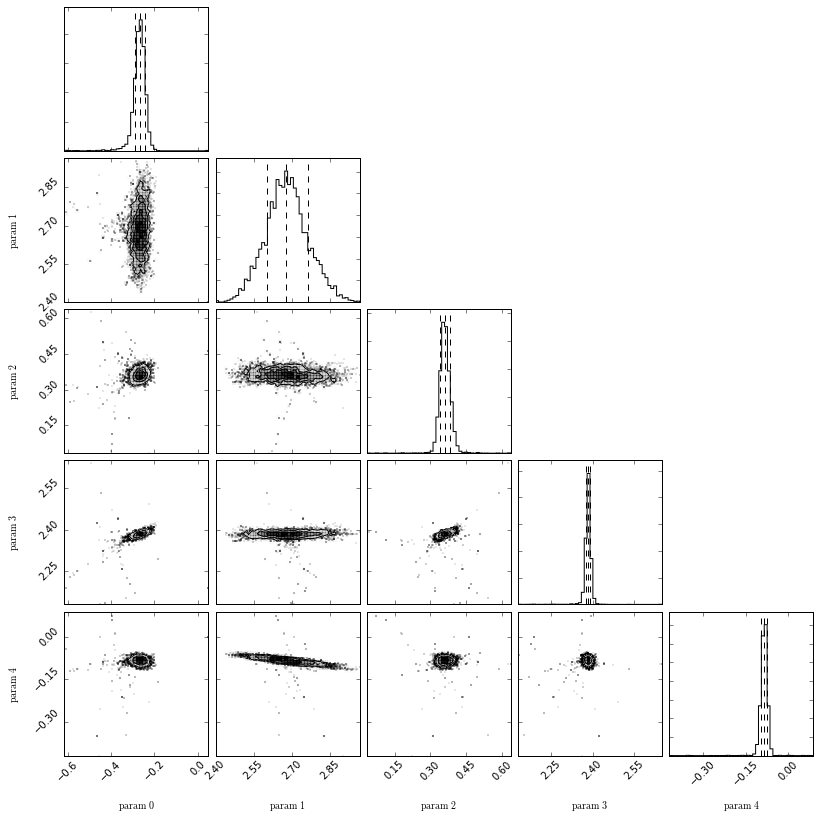

In [10]:
sample(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 50389.831672
         Iterations: 322
         Function evaluations: 529
Mean, standard devs, acor tau, acor mean, acor s ...
0.270068826183 0.029297390598 18.5421339047 0.270068826183 0.0012619372723
2.76109858053 0.0890625609725 10.2982411034 2.76109858053 0.00285849463603
0.35456674545 0.0288246670198 1.72544934336 0.35456674545 0.000378711002536
2.38249886091 0.0147255464697 5.25928607738 2.38249886091 0.00033779851095
-0.0466893337543 0.0132537318 23.2799974252 -0.0466893337543 0.000639783420214
Quantiles:
[(0.16, 0.24845666281956622), (0.5, 0.26846172881115299), (0.84, 0.28878010508942503)]
Quantiles:
[(0.16, 2.6736741861168696), (0.5, 2.7633062906918284), (0.84, 2.8475148644085673)]
Quantiles:
[(0.16, 0.33369534251470995), (0.5, 0.35346500553220894), (0.84, 0.37593964804302588)]
Quantiles:
[(0.16, 2.3755342926697836), (0.5, 2.383017044972477), (0.84, 2.3897547772050216)]
Quantiles:
[(0.16, -0.0499636974593275

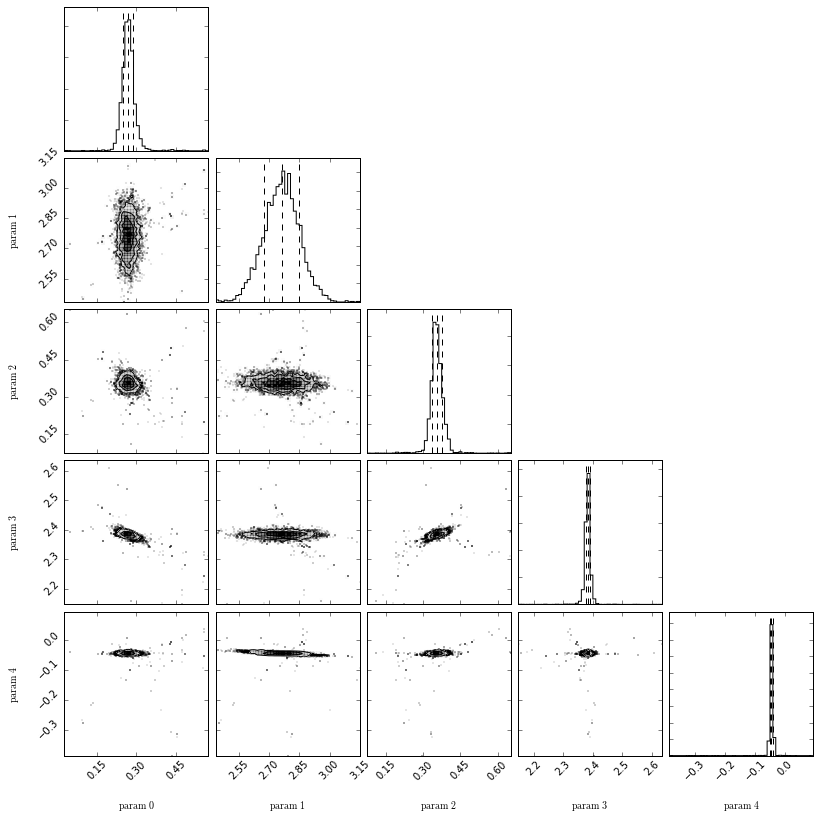

In [12]:
sample(type='tribrokenexplinflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000,dmap='marshall06')

# The solar-abundances subsample

In [36]:
load_data(subsample='solar')
fitIndx= None #True-highbIndx
data_fitIndx= None #True-data_highbIndx

Optimization terminated successfully.
         Current function value: 38141.887828
         Iterations: 83
         Function evaluations: 153


array([ 0.31391442,  3.14597225, -7.60498254])

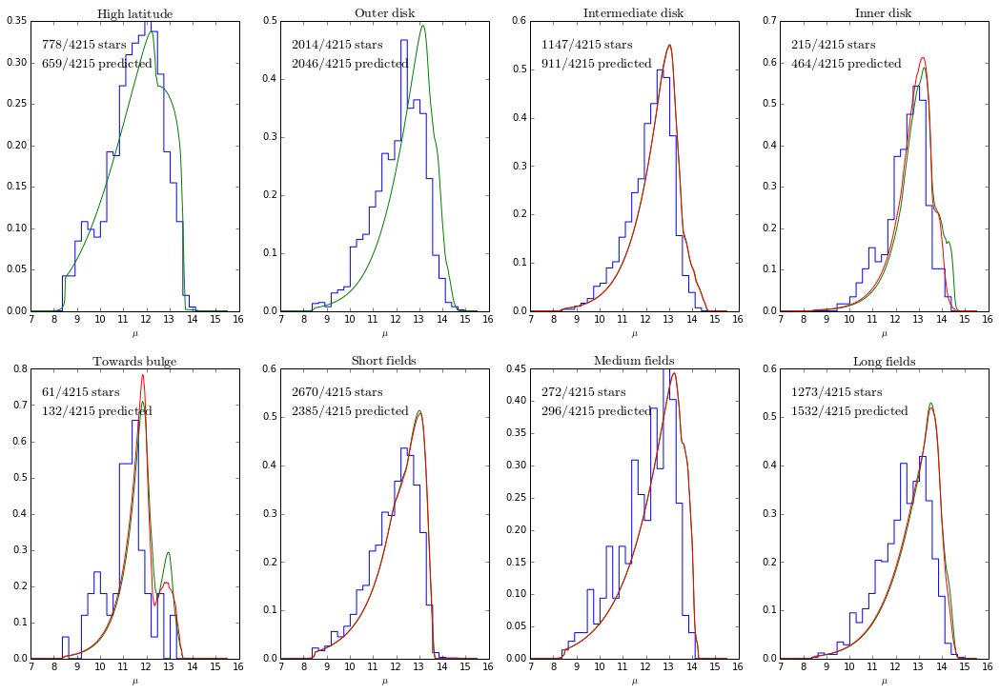

In [14]:
fit(type='expplusconst',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 37684.532069
         Iterations: 139
         Function evaluations: 241


array([-0.14117556,  3.02239417,  0.65289706,  2.21839777])

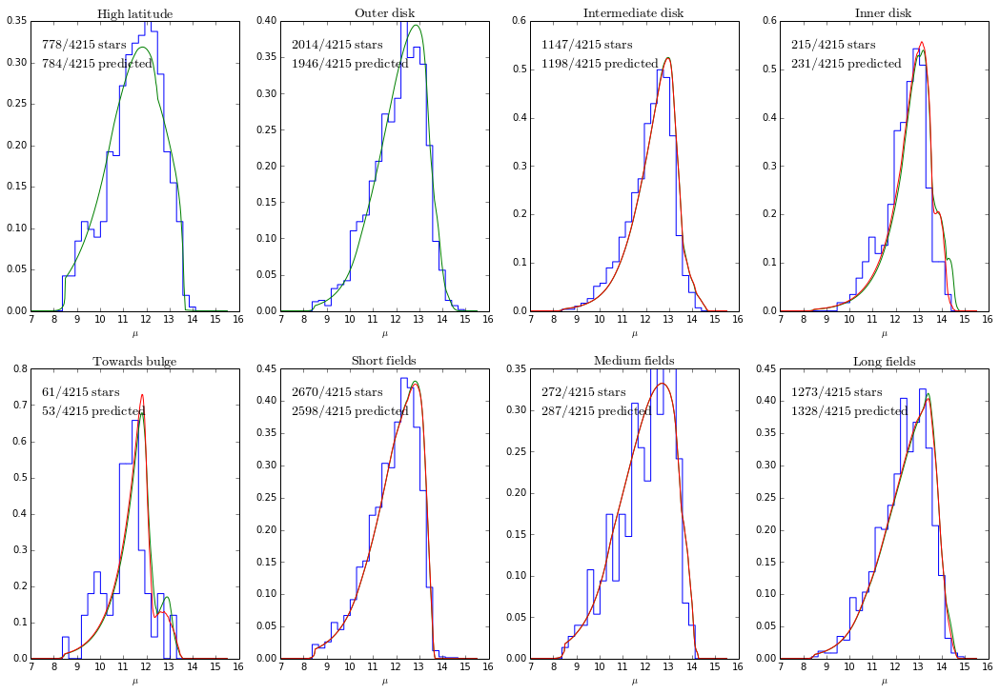

In [15]:
fit(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 37656.321057
         Iterations: 126
         Function evaluations: 220


array([-0.11105643,  3.06232169,  0.65306615,  2.22035022])

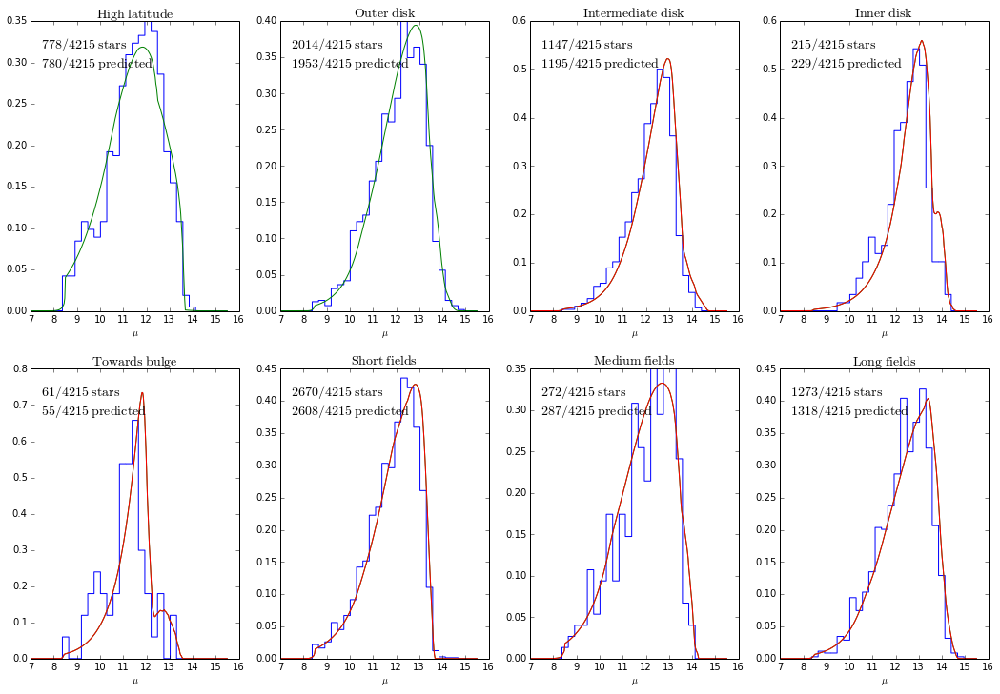

In [90]:
fit(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 38357.527945
         Iterations: 181
         Function evaluations: 301


array([-0.27586568,  2.83004669,  0.78744044,  2.23252104])

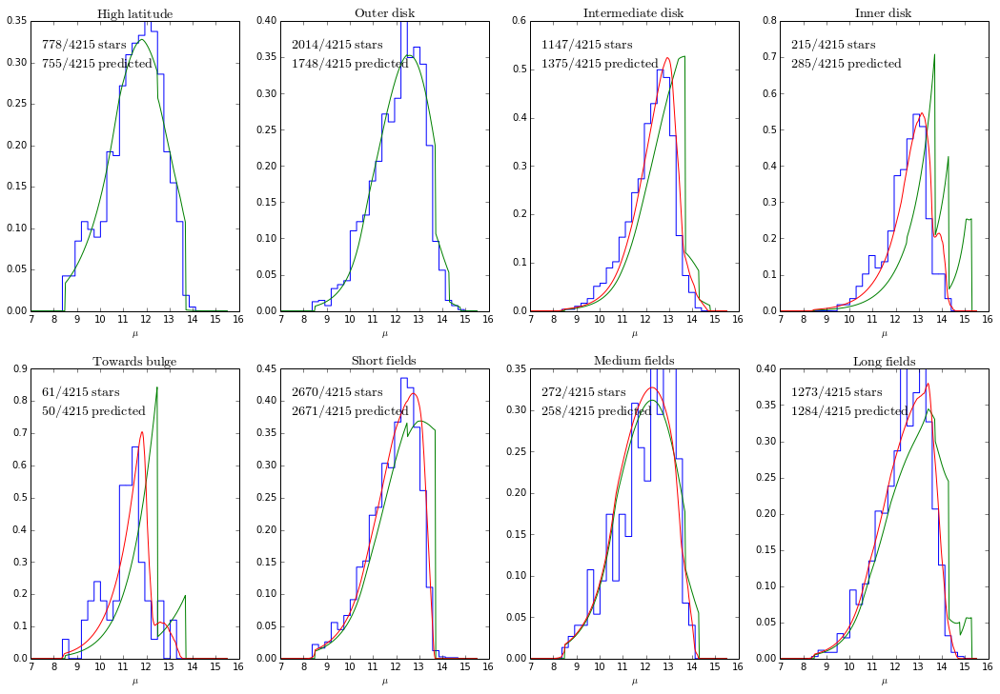

In [89]:
fit(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='zero')

Optimization terminated successfully.
         Current function value: 37611.119026
         Iterations: 221
         Function evaluations: 362


array([-0.10110613,  3.54024476,  0.64514349,  2.22068504, -0.08783547])

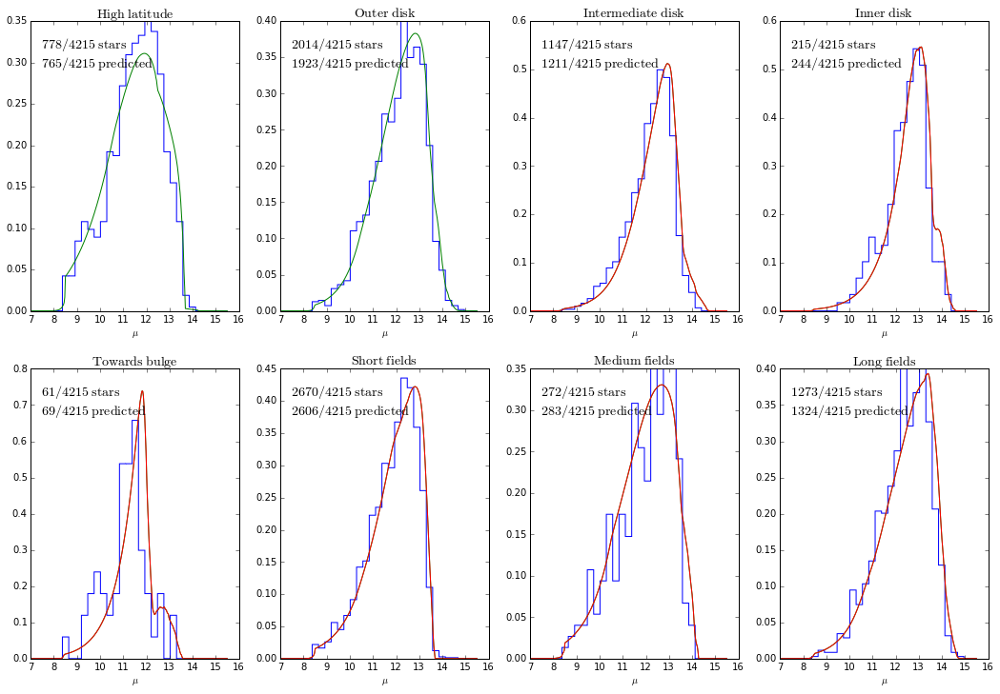

In [14]:
fit(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 37601.786571
         Iterations: 216
         Function evaluations: 349


array([ 0.09706641,  3.6824881 ,  0.63770142,  2.22060838, -0.05447404])

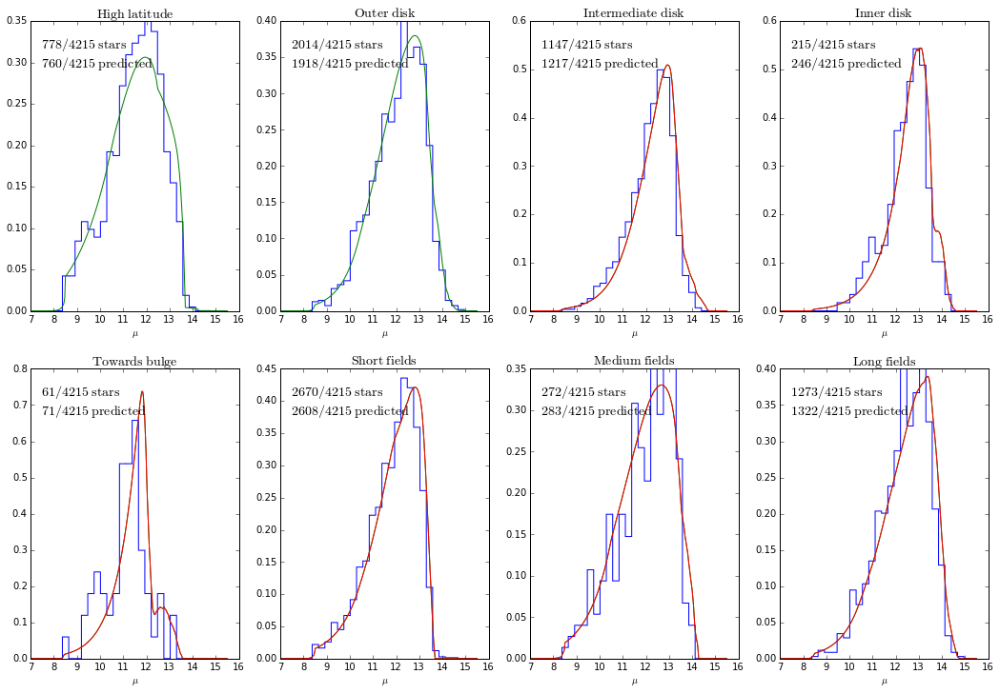

In [16]:
fit(type='tribrokenexplinflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 37656.321053
         Iterations: 301
         Function evaluations: 480


array([ -1.11068191e-01,   3.06213146e+00,   6.53046275e-01,
         2.22035258e+00,  -1.09872191e-03,   3.06245369e+00])

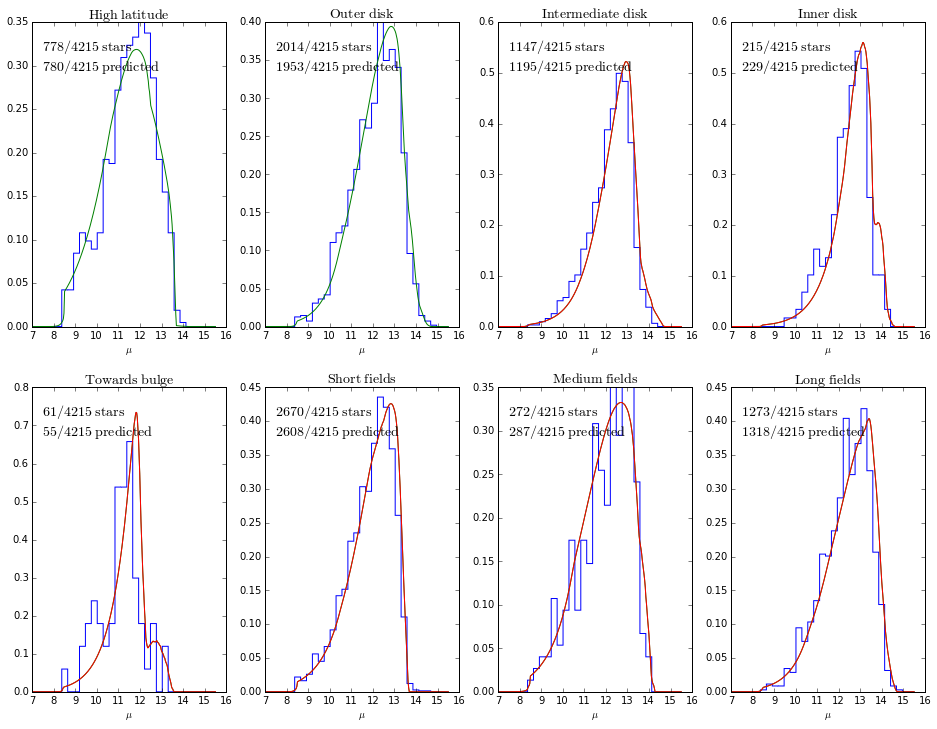

In [37]:
fit(type='brokentwoexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 37611.119028
         Iterations: 439
         Function evaluations: 672


array([ -1.01106929e-01,   3.54015885e+00,   6.45144079e-01,
         2.22068511e+00,  -1.49066181e-03,   3.54009663e+00,
        -8.78251708e-02])

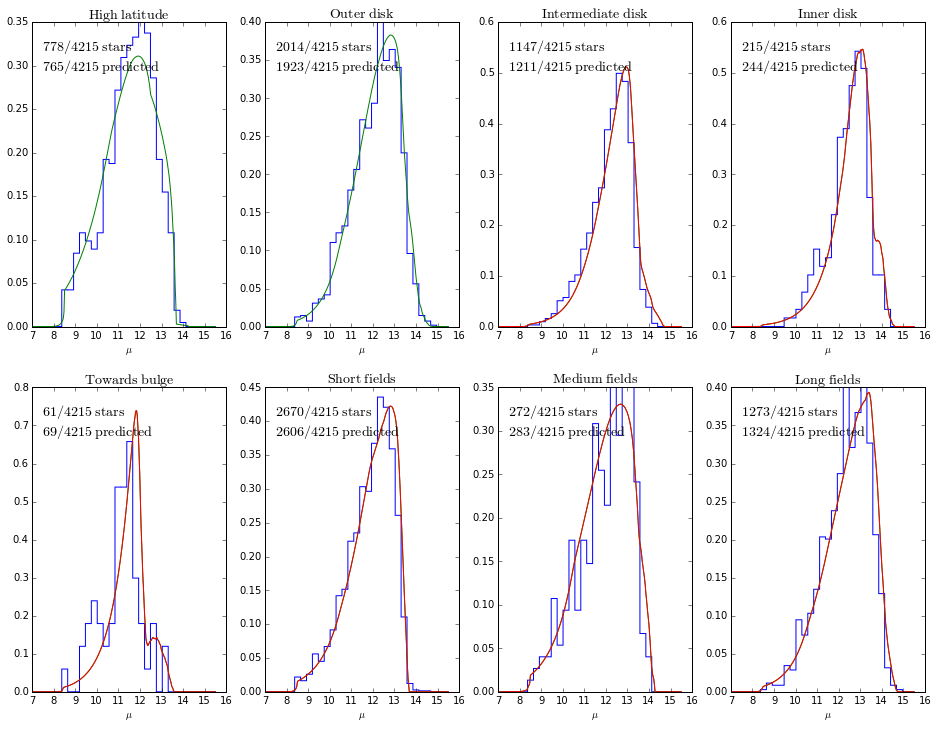

In [38]:
fit(type='brokentwoexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 37684.452631
         Iterations: 602
         Function evaluations: 977


array([-0.14205882,  3.02237777,  0.65022631,  2.216517  , -4.4637543 ])

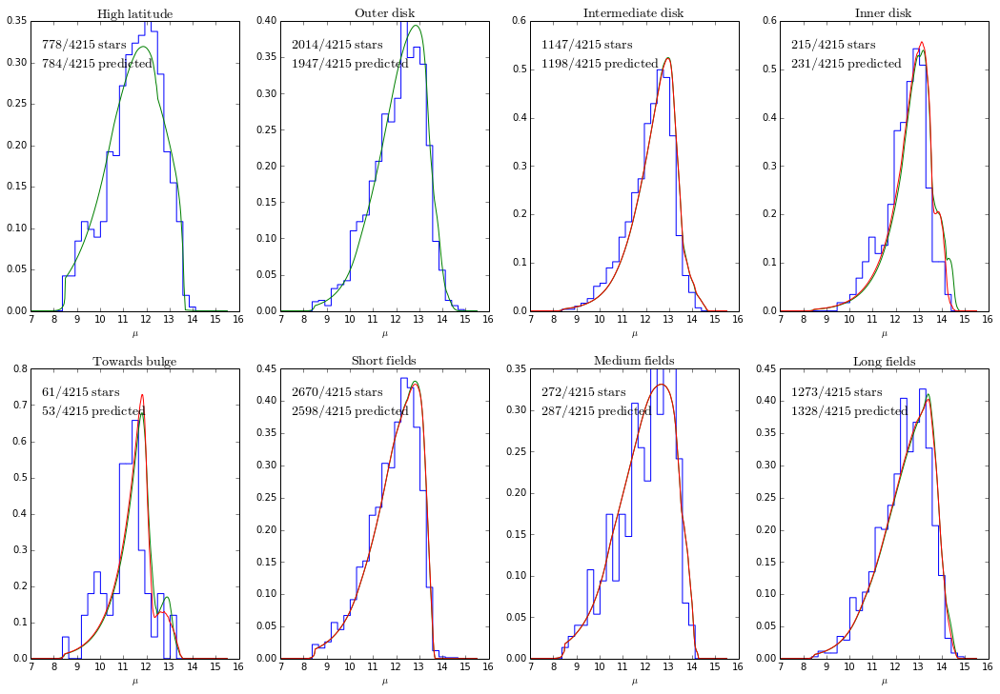

In [16]:
fit(type='brokenexpfixedspiral',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 37707.447645
         Iterations: 69
         Function evaluations: 125


array([ 0.43188101,  3.05776732,  2.0467248 ])

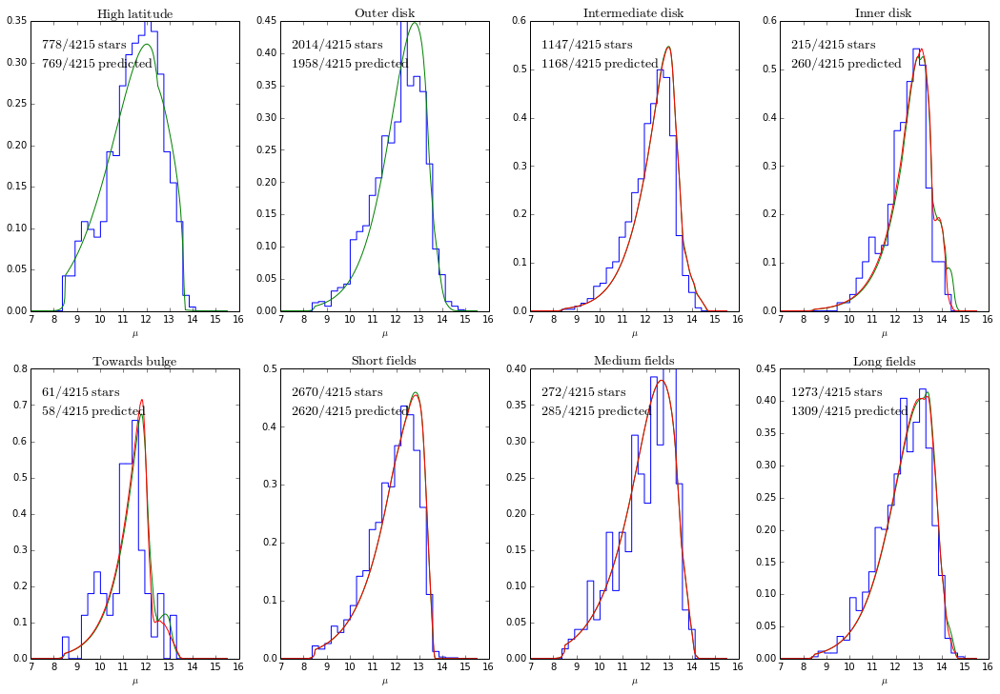

In [17]:
fit(type='gaussexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 37684.532069
         Iterations: 139
         Function evaluations: 241
Mean, standard devs, acor tau, acor mean, acor s ...
-0.137003042843 0.0295685835838 [ 38.86311408] [-0.13700304] [ 0.00184367]
3.01499848064 0.055359878901 [ 41.00842721] [ 3.01499848] [ 0.00354395]
0.650704245602 0.0280528961564 [ 41.80091616] [ 0.65070425] [ 0.00181434]
2.21891729501 0.0183503296486 [ 28.04701196] [ 2.2189173] [ 0.00097217]
Quantiles:
[(0.16, -0.1629688575410721), (0.5, -0.13650230737743713), (0.84, -0.10956606615271323)]
Quantiles:
[(0.16, 2.9597946828533312), (0.5, 3.0152378139418001), (0.84, 3.0704129580568003)]
Quantiles:
[(0.16, 0.63362443604820284), (0.5, 0.65177053223260661), (0.84, 0.67146475468550948)]
Quantiles:
[(0.16, 2.2111015847245237), (0.5, 2.2190535382486591), (0.84, 2.2282549875437594)]


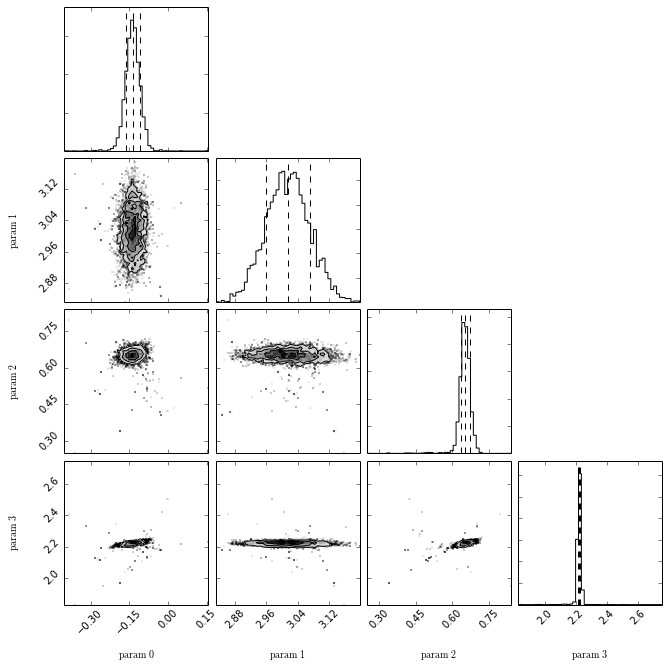

In [18]:
sample(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000)

Optimization terminated successfully.
         Current function value: 37611.119026
         Iterations: 221
         Function evaluations: 362
Mean, standard devs, acor tau, acor mean, acor s ...
-0.0950541248299 0.0315109490922 14.8948667167 -0.0950541248299 0.00121630046334
3.55386080321 0.0856693536216 27.8788863823 3.55386080321 0.00452363538537
0.653741027874 0.023006334651 14.8424681258 0.653741027874 0.000886361016461
2.22472775195 0.0169129546806 32.6544194286 2.22472775195 0.000966534145179
-0.0916607907517 0.019706321023 51.7758545971 -0.0916607907517 0.00141835326088
Quantiles:
[(0.16, -0.1227455262657835), (0.5, -0.095568156190198525), (0.84, -0.065856878214175726)]
Quantiles:
[(0.16, 3.4708192695486257), (0.5, 3.5533769232940711), (0.84, 3.6339486796022666)]
Quantiles:
[(0.16, 0.63330571049495332), (0.5, 0.65241276095080536), (0.84, 0.67371766796680621)]
Quantiles:
[(0.16, 2.21495824590711), (0.5, 2.2234513643919587), (0.84, 2.2369847480310874)]
Quantiles:
[(0.16, -0.1008

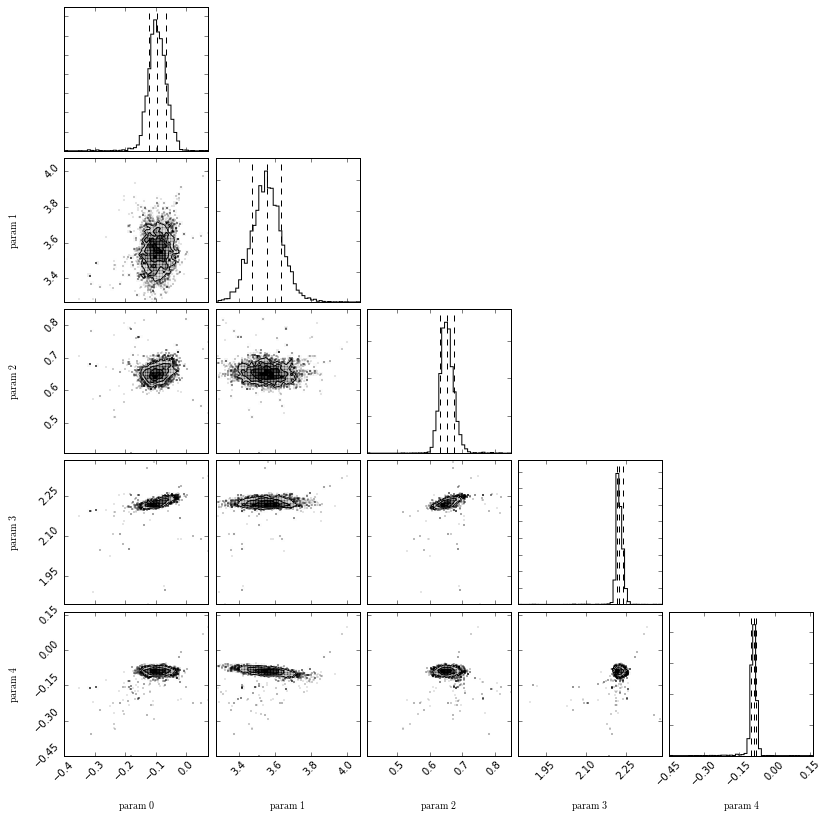

In [17]:
sample(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 37601.786571
         Iterations: 216
         Function evaluations: 349
Mean, standard devs, acor tau, acor mean, acor s ...
0.102553923931 0.0523535199829 231.301162717 0.102553923931 0.00796419691168
3.67253841429 0.0963049858518 150.541062432 3.67253841429 0.0118189832383
0.642120062681 0.0290795962768 24.1663319402 0.642120062681 0.0014300144021
2.22387074191 0.0241261212674 28.1429537318 2.22387074191 0.0012803534007
-0.0528425108262 0.0133655992601 38.7007778949 -0.0528425108262 0.000831850003029
Quantiles:
[(0.16, 0.062446039367502669), (0.5, 0.092415365993509552), (0.84, 0.1317182887687221)]
Quantiles:
[(0.16, 3.5809224650806719), (0.5, 3.6827813699401517), (0.84, 3.7655584104388726)]
Quantiles:
[(0.16, 0.62067888779235214), (0.5, 0.64075380026687279), (0.84, 0.66162704667981009)]
Quantiles:
[(0.16, 2.211956065939797), (0.5, 2.2231926747873114), (0.84, 2.2372752132215292)]
Quantiles:
[(0.16, -0.057847900390

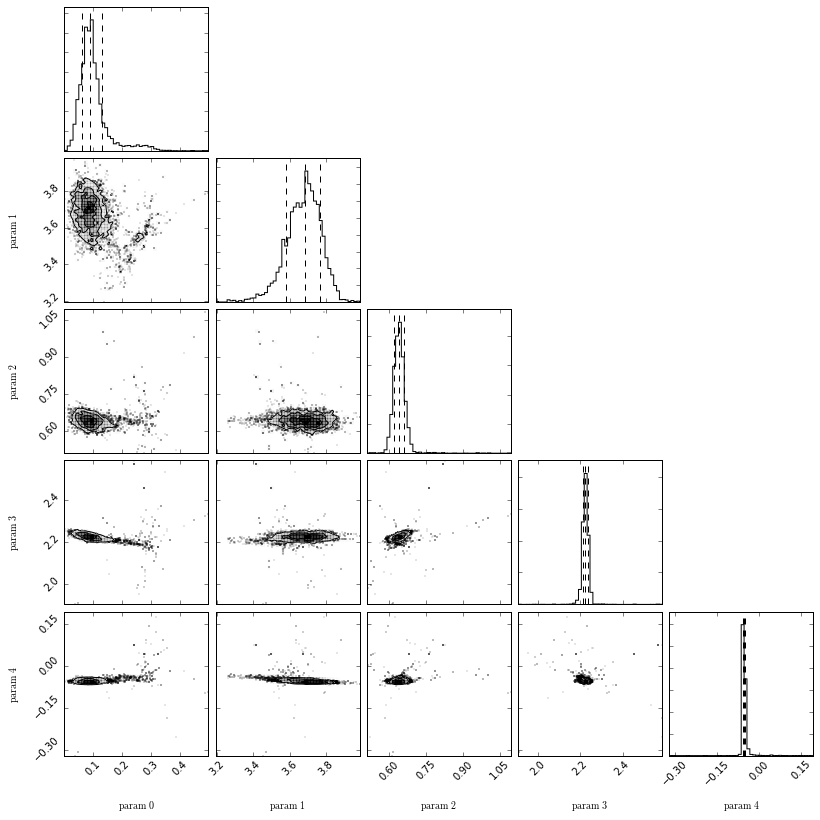

In [18]:
sample(type='tribrokenexplinflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 37684.532068
         Iterations: 283
         Function evaluations: 455
Mean, standard devs, acor tau, acor mean, acor s ...
0.14505311359 0.0282436780679 [ 26.99494139] [ 0.14505311] [ 0.00146808]
3.0189176596 0.0827676741385 [ 35.99078808] [ 3.01891766] [ 0.00496712]
0.657349103605 0.0242380878876 [ 42.54550358] [ 0.6573491] [ 0.00158164]
2.21771188385 0.0146342627886 [ 23.79707807] [ 2.21771188] [ 0.00071423]
-3.29665960449 2.4459367136 [ nan] [-3.2966596] [ nan]
3.70375387892 2.20343352853 [ 38.40327226] [ 3.70375388] [ 0.13661131]
Quantiles:
[(0.16, 0.11779995438892074), (0.5, 0.1458873271268861), (0.84, 0.16991824360218069)]
Quantiles:
[(0.16, 2.9445357544285438), (0.5, 3.0162233592684484), (0.84, 3.0957568028597544)]
Quantiles:
[(0.16, 0.63812447125415273), (0.5, 0.656831615299585), (0.84, 0.67446592587255971)]
Quantiles:
[(0.16, 2.2101882274926963), (0.5, 2.2178738577307207), (0.84, 2.2255862403110642)]
Qua

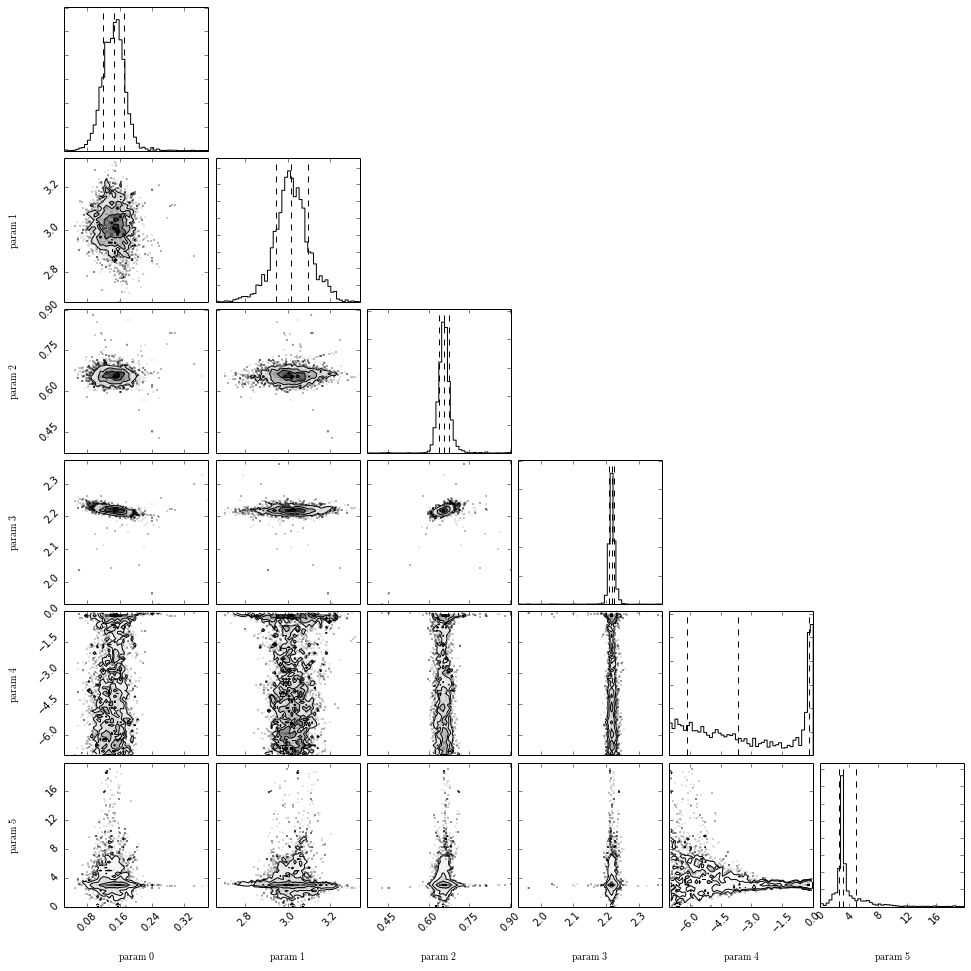

In [328]:
sample(type='tribrokentwoexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000)

# The high metallicity subsample

In [39]:
load_data(subsample='highfeh')
fitIndx= None #True-highbIndx
data_fitIndx= None #True-data_highbIndx

Optimization terminated successfully.
         Current function value: 12788.861831
         Iterations: 196
         Function evaluations: 388


array([  0.56594128,   3.376182  , -34.01565111])

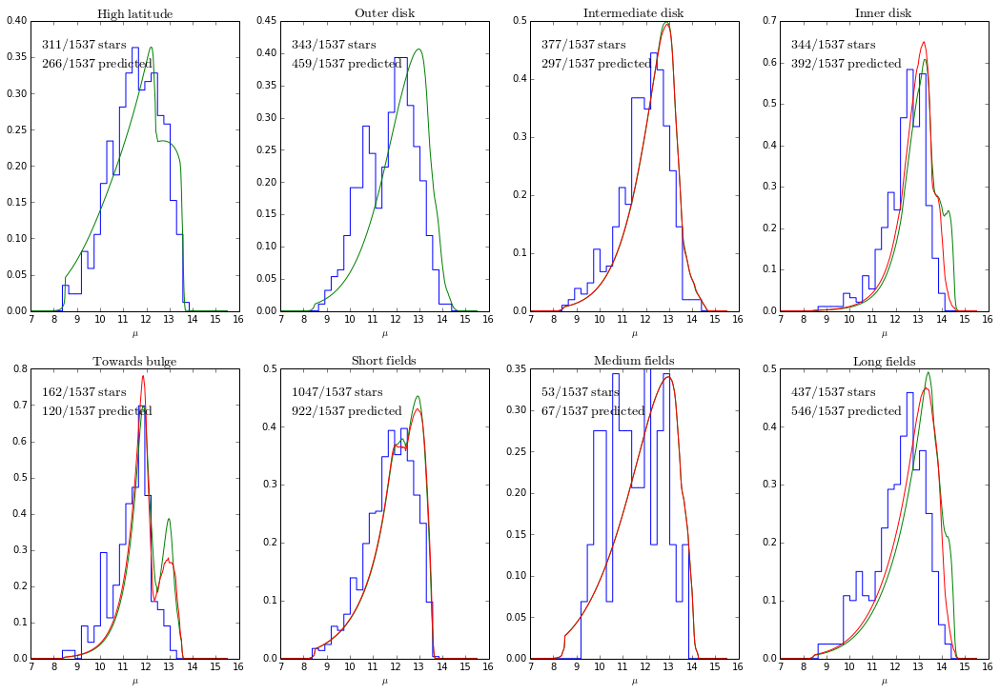

In [20]:
fit(type='expplusconst',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 12563.404758
         Iterations: 189
         Function evaluations: 314


array([-0.58047311,  3.52203845,  0.79996553,  1.87896841])

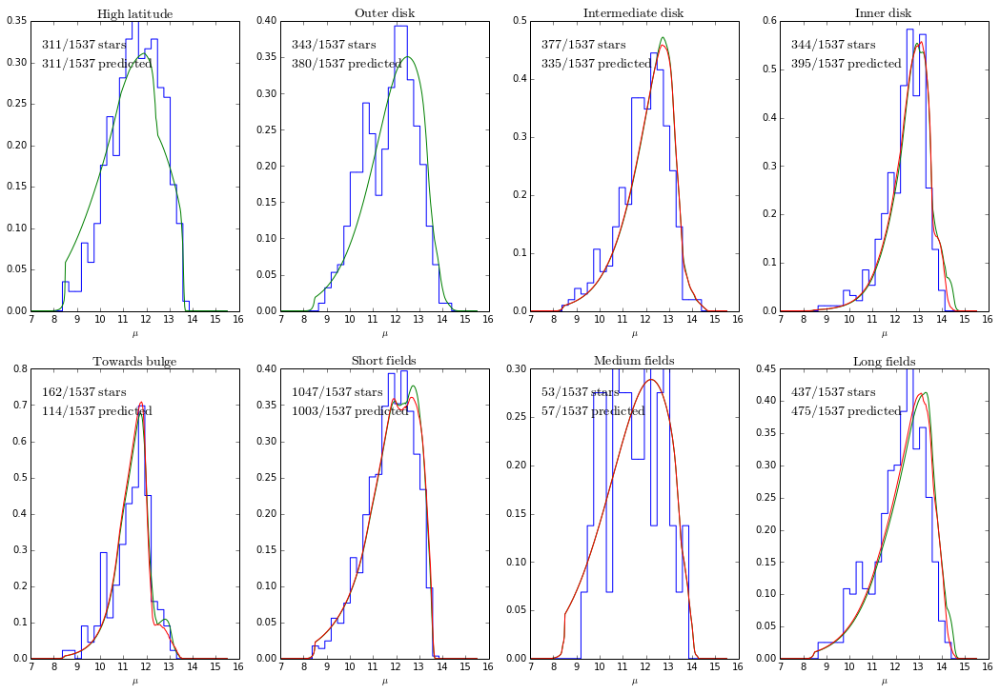

In [21]:
fit(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 12529.214385
         Iterations: 160
         Function evaluations: 274


array([-0.06789118,  3.67144599,  0.87537555,  1.98528865])

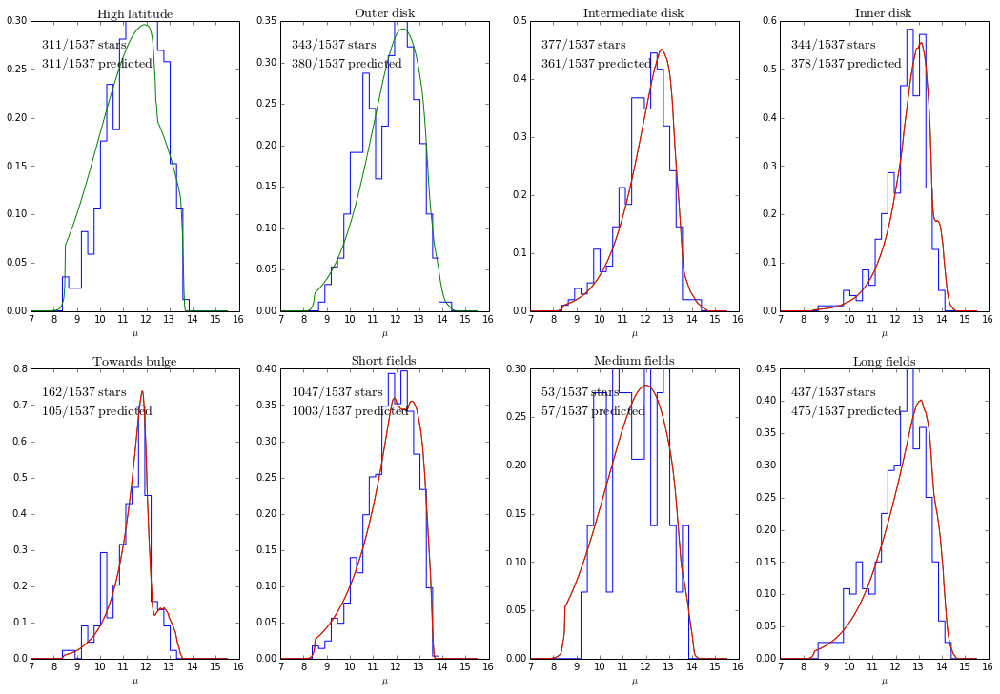

In [92]:
fit(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 12915.715800
         Iterations: 183
         Function evaluations: 312


array([-1.03578259,  3.21164622,  0.79636181,  1.8762249 ])

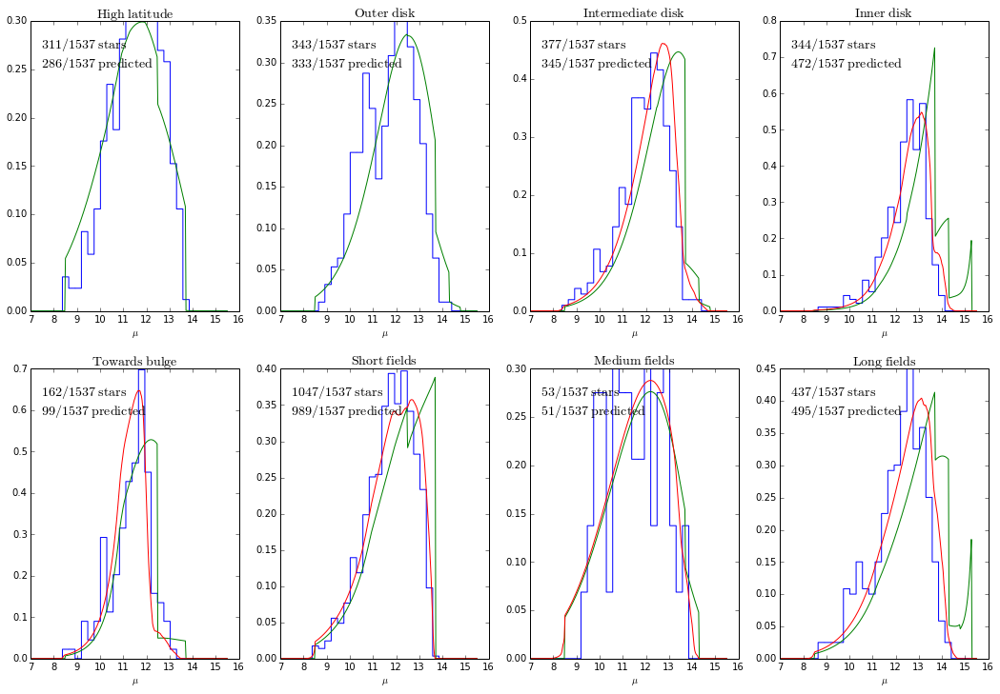

In [93]:
fit(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='zero')

Optimization terminated successfully.
         Current function value: 12479.035096
         Iterations: 510
         Function evaluations: 805


array([-0.36465361,  3.73886146,  0.79592929,  1.89325144, -0.13727103])

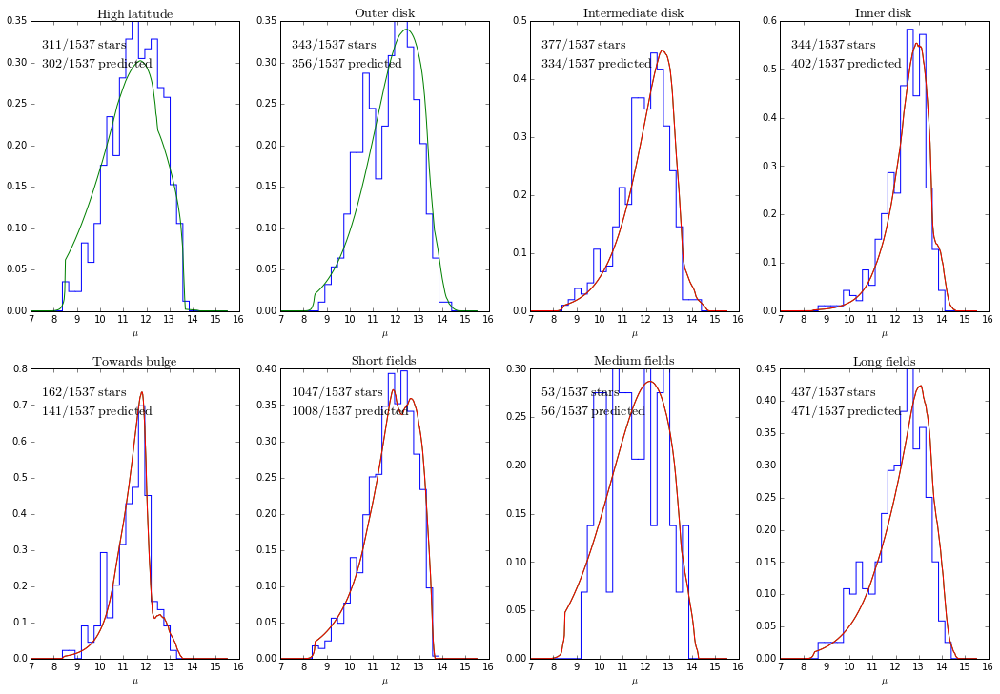

In [20]:
fit(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 12470.896288
         Iterations: 263
         Function evaluations: 431


array([ 0.35325678,  3.87998601,  0.78006114,  1.89263948, -0.0896969 ])

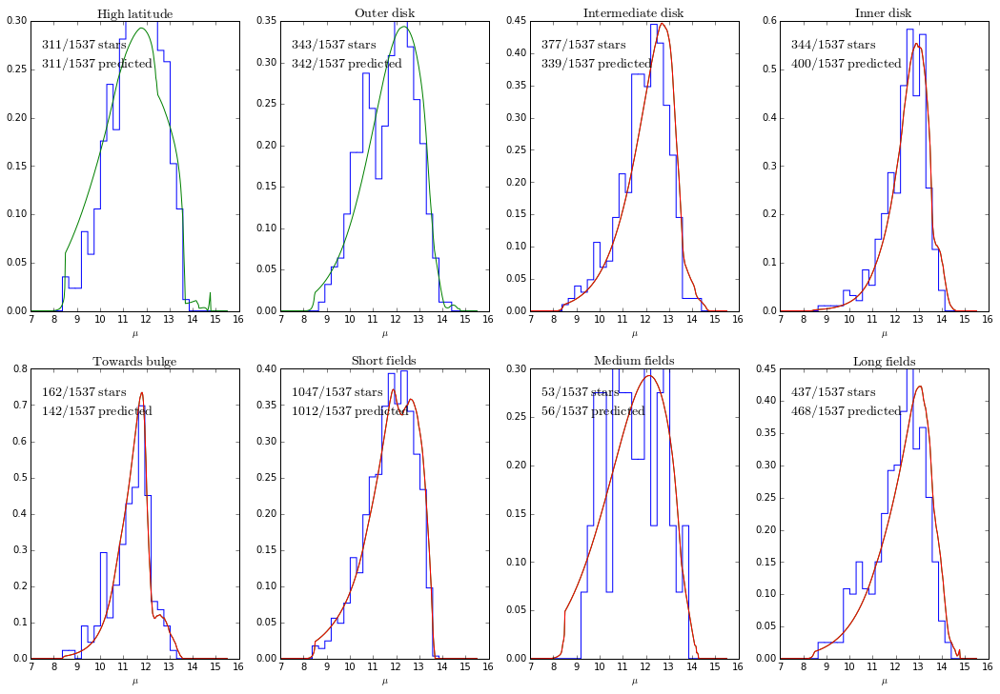

In [21]:
fit(type='tribrokenexplinflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 12585.957279
         Iterations: 79
         Function evaluations: 145


array([ 0.46470151,  3.46529491,  1.72386158])

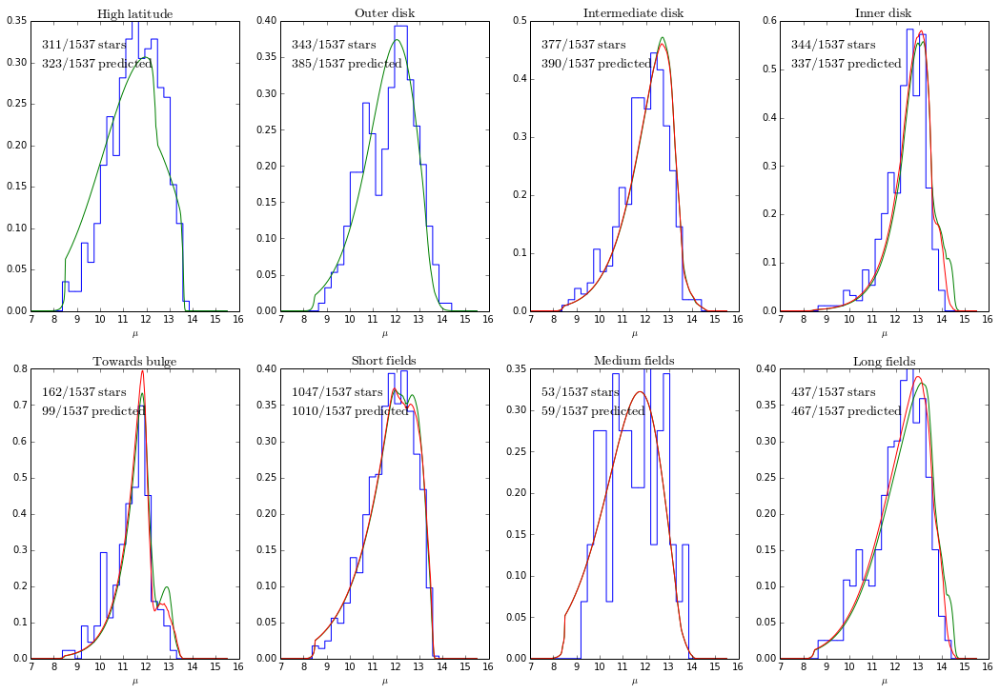

In [22]:
fit(type='gaussexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 12694.617642
         Iterations: 240
         Function evaluations: 411


array([-0.74719408,  3.63374011,  0.6035629 ,  0.08813267, -0.00418365,
        3.63371746])

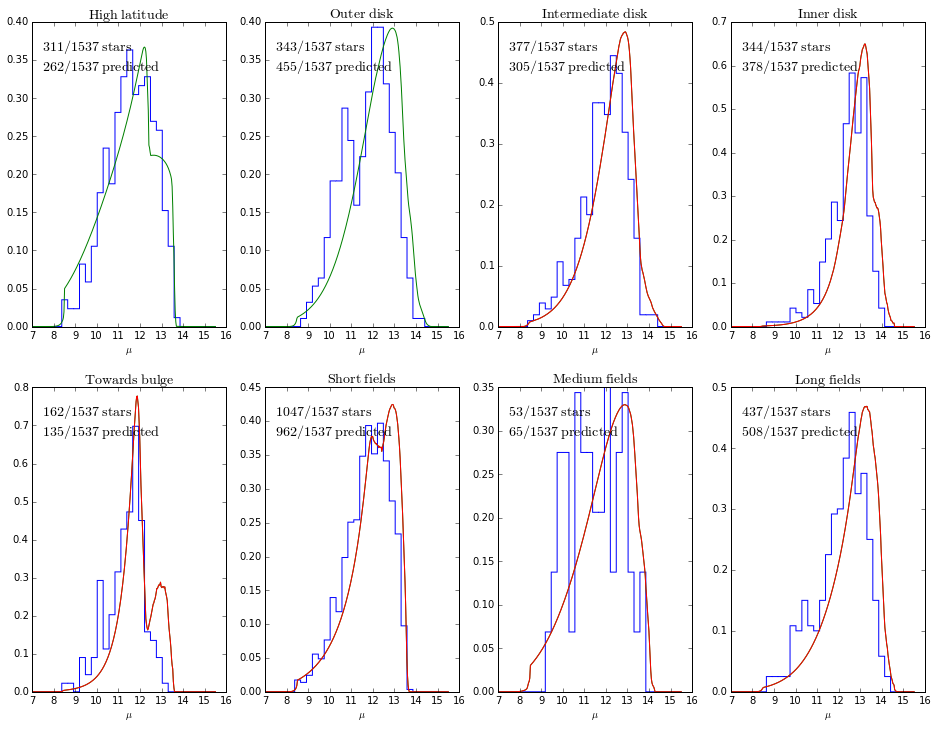

In [40]:
fit(type='brokentwoexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 12638.372354
         Iterations: 291
         Function evaluations: 471


array([  1.10169248e-02,   3.63426564e+00,   5.94467199e-01,
         4.47904031e-01,  -2.86212266e-03,   3.63435183e+00,
        -1.47206275e-01])

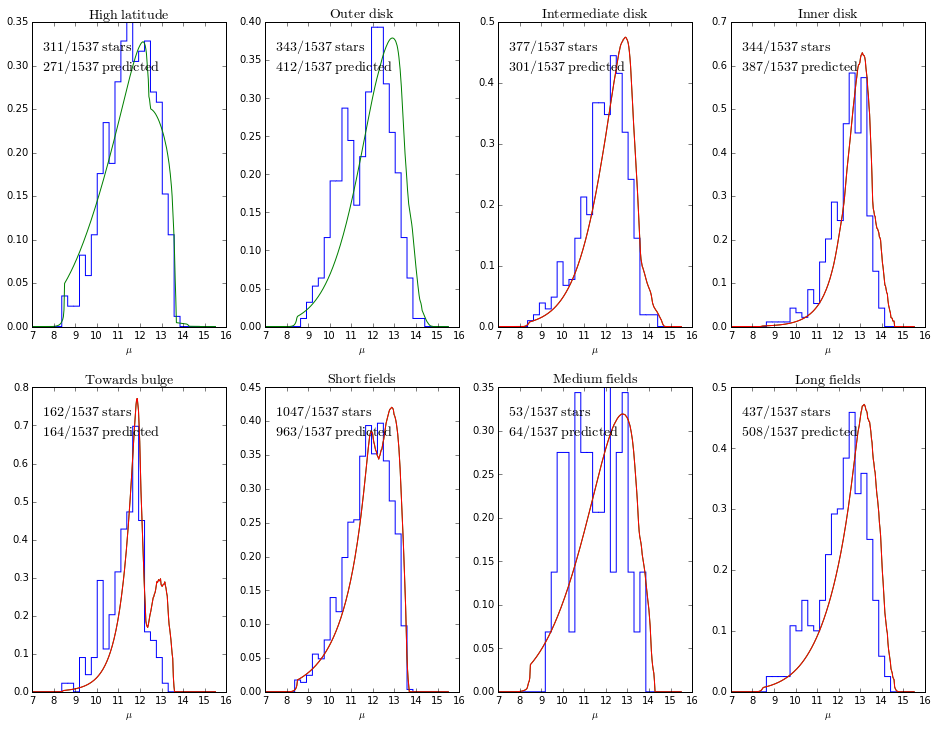

In [41]:
fit(type='brokentwoexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 12563.404758
         Iterations: 189
         Function evaluations: 314
Mean, standard devs, acor tau, acor mean, acor s ...
-0.60026015974 0.112259504394 [ 59.54472749] [-0.60026016] [ 0.00866516]
3.51781396629 0.0975665208485 [ 26.13135511] [ 3.51781397] [ 0.00498542]
0.795187568407 0.0245291873841 [ 20.4305297] [ 0.79518757] [ 0.00110879]
1.87536889422 0.0196580271115 [ 35.64506038] [ 1.87536889] [ 0.00117414]
Quantiles:
[(0.16, -0.70483174539827564), (0.5, -0.592345776722629), (0.84, -0.49437446870931556)]
Quantiles:
[(0.16, 3.4255836440605814), (0.5, 3.517837089891986), (0.84, 3.6114097988021943)]
Quantiles:
[(0.16, 0.7780170066904053), (0.5, 0.79669099152246858), (0.84, 0.81413811756733911)]
Quantiles:
[(0.16, 1.8614186435279392), (0.5, 1.8766501790180594), (0.84, 1.890020974382379)]


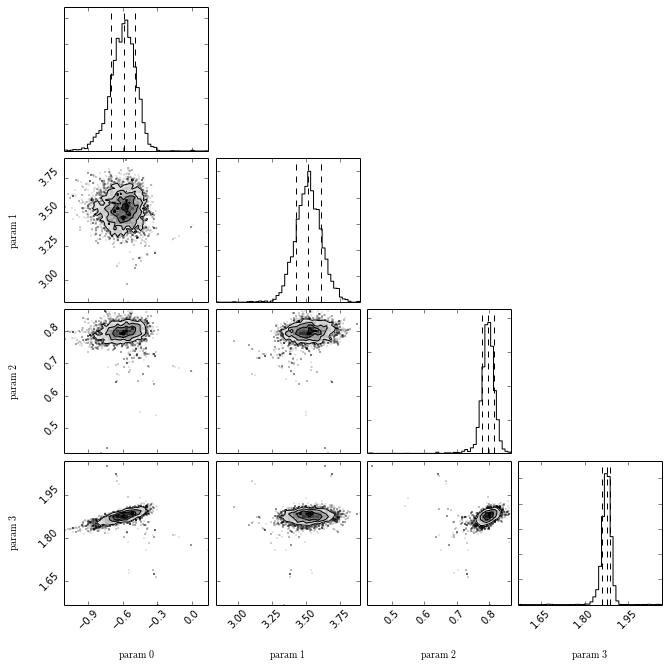

In [23]:
sample(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000)

Optimization terminated successfully.
         Current function value: 12479.035096
         Iterations: 510
         Function evaluations: 805
Mean, standard devs, acor tau, acor mean, acor s ...
-0.271894295983 0.13906847932 59.2319504027 -0.271894295983 0.0107071701184
3.74574272963 0.095892672032 7.29121766182 3.74574272963 0.00258965687688
0.809478158905 0.0332679729152 40.002583641 0.809478158905 0.00210445046683
1.91450576598 0.04286075184 76.1484193543 1.91450576598 0.0037411548862
-0.135173851672 0.0244828222804 12.7059978058 -0.135173851672 0.000872938106455
Quantiles:
[(0.16, -0.4044790143264827), (0.5, -0.29077459807900075), (0.84, -0.10173176286148473)]
Quantiles:
[(0.16, 3.6554221757831624), (0.5, 3.7404611163996302), (0.84, 3.8393668471539399)]
Quantiles:
[(0.16, 0.78202093551717566), (0.5, 0.80455682988301258), (0.84, 0.8374083336509518)]
Quantiles:
[(0.16, 1.8842829925765716), (0.5, 1.9060707862291502), (0.84, 1.9632385184355052)]
Quantiles:
[(0.16, -0.1513571279307890

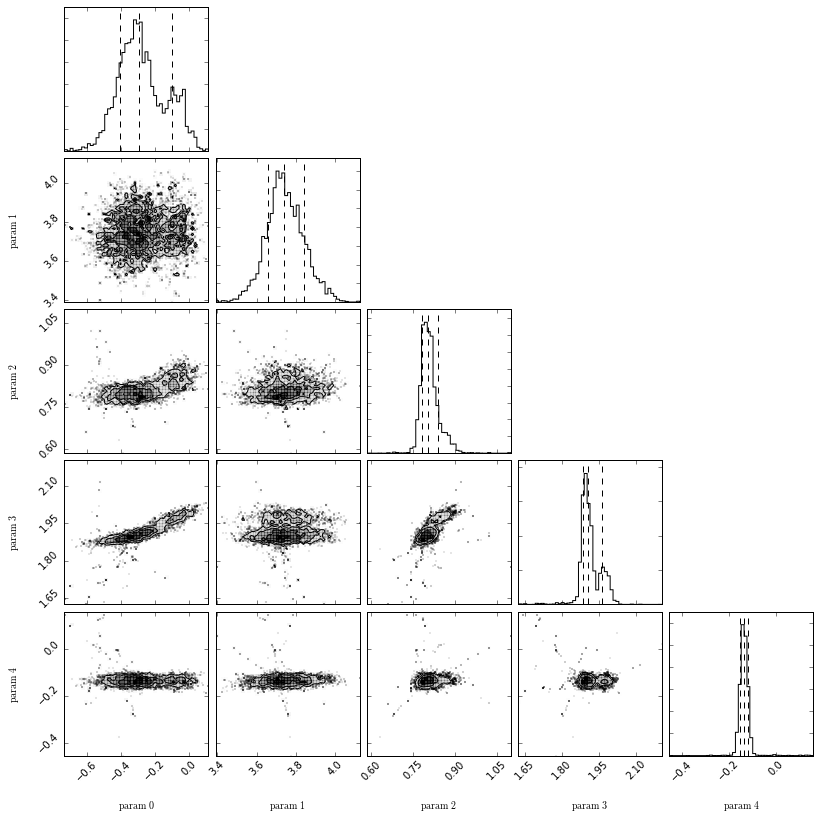

In [22]:
sample(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 12470.896288
         Iterations: 263
         Function evaluations: 431
Mean, standard devs, acor tau, acor mean, acor s ...
0.285118806102 0.144304894882 18.1763925066 0.285118806102 0.00615393290518
3.86225712415 0.0964609292019 4.52984257699 3.86225712415 0.00205212520105
0.802129938954 0.0339980603309 16.6137106407 0.802129938954 0.00138595717005
1.9158850603 0.0449026775059 13.8375814661 1.9158850603 0.00167083585747
-0.0813201093093 0.0167806944594 1.97165493161 -0.0813201093093 0.000235725925957
Quantiles:
[(0.16, 0.11115673322542191), (0.5, 0.29932020360242101), (0.84, 0.43327482339534534)]
Quantiles:
[(0.16, 3.7694828353029792), (0.5, 3.8564908243350424), (0.84, 3.9591175169323396)]
Quantiles:
[(0.16, 0.77193555608380882), (0.5, 0.7957311844845677), (0.84, 0.83266789348791548)]
Quantiles:
[(0.16, 1.8826513112055074), (0.5, 1.9028723423751299), (0.84, 1.9622872312928741)]
Quantiles:
[(0.16, -0.0888932340361

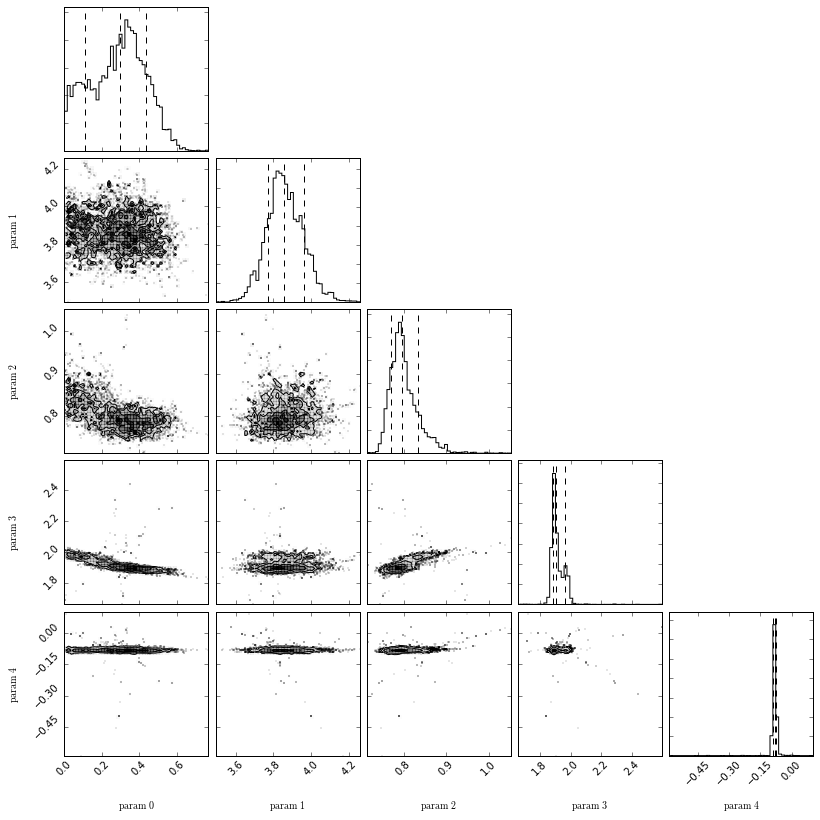

In [23]:
sample(type='tribrokenexplinflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000,dmap='marshall06')

# The high alpha subsample

In [42]:
load_data(subsample='highalpha')
fitIndx= None #True-highbIndx
data_fitIndx= None #True-data_highbIndx

Optimization terminated successfully.
         Current function value: 3851.365481
         Iterations: 199
         Function evaluations: 377


array([  0.42114841,   1.03616662, -30.15229954])

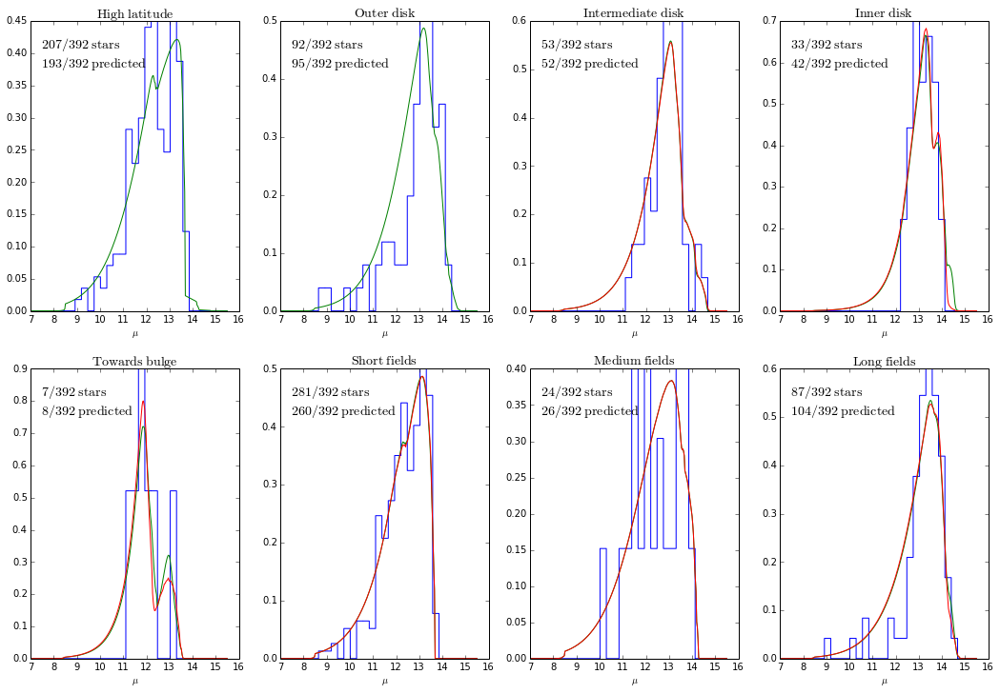

In [25]:
fit(type='expplusconst',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 3850.486171
         Iterations: 322
         Function evaluations: 524


array([-0.08065208,  1.04869161,  0.4349425 ,  1.64111792])

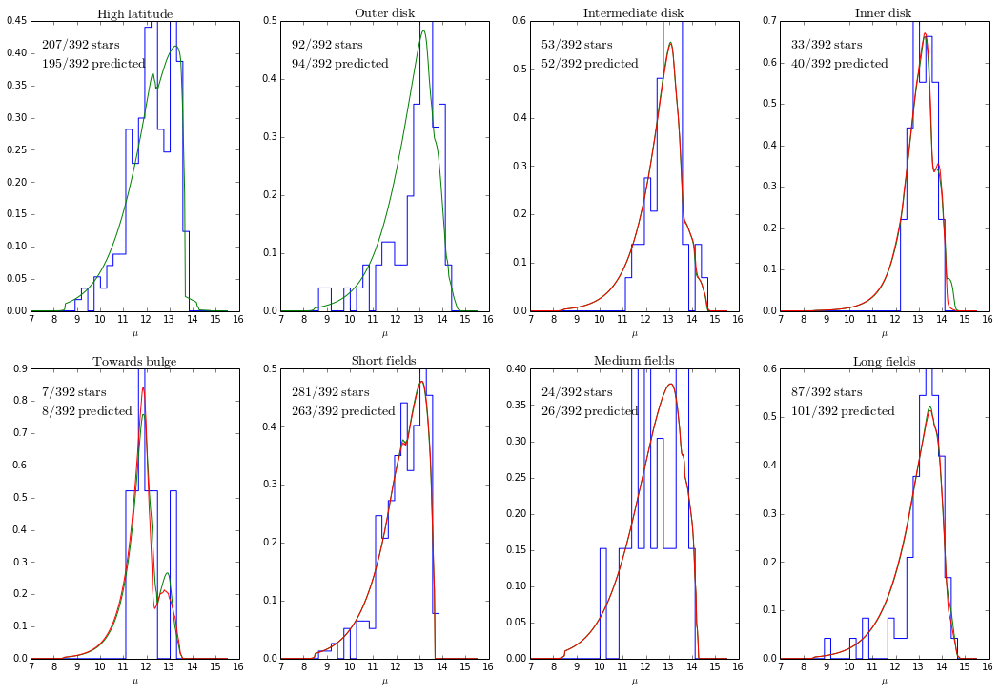

In [26]:
fit(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 3848.089178
         Iterations: 121
         Function evaluations: 212


array([ 0.17520537,  1.05406632,  0.43537135,  1.64111395])

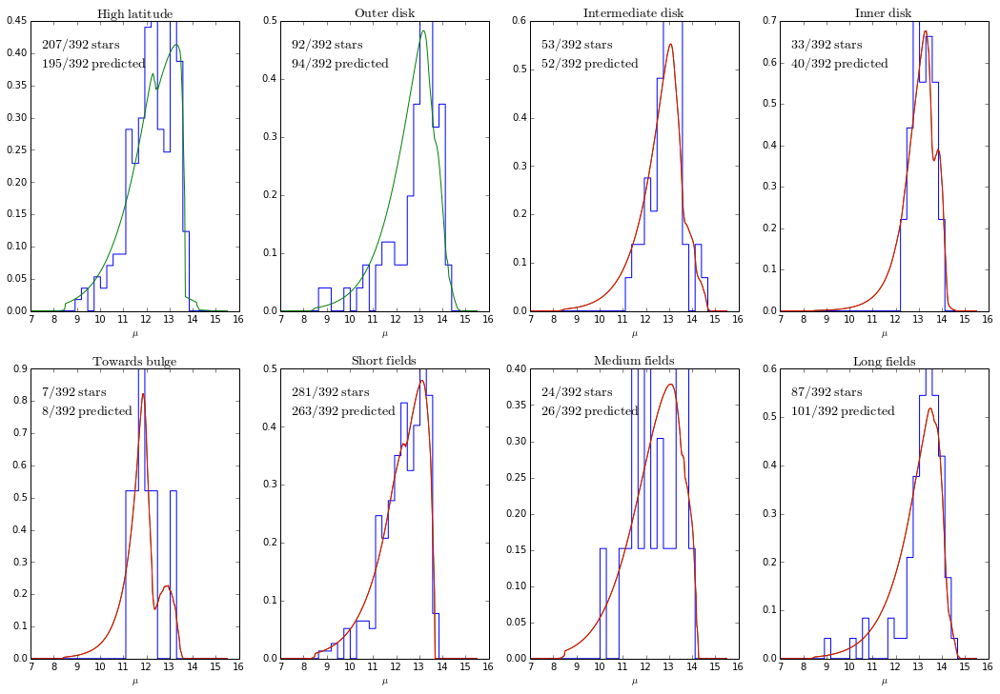

In [95]:
fit(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 3921.277464
         Iterations: 235
         Function evaluations: 390


array([-1.04498705,  0.98158113,  0.4473401 ,  1.66233519])

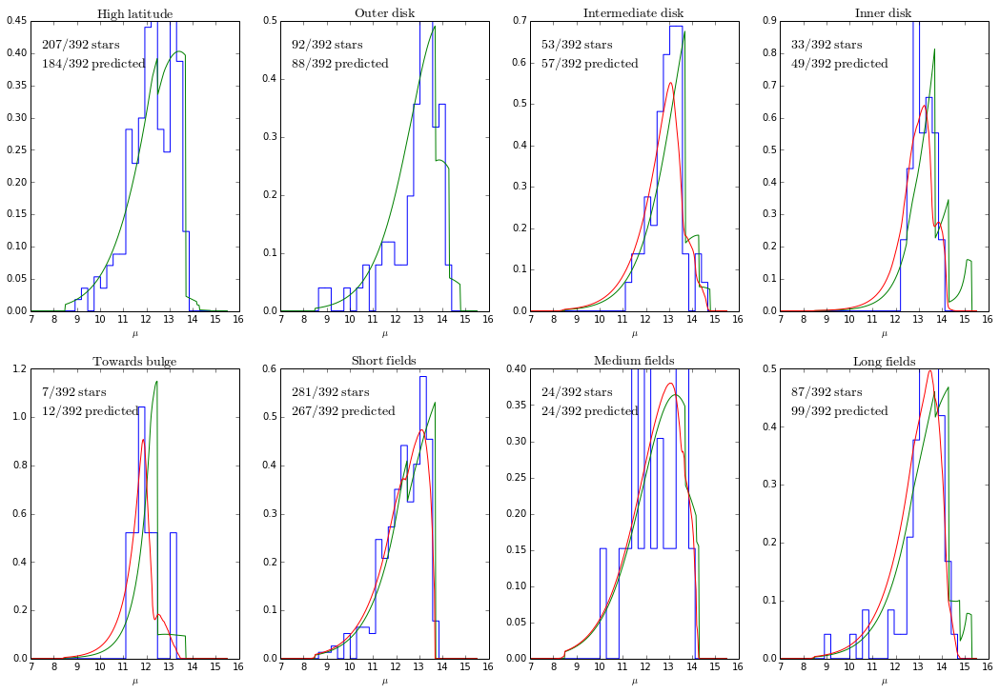

In [96]:
fit(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='zero')

Optimization terminated successfully.
         Current function value: 3848.264339
         Iterations: 208
         Function evaluations: 356


array([ 0.7092778 ,  1.04604503,  0.43172675,  0.1534134 ,  0.01310103])

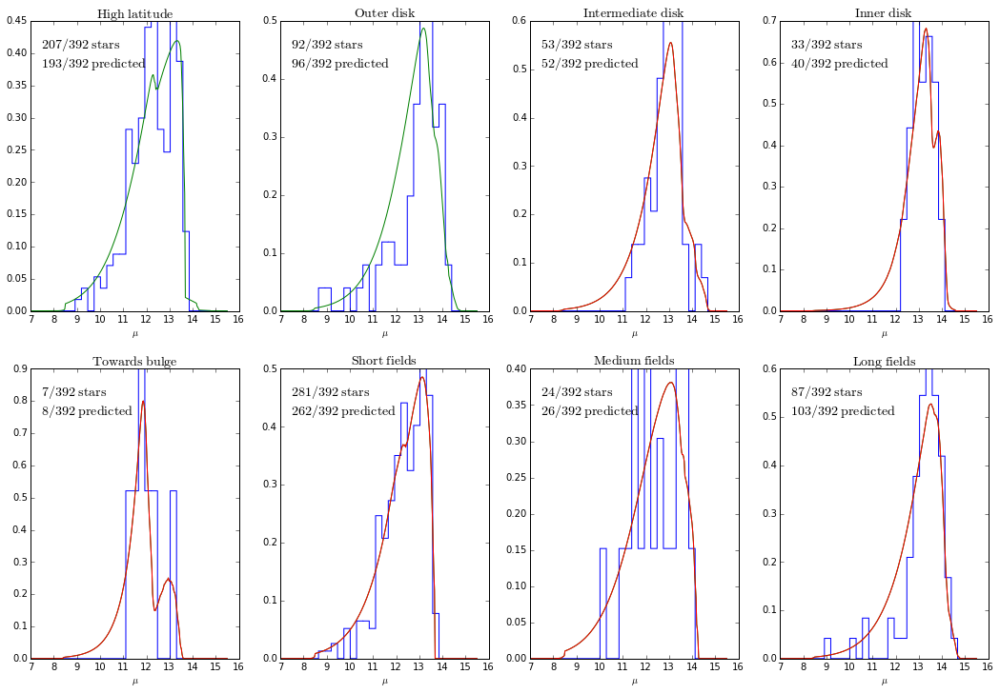

In [27]:
fit(type='tribrokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 3848.285847
         Iterations: 139
         Function evaluations: 239


array([ 0.12228233,  1.0467311 ,  0.43122822,  0.43430092,  0.00644825])

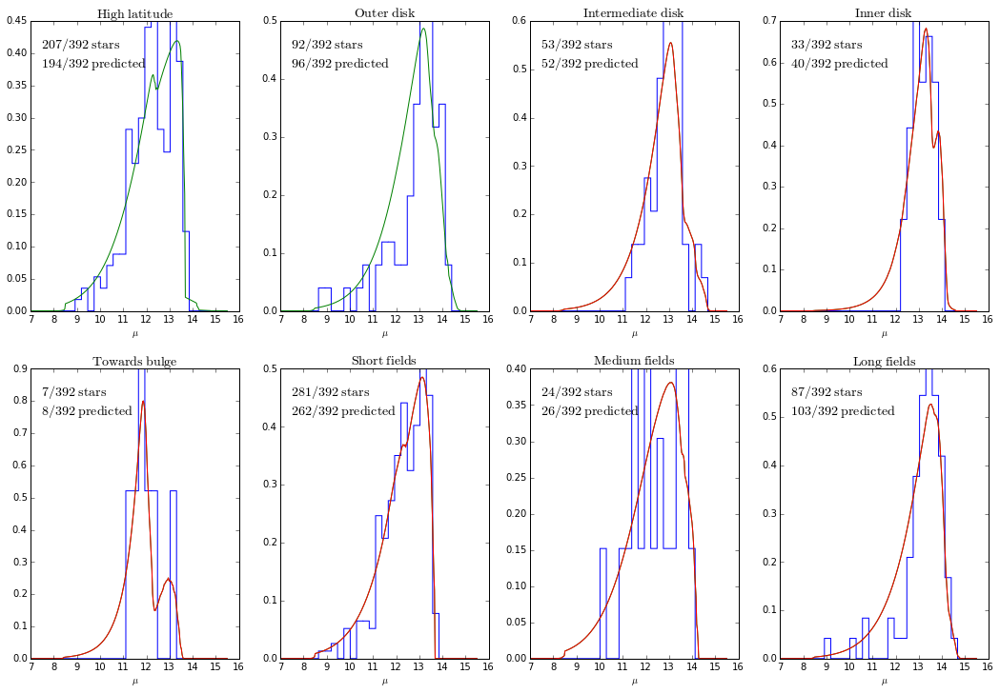

In [26]:
fit(type='tribrokenexplinflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 3864.347483
         Iterations: 141
         Function evaluations: 254


array([  2.23033449e-01,   1.04605356e+00,   2.69680361e-07])

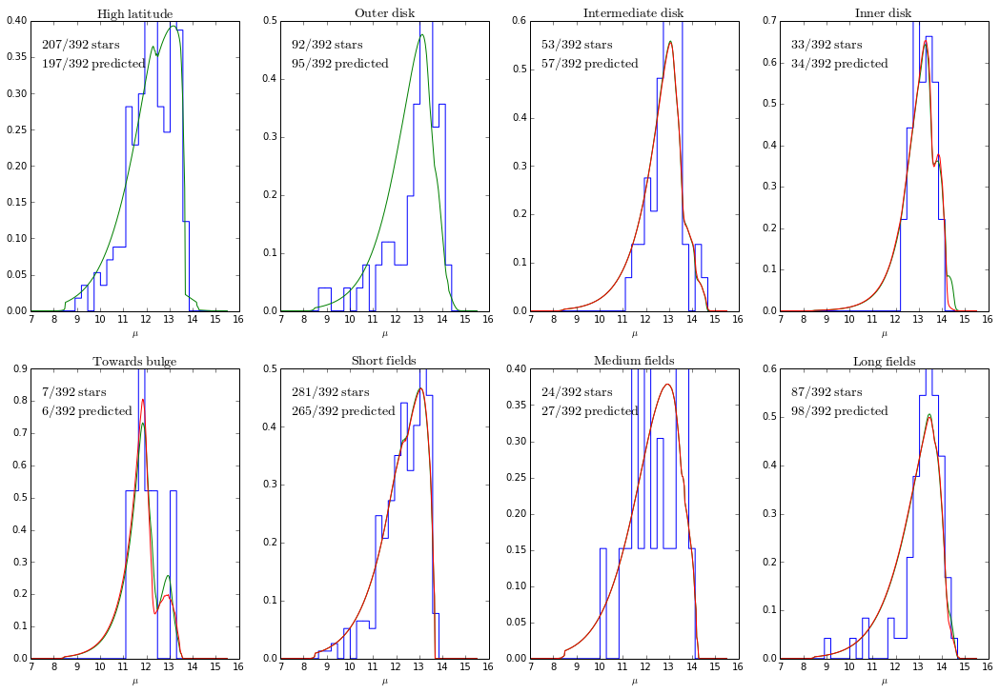

In [28]:
fit(type='gaussexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 3848.216913
         Iterations: 503
         Function evaluations: 795


array([ -3.54954239e-01,   1.04924041e+00,   4.29762187e-01,
         1.44422700e+00,  -4.09190724e-08,   1.05047177e+00])

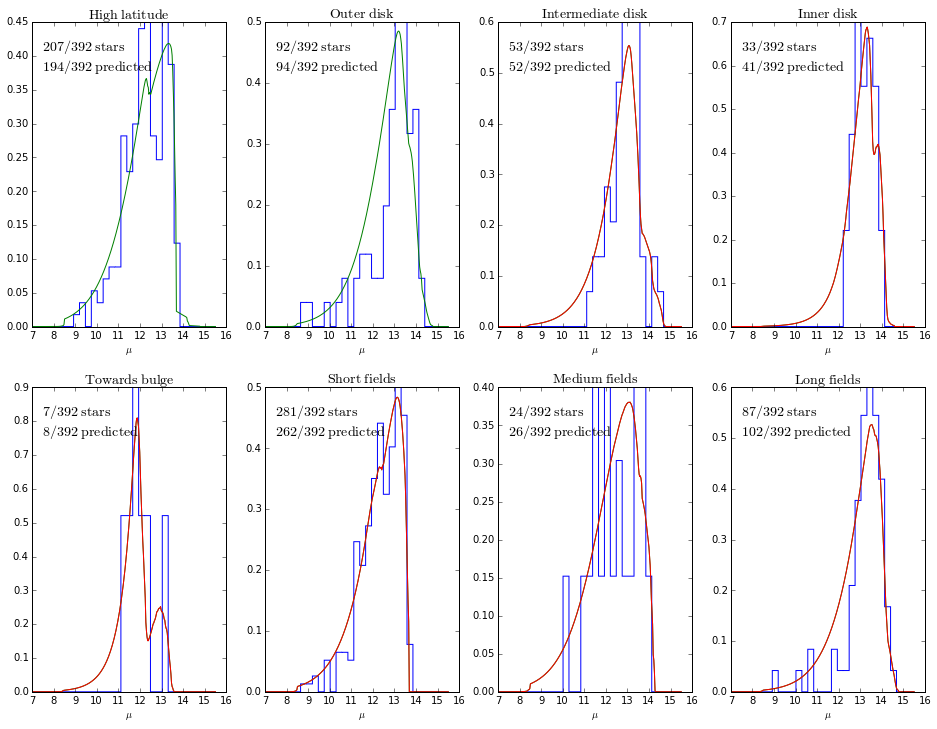

In [43]:
fit(type='brokentwoexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 3848.453726
         Iterations: 498
         Function evaluations: 792


array([ -2.97105973e-01,   1.01728504e+00,   4.46301663e-01,
         1.60673716e+00,  -2.77369144e-04,   1.11892964e+00,
         9.69345077e-03])

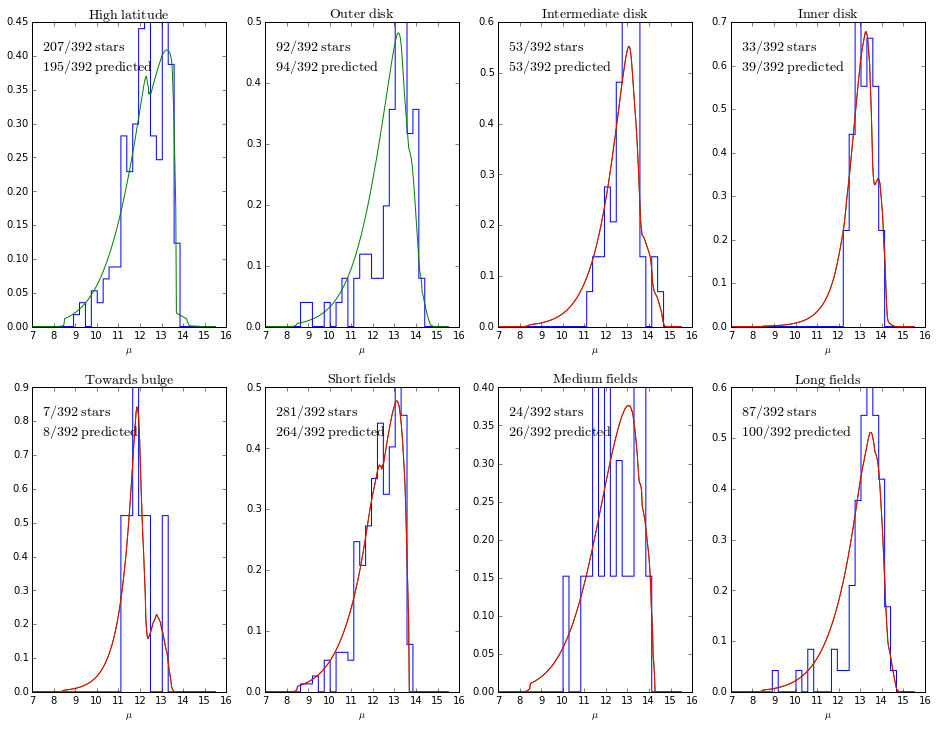

In [44]:
fit(type='brokentwoexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 3850.486171
         Iterations: 322
         Function evaluations: 524
Mean, standard devs, acor tau, acor mean, acor s ...
0.00485747791167 0.946411427733 [ 62.24179669] [ 0.00485748] [ 0.0746776]
1.0448935703 0.06067180557 [ 58.35171727] [ 1.04489357] [ 0.00463568]
0.41996819946 0.0285732505093 [ 73.11518728] [ 0.4199682] [ 0.00244421]
0.992057602563 0.618202576476 [ 51.53700744] [ 0.9920576] [ 0.04439281]
Quantiles:
[(0.16, -1.1085475627488162), (0.5, 0.11718991535103779), (0.84, 0.91461964343790336)]
Quantiles:
[(0.16, 0.98867125416921831), (0.5, 1.0441042334459123), (0.84, 1.0990316377488569)]
Quantiles:
[(0.16, 0.39497221378732789), (0.5, 0.41877523760441926), (0.84, 0.44408232659510405)]
Quantiles:
[(0.16, 0.307726227717256), (0.5, 0.96458171799479997), (0.84, 1.601163560346202)]


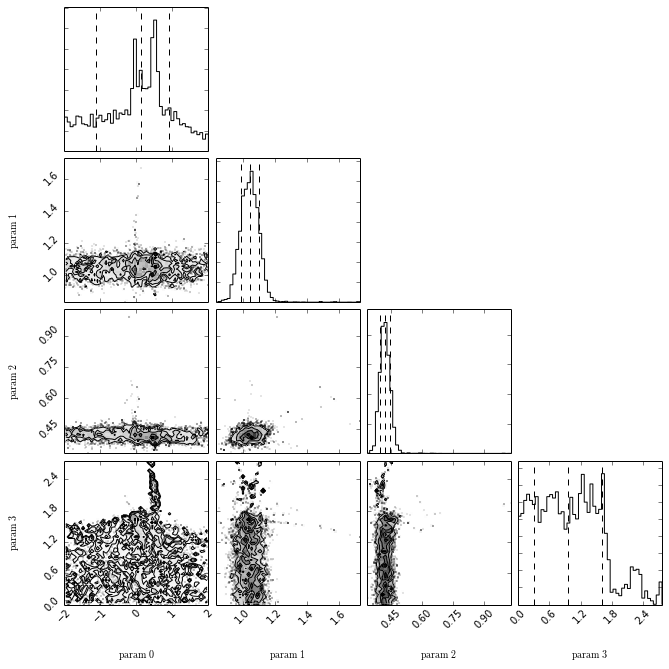

In [29]:
sample(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000)

Optimization terminated successfully.
         Current function value: 3848.264339
         Iterations: 208
         Function evaluations: 356
Mean, standard devs, acor tau, acor mean, acor s ...
0.101713412505 1.01976928112 35.6352036346 0.101713412505 0.0608754812066
1.04711502254 0.0553643652753 22.6396934168 1.04711502254 0.00263459897951
0.416182745653 0.0488292052045 48.9811777709 0.416182745653 0.00340864154097
1.13215907129 0.726302541607 49.1494610713 1.13215907129 0.0509034157072
0.0128679864251 0.0294716596059 15.1289334541 0.0128679864251 0.00114639107246
Quantiles:
[(0.16, -1.1164634896098662), (0.5, 0.44929263964082), (0.84, 1.1618393309445869)]
Quantiles:
[(0.16, 0.99006269567804306), (0.5, 1.045954550114538), (0.84, 1.1037319840106303)]
Quantiles:
[(0.16, 0.37764367340471738), (0.5, 0.4286588793256374), (0.84, 0.45337520537074594)]
Quantiles:
[(0.16, 0.31765688802493541), (0.5, 1.0533559779544497), (0.84, 2.1663684000260042)]
Quantiles:
[(0.16, -0.010339730861655527), (

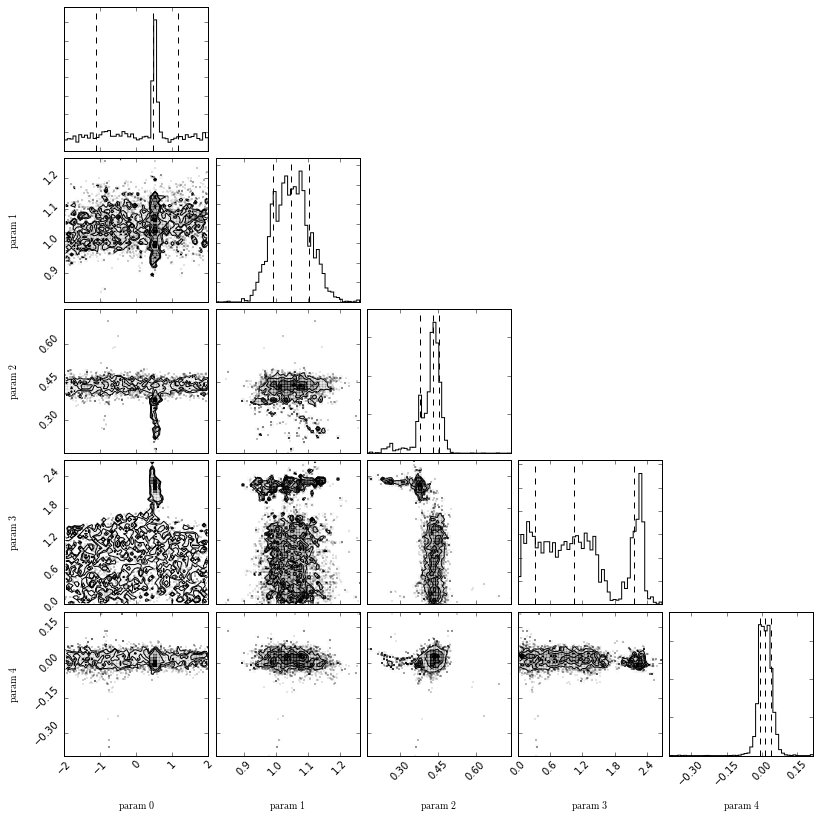

In [28]:
sample(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 3848.285847
         Iterations: 139
         Function evaluations: 239
Mean, standard devs, acor tau, acor mean, acor s ...
0.822285775694 0.550889562562 95.5344323251 0.822285775694 0.0538338694723
1.04735739586 0.0553997809822 8.12784522701 1.04735739586 0.00157978349344
0.429191767375 0.0287072156419 16.4145752484 0.429191767375 0.00116352467734
0.669896451162 0.44029129964 8.96553672024 0.669896451162 0.0131803335577
0.00660589690017 0.0186880004724 1.7500708824 0.00660589690017 0.000247312430595
Quantiles:
[(0.16, 0.23339356389782753), (0.5, 0.7603721495721969), (0.84, 1.4719405220637536)]
Quantiles:
[(0.16, 0.99155636122620294), (0.5, 1.0455456885827898), (0.84, 1.1030972418131817)]
Quantiles:
[(0.16, 0.40640268513998418), (0.5, 0.43038862253163951), (0.84, 0.45243043781517589)]
Quantiles:
[(0.16, 0.19677746120029693), (0.5, 0.59857004801968405), (0.84, 1.2010683522045189)]
Quantiles:
[(0.16, -0.0075719564218

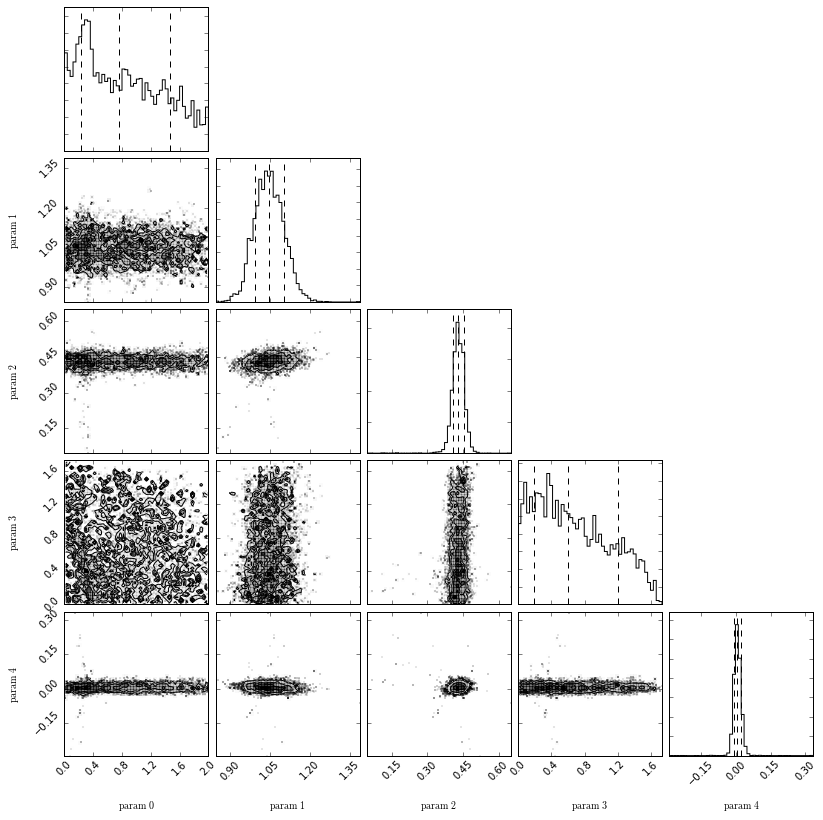

In [29]:
sample(type='tribrokenexplinflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000,dmap='marshall06')

# All low-alpha data

In [30]:
load_data(subsample='alllowalpha')
fitIndx= None #True-highbIndx
data_fitIndx= None #True-data_highbIndx

Optimization terminated successfully.
         Current function value: 126574.410642
         Iterations: 93
         Function evaluations: 168


array([ 0.25245579,  2.68459981, -6.74943932])

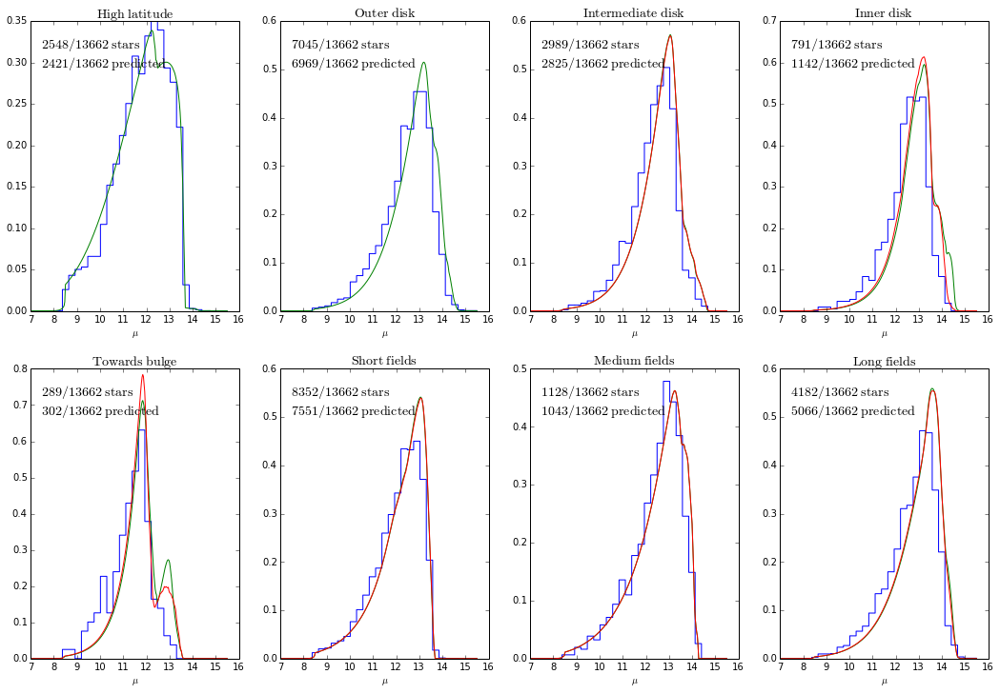

In [31]:
fit(type='expplusconst',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 126209.615835
         Iterations: 114
         Function evaluations: 198


array([ 0.02108518,  2.61731869,  0.40007545,  2.2223084 ])

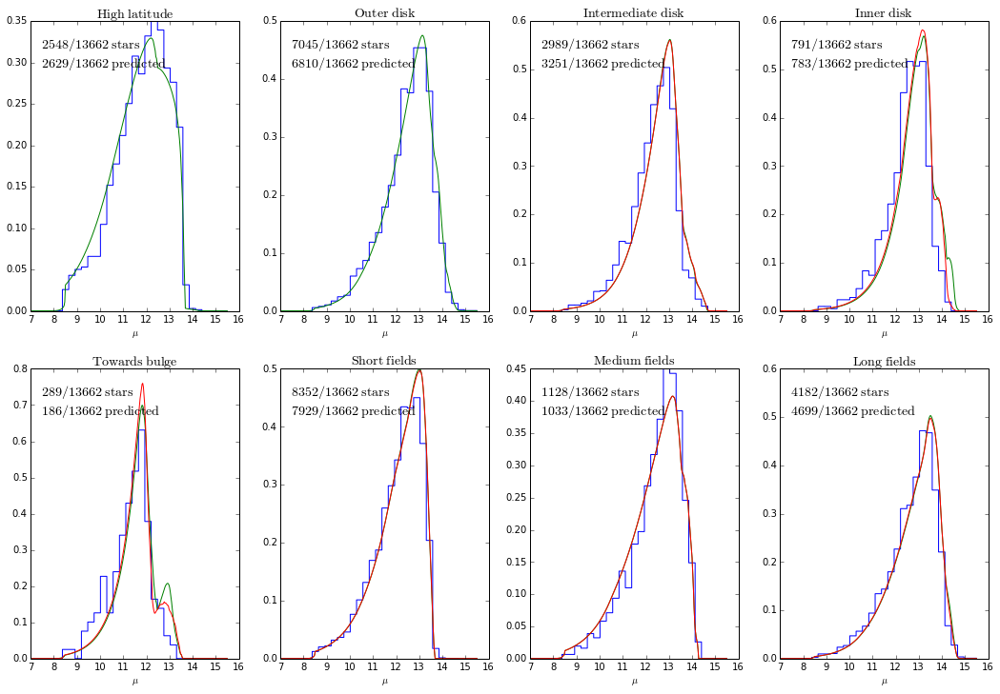

In [32]:
fit(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 126191.239703
         Iterations: 62
         Function evaluations: 112


array([ 0.28779271,  2.62612857,  1.8952917 ])

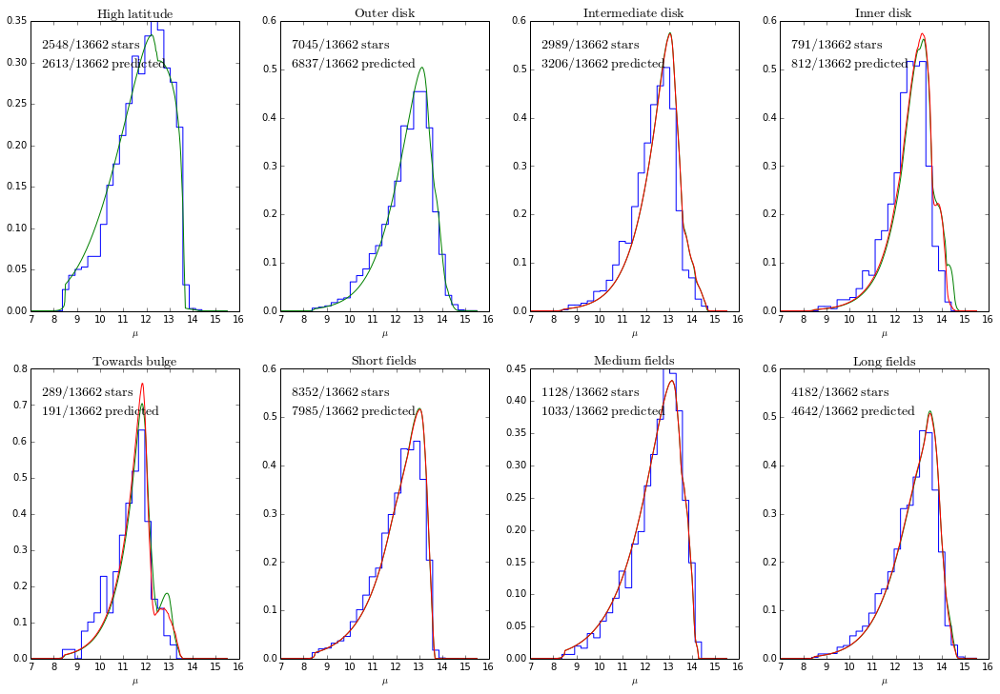

In [33]:
fit(type='gaussexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 126209.615835
         Iterations: 114
         Function evaluations: 198
Mean, standard devs, acor tau, acor mean, acor s ...
0.0178595569202 0.0244403455594 [ 26.77229215] [ 0.01785956] [ 0.00126491]
2.63249291841 0.0460335255068 [ 8.52698683] [ 2.63249292] [ 0.00134463]
0.396919368788 0.0192978394735 [ 22.65080286] [ 0.39691937] [ 0.00091859]
2.21806786148 0.0312585911188 [ 36.23439968] [ 2.21806786] [ 0.00188217]
Quantiles:
[(0.16, 0.0064525003290016522), (0.5, 0.021028858860394038), (0.84, 0.0355299854337459)]
Quantiles:
[(0.16, 2.5957093551132826), (0.5, 2.625740591066521), (0.84, 2.6601405033222347)]
Quantiles:
[(0.16, 0.38908874479449596), (0.5, 0.39987770966060932), (0.84, 0.40847956089912374)]
Quantiles:
[(0.16, 2.2129518977946407), (0.5, 2.2231688206991578), (0.84, 2.2340010530078009)]


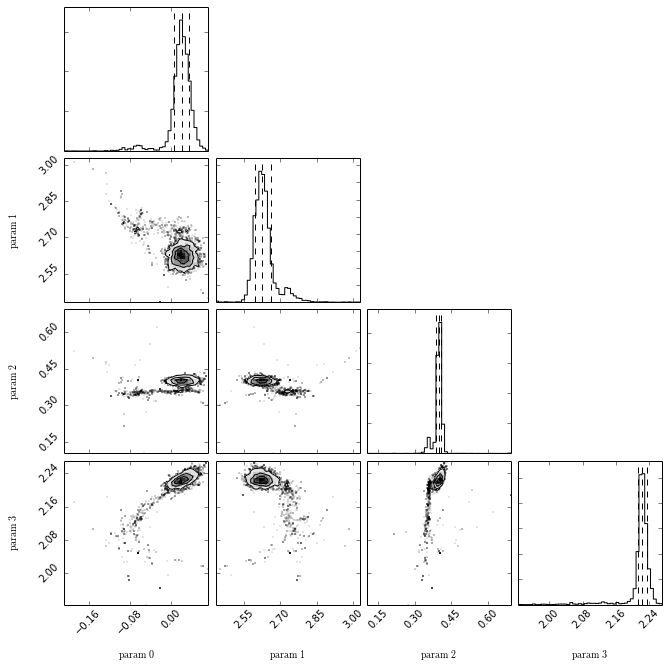

In [34]:
sample(type='brokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000)

# Data closer to the center of the plate

In [8]:
load_data(subsample='lowlow')
fitIndx= None #True-highbIndx
data_fitIndx= None #True-data_highbIndx
ldiff= numpy.empty(len(ldata))
bdiff= numpy.empty(len(ldata))
rad= numpy.empty(len(ldata))
for ii in range(len(ldata)):
    tlcen, tbcen= apo.glonGlat(ldata[ii]['LOCATION_ID'])
    rad[ii]= apo.radius(ldata[ii]['LOCATION_ID'])
    ldiff[ii]= ldata['GLON'][ii]-tlcen
    bdiff[ii]= ldata['GLAT'][ii]-tbcen
ldiff[ldiff > 180.]-= 360.
ldiff[ldiff < -180.]+= 360.
bdiff[bdiff > 180.]-= 360.
bdiff[bdiff < -180.]+= 360.
ldata= ldata[ldiff**2.+bdiff**2. < rad**2./9.]
# Get the indices of the various subsamples defined above
data_highbIndx= numpy.zeros(len(ldata),dtype='bool')
for ii in range(len(ldata)):
    if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[highbIndx]: data_highbIndx[ii]= True
data_outDiskIndx= numpy.zeros(len(ldata),dtype='bool')
for ii in range(len(ldata)):
    if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[outDiskIndx]: data_outDiskIndx[ii]= True
data_betwDiskIndx= numpy.zeros(len(ldata),dtype='bool')
for ii in range(len(ldata)):
    if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[betwDiskIndx]: data_betwDiskIndx[ii]= True
data_inDiskIndx= numpy.zeros(len(ldata),dtype='bool')
for ii in range(len(ldata)):
    if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[inDiskIndx]: data_inDiskIndx[ii]= True
data_bulgeIndx= numpy.zeros(len(ldata),dtype='bool')
for ii in range(len(ldata)):
    if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[bulgeIndx]: data_bulgeIndx[ii]= True
data_brightIndx= numpy.zeros(len(ldata),dtype='bool')
for ii in range(len(ldata)):
    if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[brightIndx]: data_brightIndx[ii]= True
data_mediumIndx= numpy.zeros(len(ldata),dtype='bool')
for ii in range(len(ldata)):
    if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[mediumIndx]: data_mediumIndx[ii]= True
data_faintIndx= numpy.zeros(len(ldata),dtype='bool')
for ii in range(len(ldata)):
    if ldata[ii]['LOCATION_ID'] in numpy.array(locations)[faintIndx]: data_faintIndx[ii]= True

Optimization terminated successfully.
         Current function value: 5481.030660
         Iterations: 196
         Function evaluations: 327


array([-0.28288218,  3.39248725,  0.38214087,  2.38909934, -0.14640433])

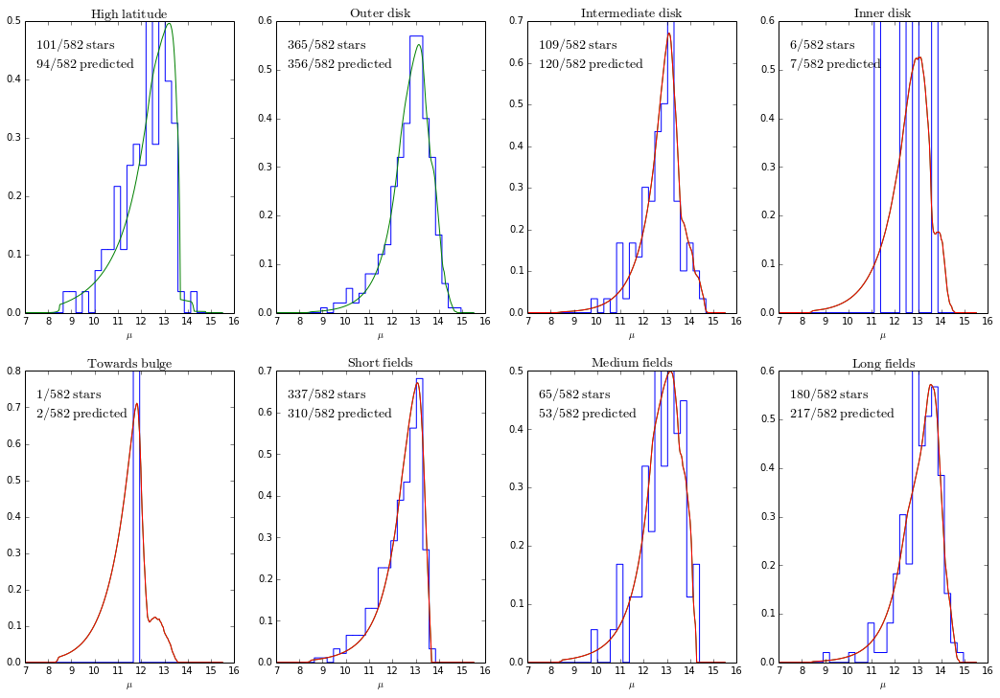

In [9]:
fit(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

# Mock data

## Low-low-like sample

In [7]:
load_mock_data(subsample='lowlow',type='exp',nls=None)
fitIndx= None #True-highbIndx
data_fitIndx= None #True-data_highbIndx

Optimization terminated successfully.
         Current function value: 185079.789735
         Iterations: 116
         Function evaluations: 204


array([ 0.02943341,  3.32110685, -8.45113727])

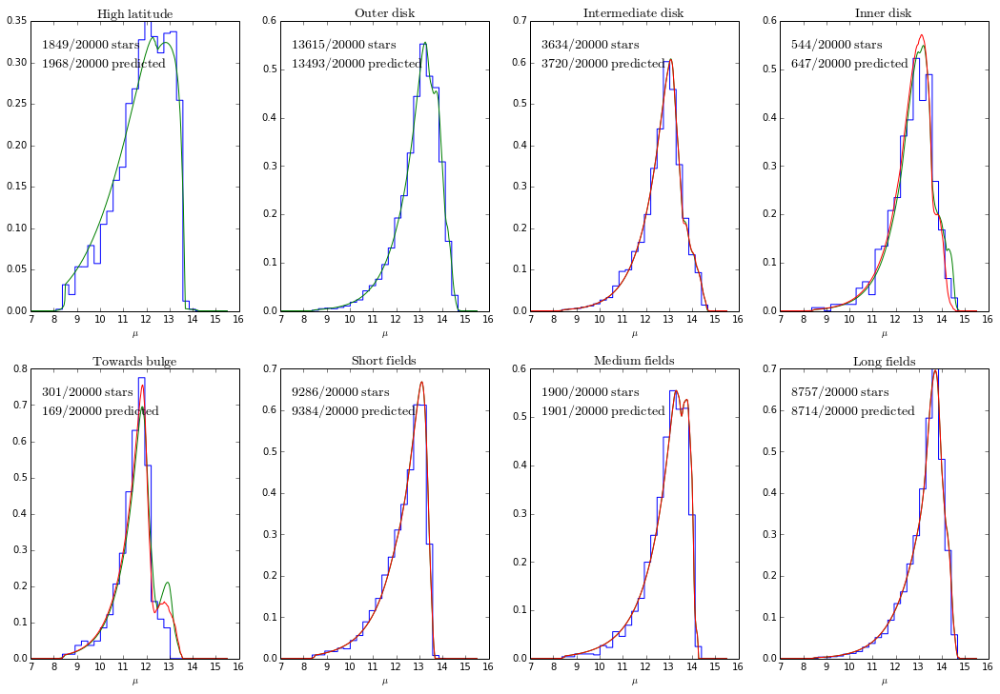

In [8]:
fit(type='expplusconst',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 184991.044292
         Iterations: 114
         Function evaluations: 203


array([ 0.03542716,  3.34267477, -8.4524549 ])

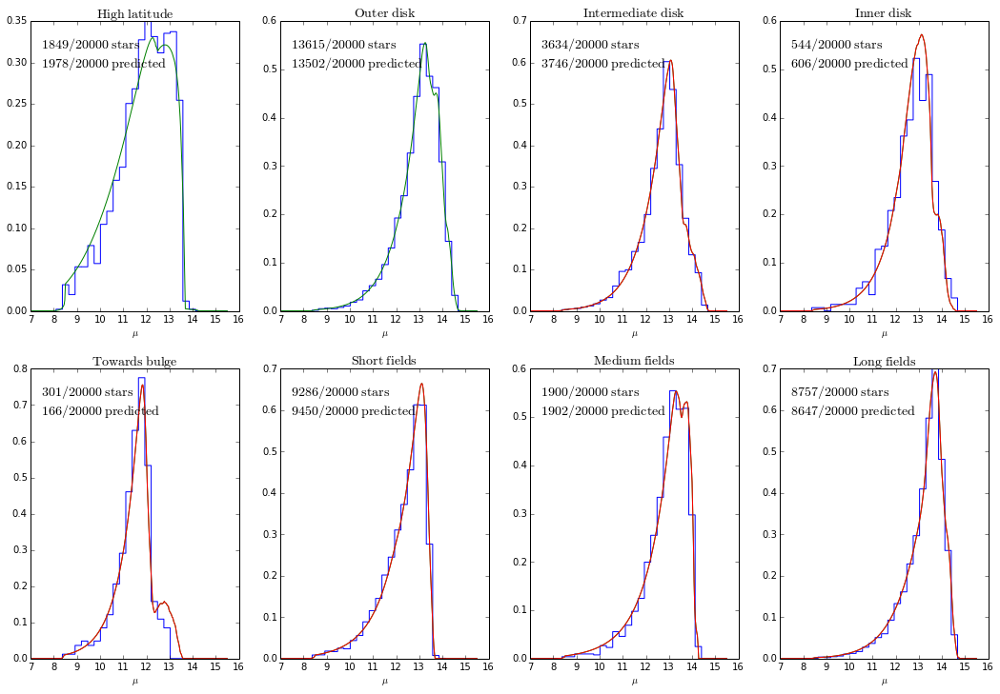

In [9]:
fit(type='expplusconst',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 187087.967151
         Iterations: 97
         Function evaluations: 182


array([ 0.0914534 ,  3.19360957, -8.73397659])

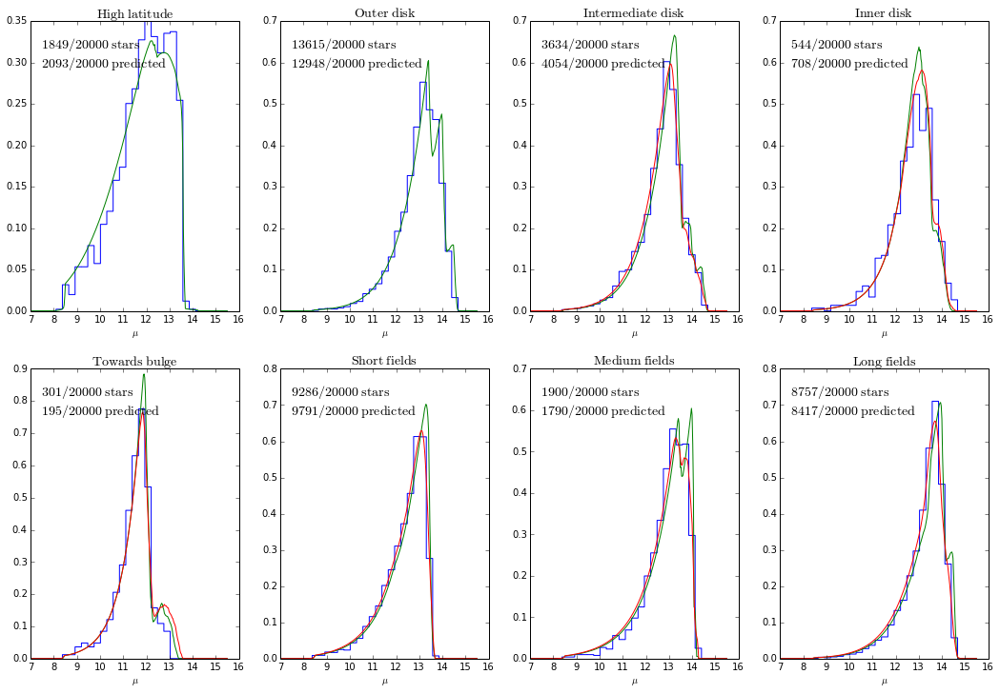

In [10]:
fit(type='expplusconst',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='drimmel03')

Optimization terminated successfully.
         Current function value: 184171.506987
         Iterations: 247
         Function evaluations: 407


array([ 0.1508909 ,  3.78737458,  0.21961129,  2.40328784, -0.03754447])

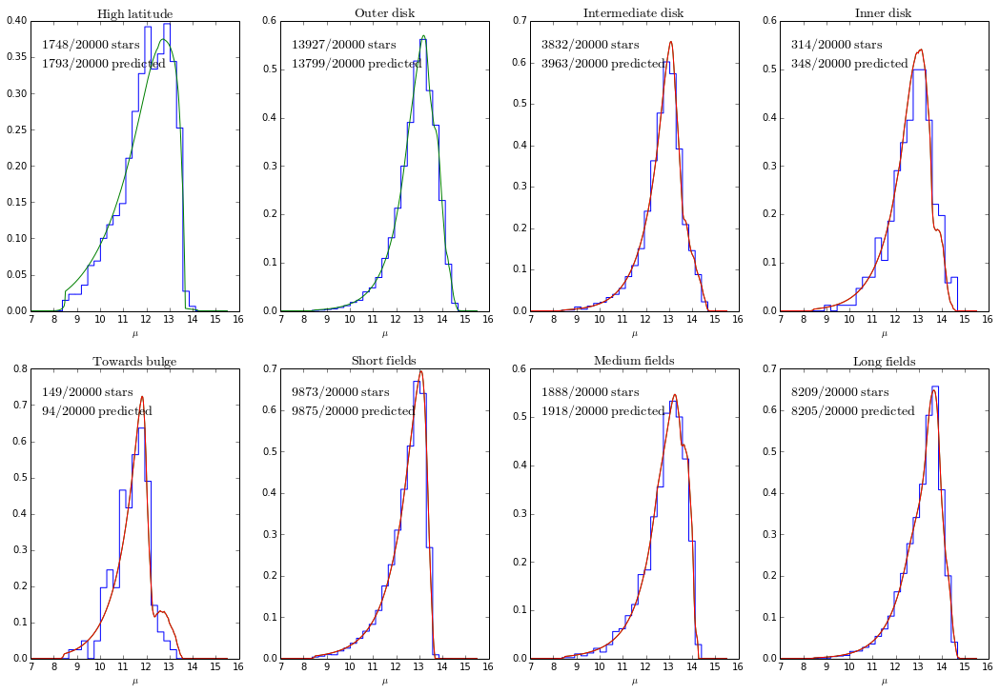

In [16]:
fit(type='tribrokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 185067.476357
         Iterations: 391
         Function evaluations: 644


array([ 0.43552725,  3.47385497,  0.03305215,  1.64467369, -0.01443843])

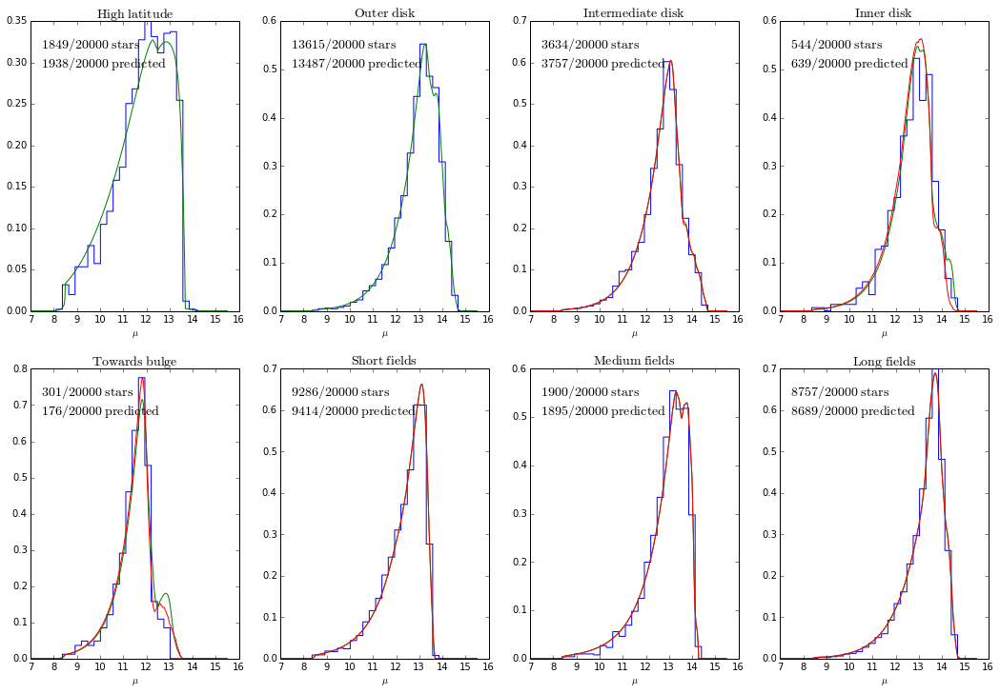

In [11]:
fit(type='tribrokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 185067.475907
         Iterations: 381
         Function evaluations: 607
/Library/Python/2.7/site-packages/MarkovPy-0.1-py2.7.egg/markovpy/ensemble.py:234: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if lnprob == None:

Mean, standard devs, acor tau, acor mean, acor s ...
-0.545731640637 0.362895312605 [ 75.53428242] [-0.54573164] [ 0.03155097]
3.47407062724 0.05572849776 [ 45.53521729] [ 3.47407063] [ 0.00376215]
0.0294291596671 0.0166474642276 [ 23.38810422] [ 0.02942916] [ 0.00080547]
1.60704756096 0.0868123068203 [ 29.16330995] [ 1.60704756] [ 0.00468397]
-0.0134458501951 0.0125203001362 [ 20.84610909] [-0.01344585] [ 0.00057193]
Quantiles:
[(0.16, -0.8236534535138258), (0.5, -0.51259442997185656), (0.84, -0.30346131703269663)]
Quantiles:
[(0.16, 3.4201435449597279), (0.5, 3.4736908057895413), (0.84, 3.5271403270316042)]
Quantiles:
[(0.16, 0.0274158845881

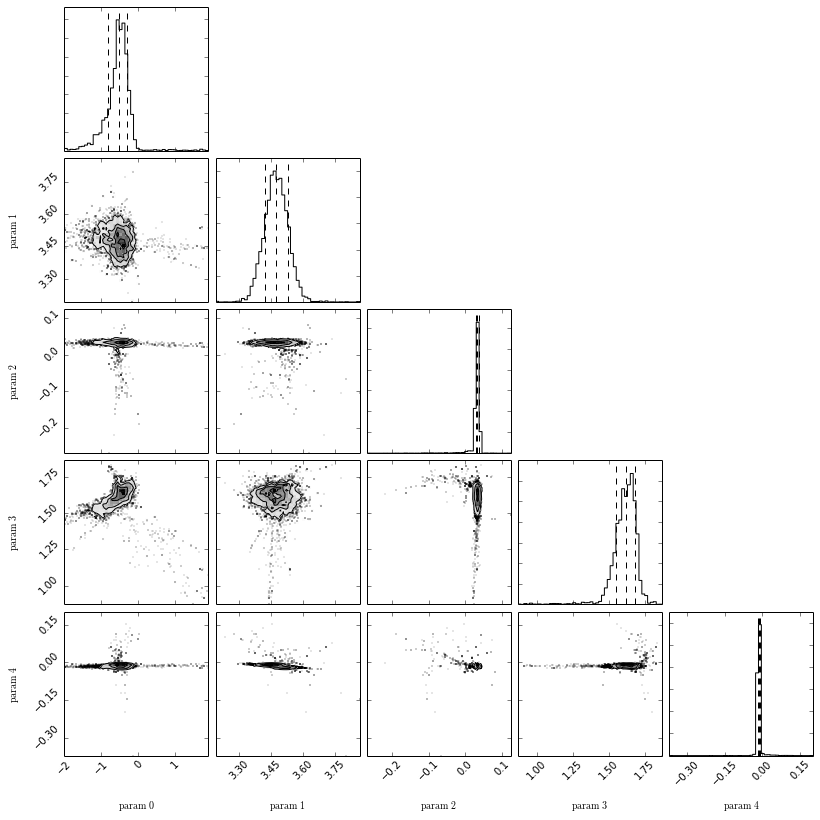

In [12]:
sample(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000)

Optimization terminated successfully.
         Current function value: 184975.329658
         Iterations: 195
         Function evaluations: 326
Mean, standard devs, acor tau, acor mean, acor s ...
0.324144859531 0.578241321553 [ 62.49387972] [ 0.32414486] [ 0.04572721]
3.58070201067 0.0510896556438 [ 37.95084066] [ 3.58070201] [ 0.00314857]
0.0295477608409 0.0151442320148 [ 83.08431483] [ 0.02954776] [ 0.00138101]
1.274758624 0.763363596621 [ 117.79148648] [ 1.27475862] [ 0.08282763]
-0.0228618247849 0.0144079586087 [ 29.34269054] [-0.02286182] [ 0.00078085]
Quantiles:
[(0.16, 0.13193456888648331), (0.5, 0.20083495736561627), (0.84, 0.74123787478041381)]
Quantiles:
[(0.16, 3.5276937913794293), (0.5, 3.5819812431373053), (0.84, 3.6319176270582112)]
Quantiles:
[(0.16, 0.017804413851285297), (0.5, 0.031688014268761201), (0.84, 0.038915852710648575)]
Quantiles:
[(0.16, 0.32173825533635542), (0.5, 1.3052144618392525), (0.84, 2.0658295302642276)]
Quantiles:
[(0.16, -0.025383787507966195), (

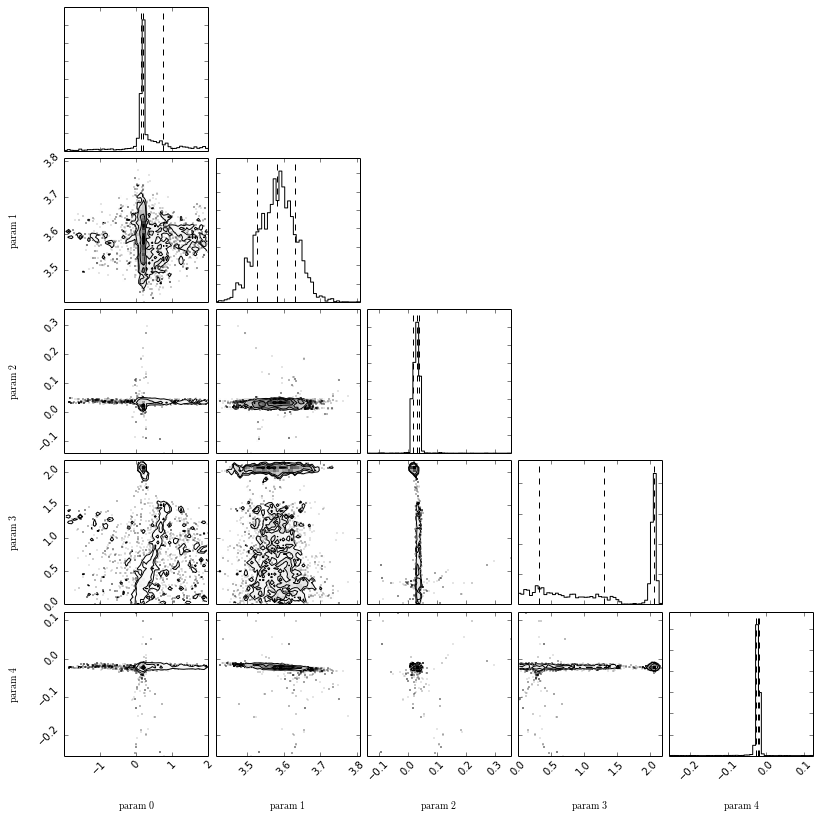

In [14]:
sample(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 187029.007735
         Iterations: 134
         Function evaluations: 236
Mean, standard devs, acor tau, acor mean, acor s ...
0.809282446822 0.985584227016 [ 101.01099296] [ 0.80928245] [ 0.09906992]
3.6199252462 0.0608881326964 [ 85.93031645] [ 3.61992525] [ 0.00564672]
0.0909879479123 0.0117212904452 [ 14.96589585] [ 0.09098795] [ 0.00045359]
1.44020645176 0.515660794752 [ 101.17851] [ 1.44020645] [ 0.05189483]
-0.0401002457098 0.0155397974992 [ 30.18408773] [-0.04010025] [ 0.00085417]
Quantiles:
[(0.16, -0.3103527172494101), (0.5, 1.0487846085983625), (0.84, 1.8455920125645331)]
Quantiles:
[(0.16, 3.5637188267608395), (0.5, 3.6132438307017858), (0.84, 3.6767750334051392)]
Quantiles:
[(0.16, 0.086131452711034812), (0.5, 0.09080519393027911), (0.84, 0.094824977362953672)]
Quantiles:
[(0.16, 0.98462270566155619), (0.5, 1.4979653915817035), (0.84, 1.8742133907448688)]
Quantiles:
[(0.16, -0.045371382844671938), (0.5,

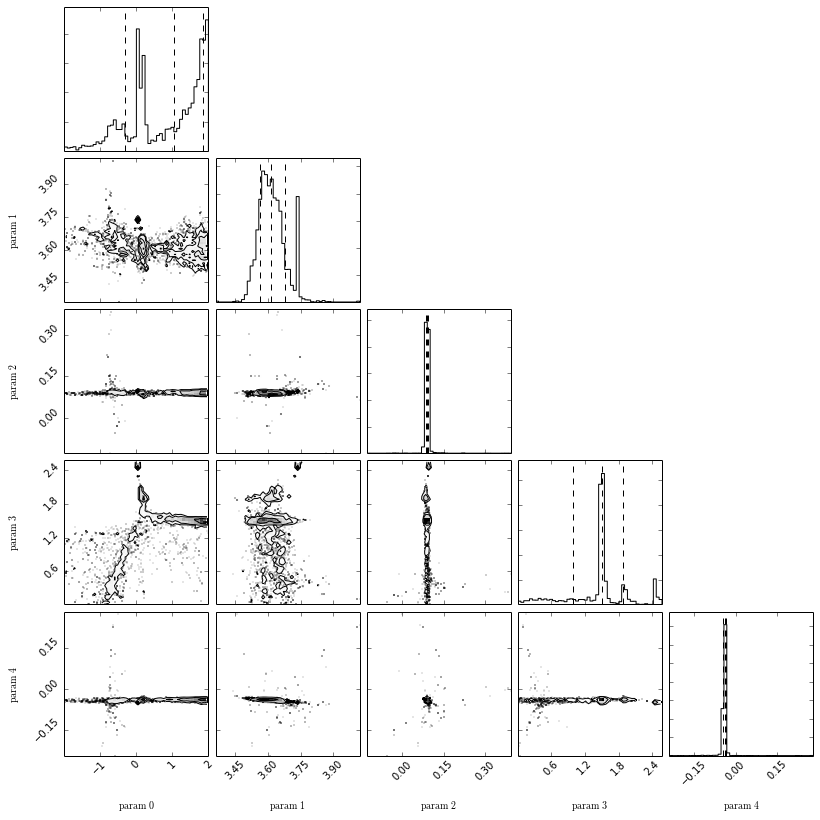

In [15]:
sample(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000,dmap='drimmel03')

In [9]:
load_mock_data(subsample='lowlow',type='brokenexp',nls=None)
fitIndx= None #True-highbIndx
data_fitIndx= None #True-data_highbIndx

Optimization terminated successfully.
         Current function value: 184227.262532
         Iterations: 306
         Function evaluations: 497


array([ 0.16508863,  3.69855862,  0.22165393,  2.40187367, -0.03175408])

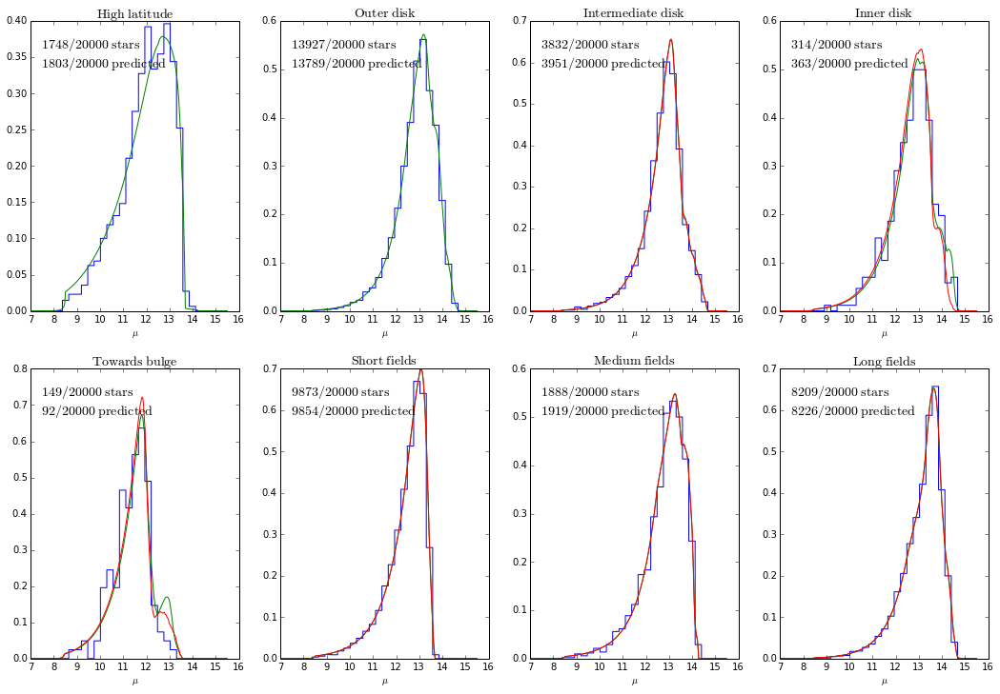

In [10]:
fit(type='tribrokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 184253.093453
         Iterations: 113
         Function evaluations: 193
Mean, standard devs, acor tau, acor mean, acor s ...
0.171131658183 0.0251019615374 [ 46.64039874] [ 0.17113166] [ 0.00171514]
3.32460269869 0.043831039205 [ 40.63117333] [ 3.3246027] [ 0.00279526]
0.208999083101 0.0181224126869 [ nan] [ 0.20899908] [ nan]
2.39616903104 0.0168256055291 [ 28.5607251] [ 2.39616903] [ 0.00089962]
Quantiles:
[(0.16, 0.15699138882077474), (0.5, 0.16649311339017769), (0.84, 0.17760894082015916)]
Quantiles:
[(0.16, 3.2920709253357181), (0.5, 3.3278915419564372), (0.84, 3.3602074615928776)]
Quantiles:
[(0.16, 0.19740654017416898), (0.5, 0.21217926038008994), (0.84, 0.22221880349104223)]
Quantiles:
[(0.16, 2.3924729038440375), (0.5, 2.3980130949089116), (0.84, 2.402826434777571)]


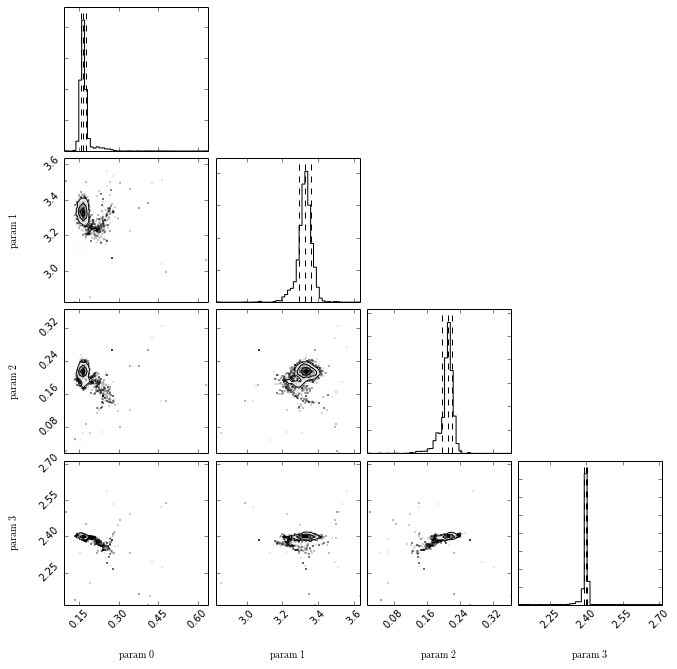

In [41]:
sample(type='tribrokenexp',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000)

## Solar-like sample

In [16]:
load_mock_data(subsample='solar',type='exp')
fitIndx= None #True-highbIndx
data_fitIndx= None #True-data_highbIndx

Optimization terminated successfully.
         Current function value: 177760.196845
         Iterations: 95
         Function evaluations: 171


array([  0.36439783,   3.40467983, -10.01791209])

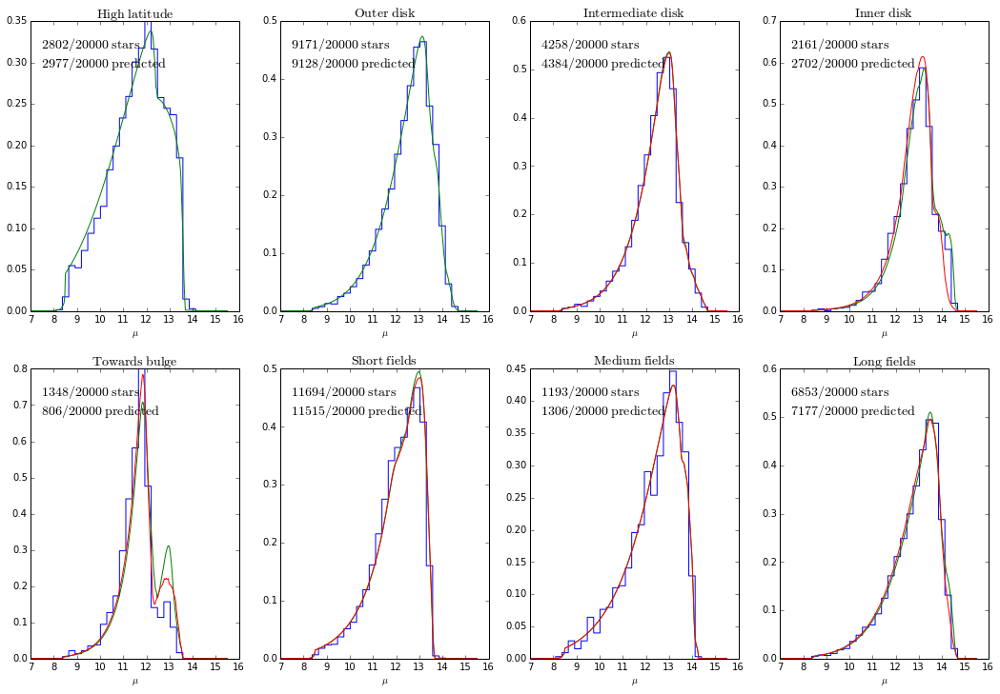

In [26]:
fit(type='expplusconst',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 177246.236668
         Iterations: 102
         Function evaluations: 181


array([ 0.38597792,  3.52225819, -9.45552482])

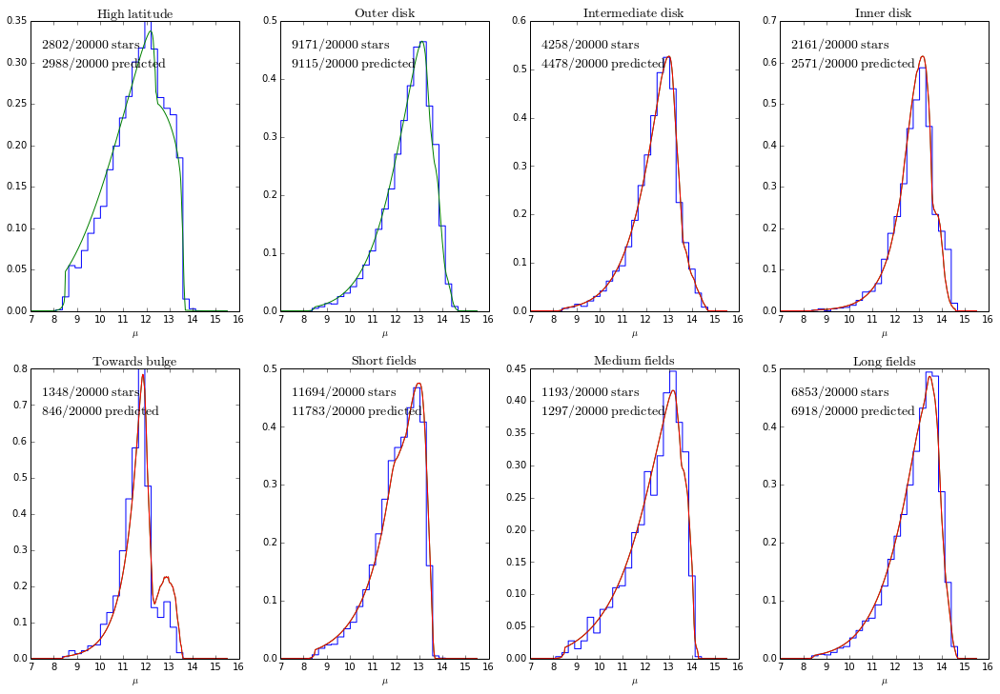

In [27]:
fit(type='expplusconst',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 178150.442614
         Iterations: 103
         Function evaluations: 179


array([ 0.41310863,  3.44022431, -9.57523106])

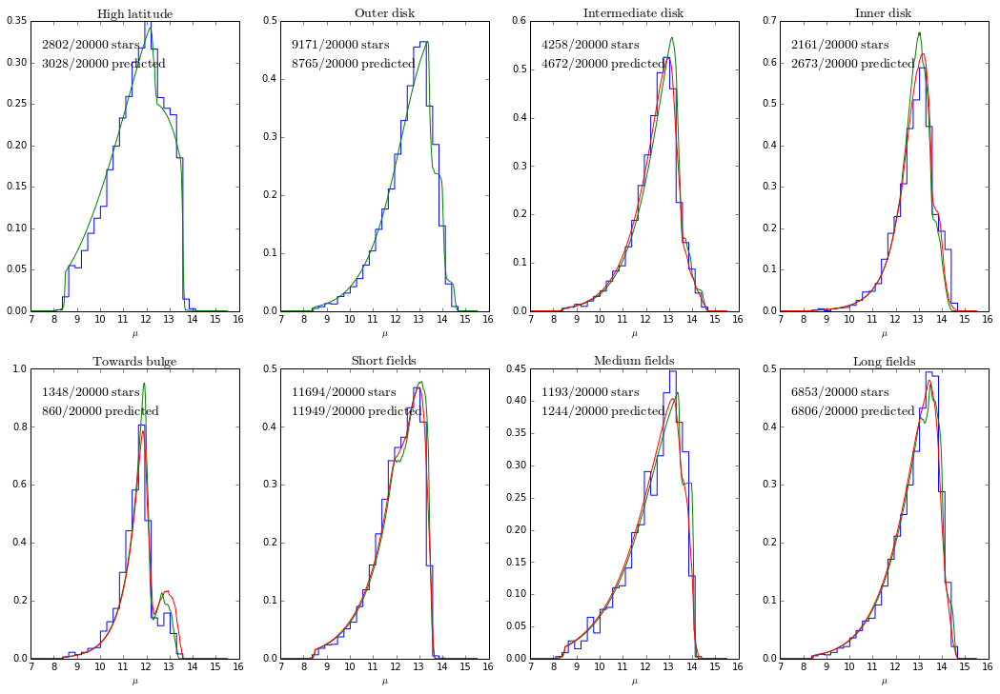

In [28]:
fit(type='expplusconst',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='drimmel03')

Optimization terminated successfully.
         Current function value: 177186.898826
         Iterations: 168
         Function evaluations: 286


array([-0.28224862,  3.67689757,  0.38699735,  1.29205818, -0.03296806])

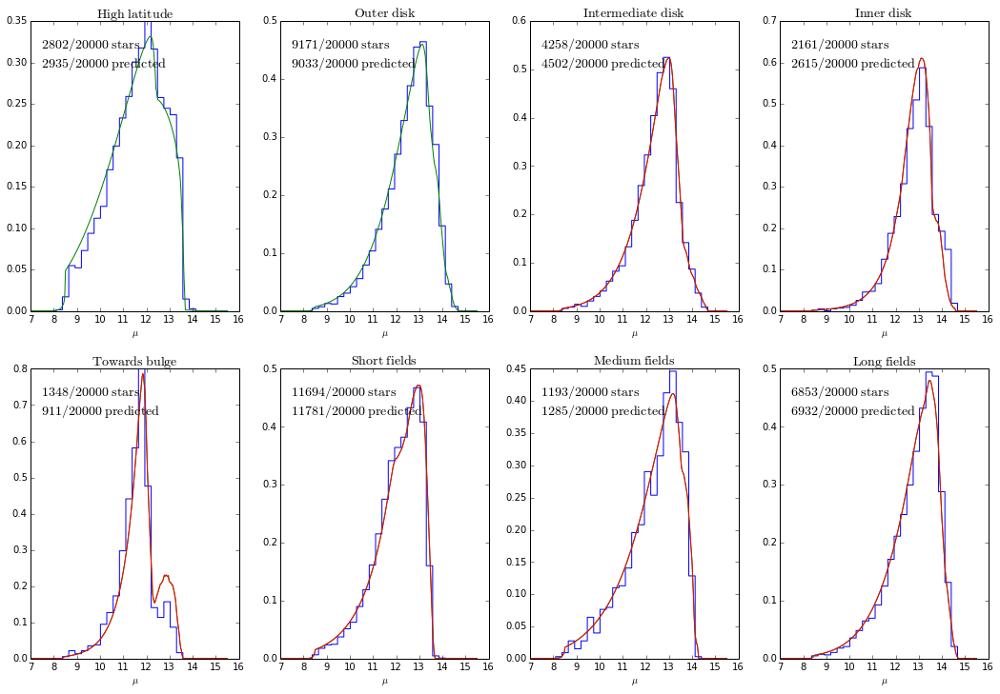

In [29]:
fit(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,dmap='marshall06')

Optimization terminated successfully.
         Current function value: 177704.459663
         Iterations: 317
         Function evaluations: 512


array([-0.02880875,  3.48784184,  0.37971572,  1.68196841, -0.01504889])

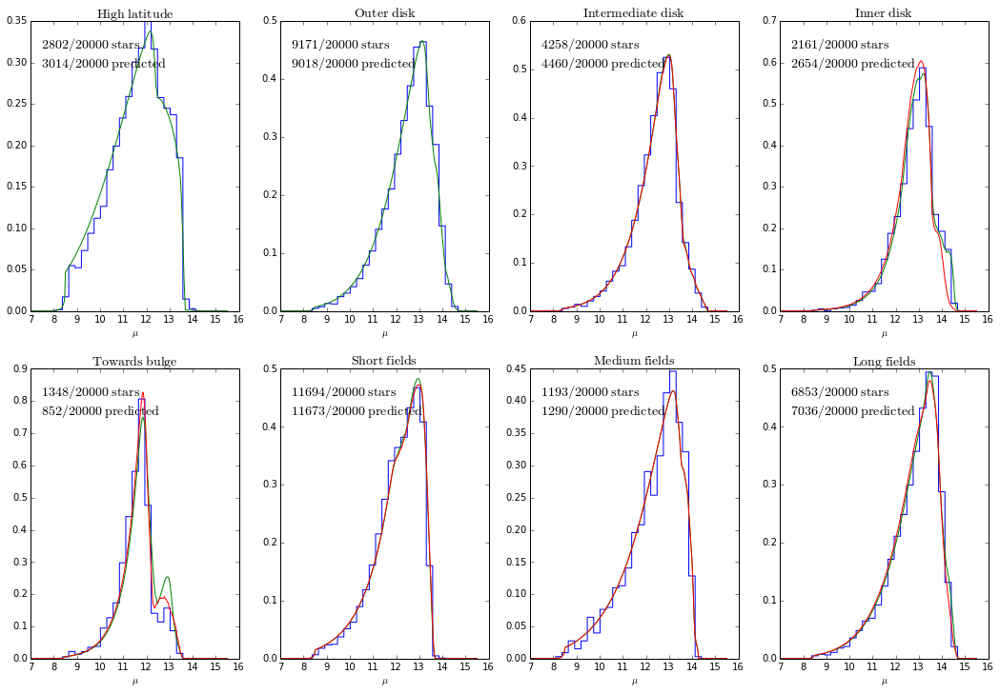

In [30]:
fit(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 177704.459663
         Iterations: 317
         Function evaluations: 512
Mean, standard devs, acor tau, acor mean, acor s ...
-0.0151771550549 0.0509315372563 [ 69.49007803] [-0.01517716] [ 0.00424708]
3.49120728846 0.038333717455 [ 32.11255383] [ 3.49120729] [ 0.00217264]
0.380924746987 0.0168954759571 [ 19.45111629] [ 0.38092475] [ 0.00074552]
1.69289954373 0.0249033596516 [ 68.04492827] [ 1.69289954] [ 0.00205457]
-0.0144033193656 0.0150141505766 [ 21.57094043] [-0.01440332] [ 0.00069767]
Quantiles:
[(0.16, -0.064646889501986604), (0.5, -0.013853255215274467), (0.84, 0.033429501159520689)]
Quantiles:
[(0.16, 3.4563053577831964), (0.5, 3.4908333726548255), (0.84, 3.5232761389598553)]
Quantiles:
[(0.16, 0.37594595064949032), (0.5, 0.37972151010332722), (0.84, 0.38360977952442593)]
Quantiles:
[(0.16, 1.6714922205990705), (0.5, 1.6913456904418425), (0.84, 1.712834158204688)]
Quantiles:
[(0.16, -0.018315539352490237)

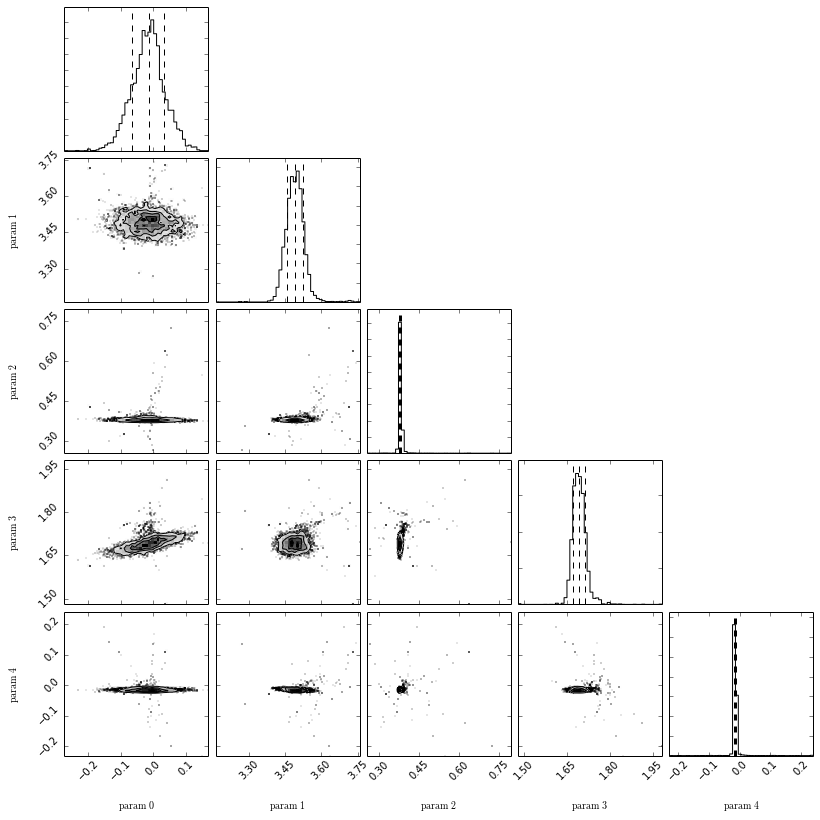

In [31]:
sample(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000)

In [32]:
load_mock_data(subsample='solar',type='brokenexp')
fitIndx= None #True-highbIndx
data_fitIndx= None #True-data_highbIndx

Optimization terminated successfully.
         Current function value: 177480.367742
         Iterations: 322
         Function evaluations: 530


array([ 0.44811274,  3.57149019,  0.4396872 ,  1.89409139, -0.01737202])

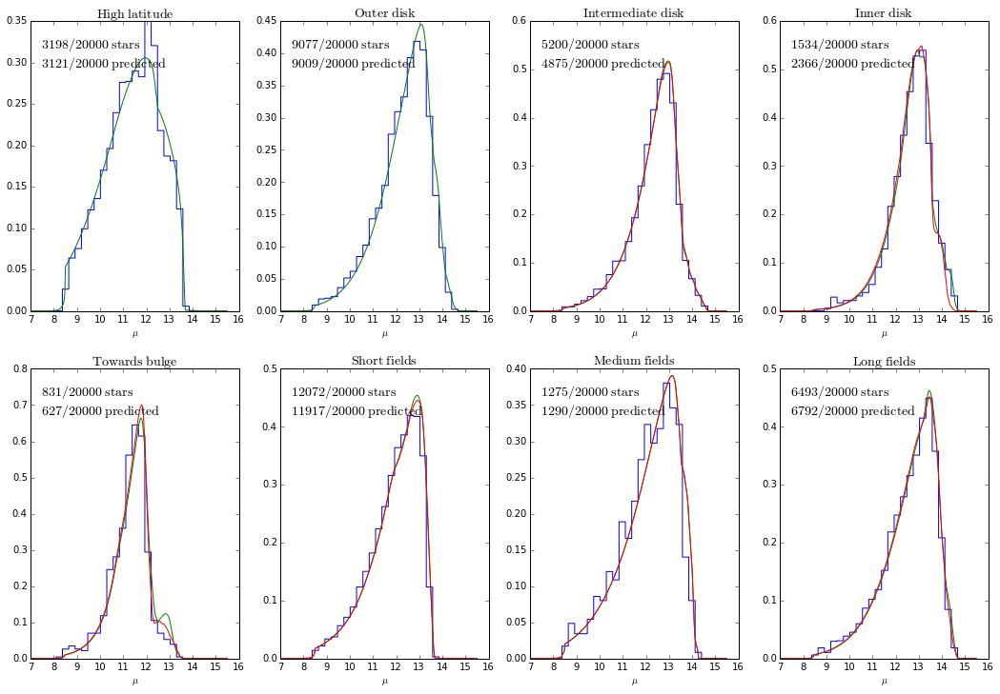

In [33]:
fit(type='tribrokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx)

Optimization terminated successfully.
         Current function value: 177480.367742
         Iterations: 322
         Function evaluations: 530
/Library/Python/2.7/site-packages/MarkovPy-0.1-py2.7.egg/markovpy/ensemble.py:234: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if lnprob == None:

Mean, standard devs, acor tau, acor mean, acor s ...
-0.107832582816 0.0960118519455 [ 52.97973818] [-0.10783258] [ 0.00699111]
3.56365333321 0.0472593610115 [ 41.23558301] [ 3.56365333] [ 0.00303409]
0.487871095151 0.0215882898051 [ 30.79523302] [ 0.4878711] [ 0.00119856]
2.04674688925 0.0448813276473 [ nan] [ 2.04674689] [ nan]
-0.0176133409259 0.0103280952527 [ 21.74119135] [-0.01761334] [ 0.00048181]
Quantiles:
[(0.16, -0.11937411042725891), (0.5, -0.081625213383463874), (0.84, -0.054310975871415944)]
Quantiles:
[(0.16, 3.5229821357016471), (0.5, 3.559683996489988), (0.84, 3.6002549716063355)]
Quantiles:
[(0.16, 0.48342624550268565), (0.5,

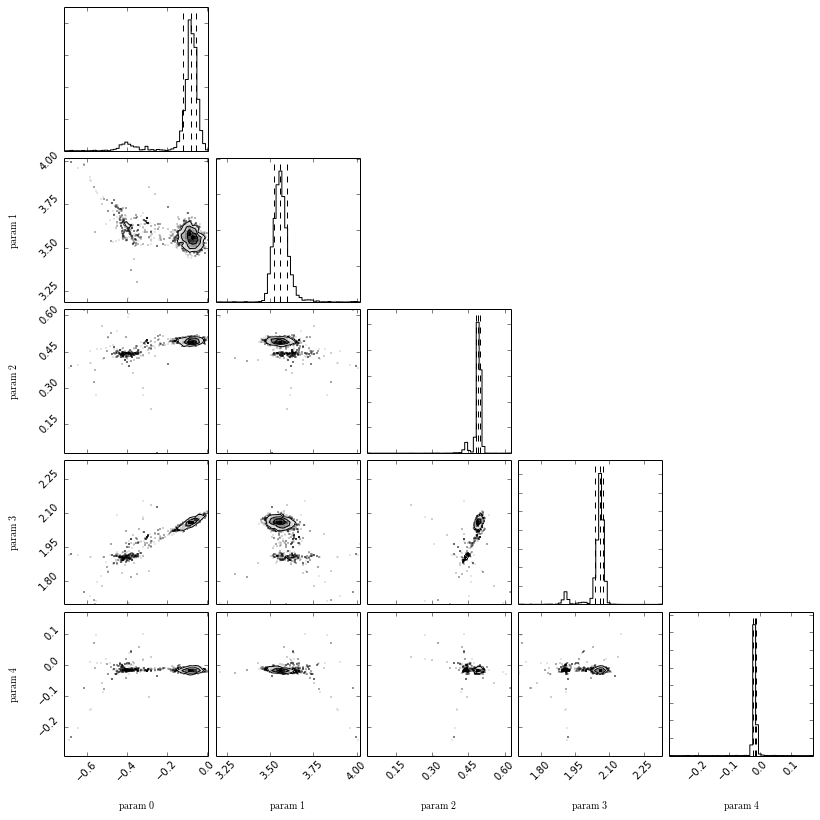

In [21]:
sample(type='brokenexpflare',fitIndx=fitIndx,data_fitIndx=data_fitIndx,nsamples=10000)

# MAPs: fit with broken, flaring exponential

In [47]:
try:
    reload(define_rcsample)
except NameError:
    import define_rcsample
maps= define_rcsample.MAPs()

In [260]:
def fitmap(tdata,type='brokenexp',dmap='marshall06'):
    if dmap == 'green15':
        tlocations= copy.deepcopy(locations)
        teffsel= copy.deepcopy(effsel)
        tdistmods= copy.deepcopy(distmods)
    elif dmap.lower() == 'marshall06':        
        tlocations= copy.deepcopy(mlocations)
        teffsel= copy.deepcopy(meffsel)
        tdistmods= copy.deepcopy(mdistmods)
    elif dmap.lower() == 'zero':        
        tlocations= copy.deepcopy(zlocations)
        teffsel= copy.deepcopy(zeffsel)
        tdistmods= copy.deepcopy(zdistmods)
    bf= fitDens.fitDens(tdata,numpy.array(tlocations),copy.deepcopy(teffsel),tdistmods,type=type,verbose=False)
    return bf

In [107]:
def samplemap(tdata,type='brokenexp',dmap='marshall06',nsamples=3000):
    if dmap == 'green15':
        tlocations= copy.deepcopy(locations)
        teffsel= copy.deepcopy(effsel)
        tdistmods= copy.deepcopy(distmods)
    elif dmap.lower() == 'marshall06':        
        tlocations= copy.deepcopy(mlocations)
        teffsel= copy.deepcopy(meffsel)
        tdistmods= copy.deepcopy(mdistmods)
    elif dmap.lower() == 'zero':        
        tlocations= copy.deepcopy(zlocations)
        teffsel= copy.deepcopy(zeffsel)
        tdistmods= copy.deepcopy(zdistmods)
    bf, samples= fitDens.fitDens(tdata,numpy.array(tlocations),copy.deepcopy(teffsel),tdistmods,type=type,verbose=False,
                                 nsamples=nsamples,mcmc=True)
    return samples

In [264]:
type= 'brokenexpflare'
out= []
for map in maps.map():
    out.append(fitmap(map,type=type,dmap='marshall06'))

/Library/Python/2.7/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)



In [281]:
type= 'tribrokenexpflare'
nsamples= 5000
outsamples= []
for map in maps.map():
    outsamples.append(samplemap(map,type=type,dmap='marshall06',nsamples=nsamples))

densprofiles.py:298: RuntimeWarning: overflow encountered in exp
  tinvhz= params[1]*numpy.exp((R-_R0)*params[4])

densprofiles.py:298: RuntimeWarning: overflow encountered in multiply
  tinvhz= params[1]*numpy.exp((R-_R0)*params[4])

densprofiles.py:303: RuntimeWarning: overflow encountered in multiply
  return numpy.fabs(tinvhz)/2.*out*numpy.exp(-tinvhz*numpy.fabs(z))

fitDens.py:101: RuntimeWarning: divide by zero encountered in log
  return numpy.sum(datadens)-len(dataR)*numpy.log(teffvol)



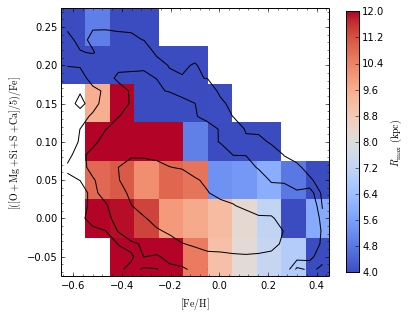

In [284]:
figsize(6,6)
maps.plot(numpy.median(numpy.exp(numpy.array(outsamples)[:,3]),axis=-1),
          vmin=4.,vmax=12.,minnstar=15,zlabel=r'$R_{\mathrm{max}}\,(\mathrm{kpc})$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

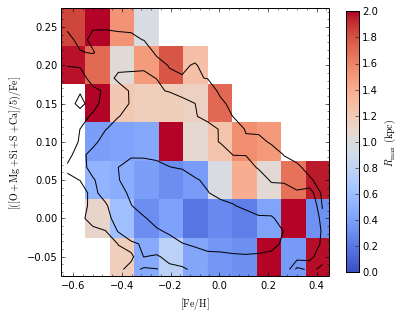

In [285]:
maps.plot(numpy.std(numpy.exp(numpy.array(outsamples)[:,3]),axis=-1),
          vmin=0.,vmax=2.,minnstar=15,zlabel=r'$R_{\mathrm{max}}\,(\mathrm{kpc})$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

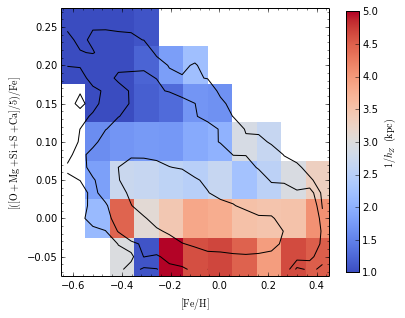

In [287]:
maps.plot(numpy.median(numpy.array(outsamples)[:,1],axis=-1),
          vmin=1.,vmax=5.,minnstar=15,zlabel=r'$1/h_Z\,(\mathrm{kpc})$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

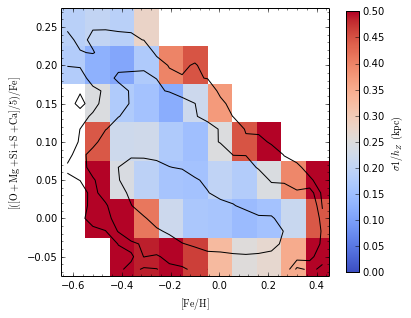

In [288]:
maps.plot(numpy.std(numpy.array(outsamples)[:,1],axis=-1),
          vmin=0.,vmax=.5,minnstar=15,zlabel=r'$\sigma 1/h_Z\,(\mathrm{kpc})$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

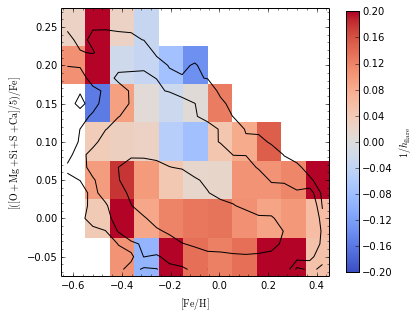

In [292]:
maps.plot(-numpy.median(numpy.array(outsamples)[:,4],axis=-1),
          vmin=-0.2,vmax=0.2,minnstar=15,zlabel=r'$1/h_{\mathrm{flare}}$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

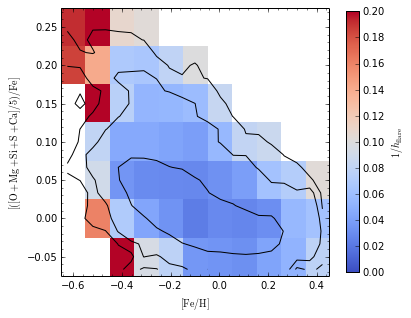

In [295]:
maps.plot(numpy.std(numpy.array(outsamples)[:,4],axis=-1),
          vmin=0.,vmax=0.2,minnstar=15,zlabel=r'$1/h_{\mathrm{flare}}$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

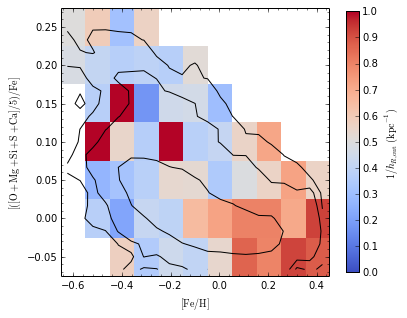

In [289]:
maps.plot(numpy.median(numpy.array(outsamples)[:,2],axis=-1),
          vmin=0.,vmax=1.,minnstar=15,zlabel=r'$1/h_{R,\mathrm{out}}\,(\mathrm{kpc}^{-1})$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

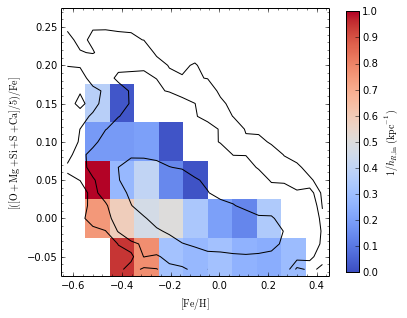

In [290]:
plotthis= numpy.median(numpy.array(outsamples)[:,0],axis=-1)
plotthis[numpy.median(numpy.exp(numpy.array(outsamples)[:,3]),axis=-1) < 6.]= numpy.nan
maps.plot(plotthis,
          vmin=0.,vmax=1.,minnstar=15,zlabel=r'$1/h_{R,\mathrm{in}}\,(\mathrm{kpc}^{-1})$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

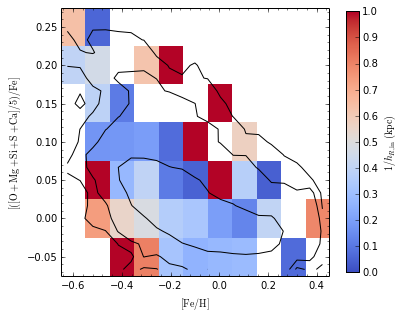

In [265]:
figsize(6,6)
plotthis= numpy.fabs(numpy.array(out)[:,0])
plotthis[numpy.exp(numpy.array(out)[:,3]) < 5.]= numpy.nan
maps.plot(plotthis,
          vmin=0.,vmax=1.,minnstar=15,zlabel=r'$1/h_{R,\mathrm{in}}\,(\mathrm{kpc})$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

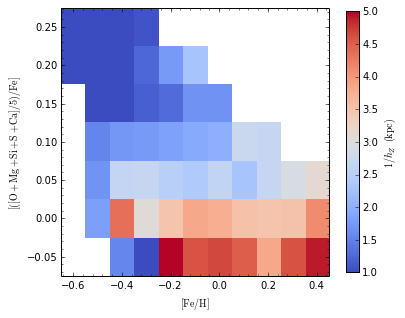

In [267]:
maps.plot(numpy.array(out)[:,1],vmin=1.,vmax=5.,minnstar=15,zlabel=r'$1/h_Z\,(\mathrm{kpc})$')

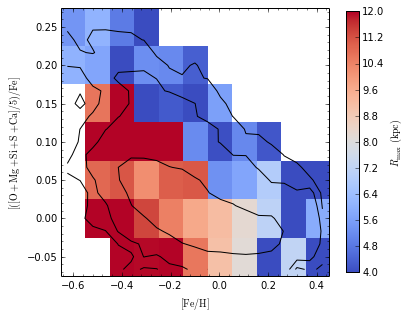

In [268]:
maps.plot(numpy.exp(numpy.array(out)[:,3]),vmin=4.,vmax=12.,minnstar=15,zlabel=r'$R_{\mathrm{max}}\,(\mathrm{kpc})$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

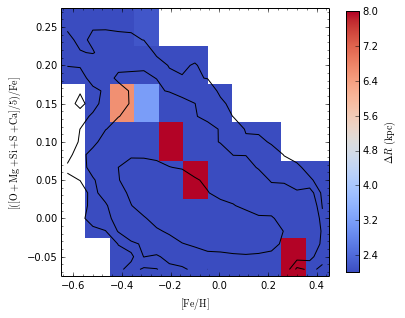

In [269]:
figsize(6,6)
maps.plot(-numpy.log(0.5)*(1./numpy.array(out)[:,0]+1./numpy.array(out)[:,2]),vmin=2.,vmax=8.,
          minnstar=15,zlabel=r'$\Delta R\,(\mathrm{kpc})$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

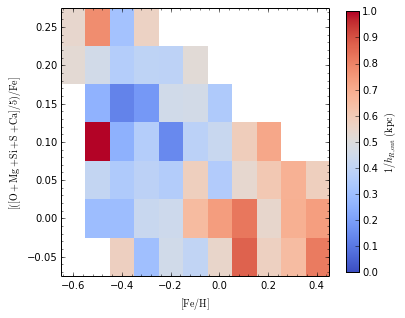

In [104]:
maps.plot(numpy.array(out)[:,2],
          vmin=0.,vmax=1.,minnstar=15,zlabel=r'$1/h_{R,\mathrm{out}}\,(\mathrm{kpc})$')

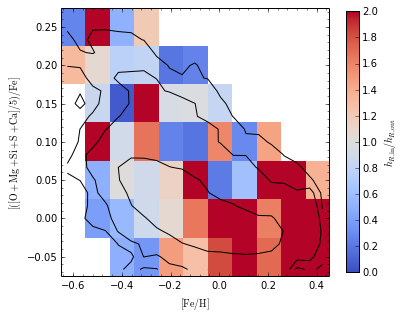

In [105]:
maps.plot(numpy.array(out)[:,2]/numpy.array(out)[:,0],
          vmin=0.,vmax=2,minnstar=15,zlabel=r'$h_{R,\mathrm{in}}/h_{R,\mathrm{out}}$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

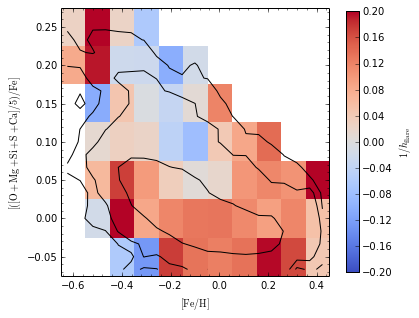

In [273]:
maps.plot(-numpy.array(out)[:,4],
          vmin=-0.2,vmax=0.2,minnstar=15,zlabel=r'$1/h_{\mathrm{flare}}$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

# PDFs

In [301]:
mapsamples= numpy.reshape(numpy.array(outsamples),(11,7,5,nsamples))

In [302]:
def plot_map_mcmc(fehindx,afeindx):
    labels= []
    for ii in range(mapsamples.shape[2]): labels.append(r"$\mathrm{param}\ %i$" % ii)
    triangle.corner(mapsamples[fehindx,afeindx].T,quantiles=[0.16, 0.5, 0.84],labels=labels,
                    show_titles=True, title_args={"fontsize": 12},bins=21)

Quantiles:
[(0.16, 0.097392714907935357), (0.5, 0.3588603700134797), (0.84, 1.1033064989870696)]
Quantiles:
[(0.16, 3.3408684262999531), (0.5, 3.5238334369677617), (0.84, 3.6888809679392929)]
Quantiles:
[(0.16, 0.65989485401116799), (0.5, 0.71004258757729866), (0.84, 0.8587818432381068)]
Quantiles:
[(0.16, 0.10246921538785256), (0.5, 0.801224154622173), (0.84, 1.870780930722534)]
Quantiles:
[(0.16, -0.15185077303454009), (0.5, -0.10113009874484358), (0.84, -0.060747549472980757)]


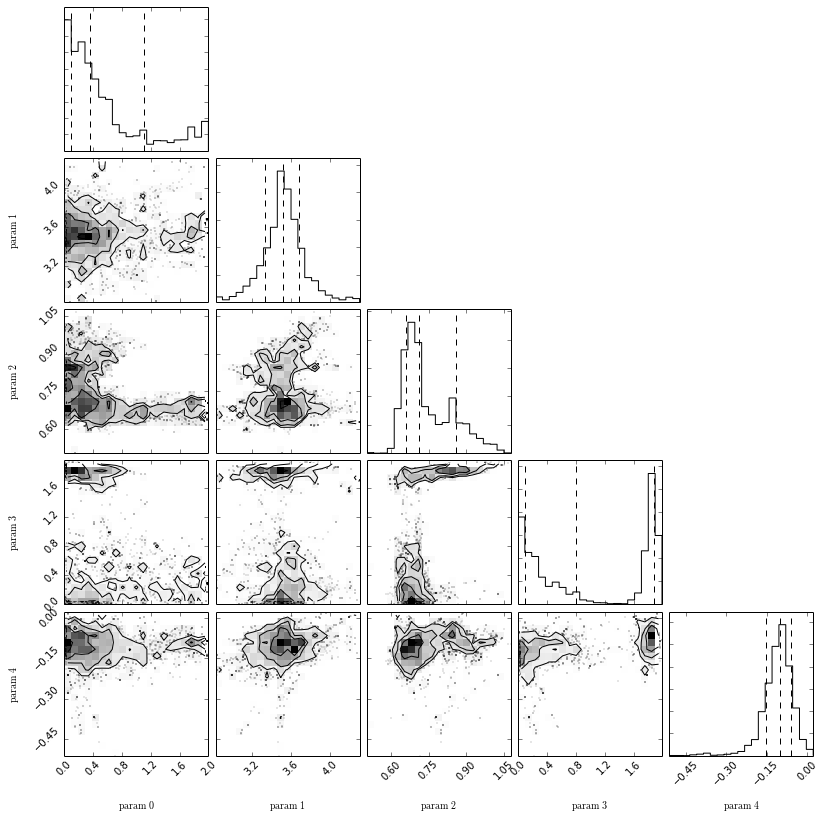

In [308]:
plot_map_mcmc(9,1)

Quantiles:
[(0.16, 0.25637726502555291), (0.5, 0.81572820516905864), (0.84, 1.5150728346937827)]
Quantiles:
[(0.16, 2.5530649981121591), (0.5, 3.7324271589055802), (0.84, 5.5311637717288491)]
Quantiles:
[(0.16, 0.1470122878396235), (0.5, 0.36694580067322724), (0.84, 0.68760092123334693)]
Quantiles:
[(0.16, 0.36096798200047364), (0.5, 1.279376693022102), (0.84, 2.1156373097349768)]
Quantiles:
[(0.16, -0.535679388859848), (0.5, -0.35938805202781204), (0.84, -0.16043512392861908)]


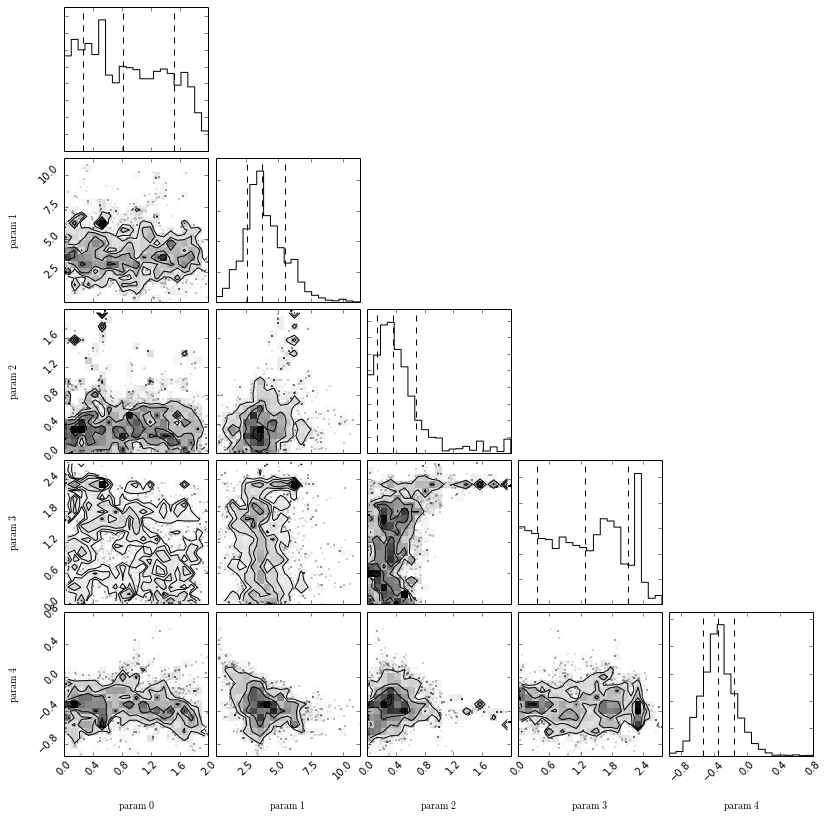

In [305]:
plot_map_mcmc(6,5)

Quantiles:
[(0.16, 0.10654337504765732), (0.5, 0.3780473773794224), (0.84, 1.2921937096426526)]
Quantiles:
[(0.16, 0.24906192387515), (0.5, 0.45884727219204813), (0.84, 0.76253107984398094)]
Quantiles:
[(0.16, 0.14649209369604421), (0.5, 0.37776819167699693), (0.84, 1.0023805812566491)]
Quantiles:
[(0.16, 1.2919830862641843), (0.5, 2.254645439988562), (0.84, 2.4852993110578687)]
Quantiles:
[(0.16, -0.069824845572100502), (0.5, 0.15598116263011141), (0.84, 0.36615082023047252)]


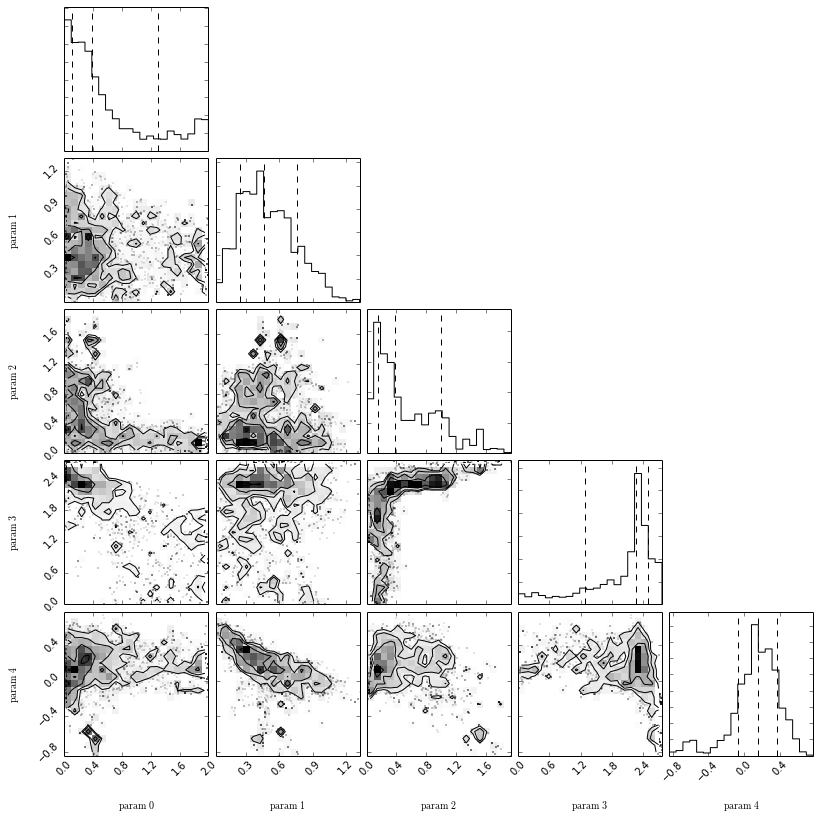

In [309]:
plot_map_mcmc(1,4)

Quantiles:
[(0.16, 0.64960894617004761), (0.5, 1.2850580105018994), (0.84, 1.8050674568594536)]
Quantiles:
[(0.16, 1.1735459777742396), (0.5, 1.2960101421143801), (0.84, 1.4274296929383121)]
Quantiles:
[(0.16, 0.40511507113863315), (0.5, 0.45118975403366623), (0.84, 0.49660737265534222)]
Quantiles:
[(0.16, 0.47221883557733735), (0.5, 1.1023146052322474), (0.84, 1.4634395805847125)]
Quantiles:
[(0.16, -0.023803797219824112), (0.5, 0.024257603683695995), (0.84, 0.082466054952880175)]


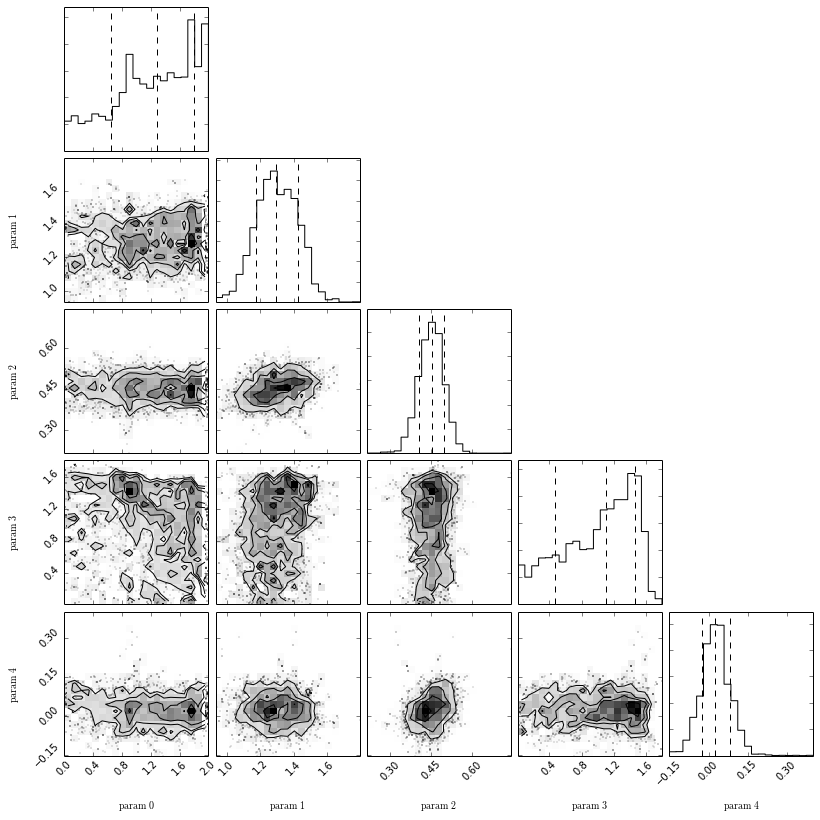

In [310]:
plot_map_mcmc(4,4)

# MAPs: fit with broken exponential with two scale heights

In [352]:
type= 'tribrokentwoexp'
nsamples= 5000
outsamples_twoexp= []
for map in maps.map():
    outsamples_twoexp.append(samplemap(map,type=type,dmap='marshall06',nsamples=nsamples))

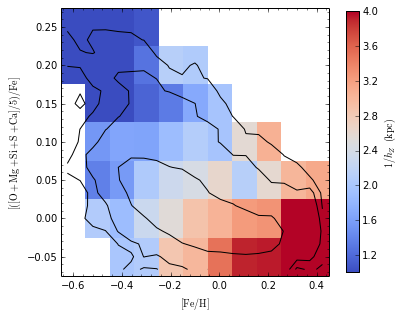

In [353]:
maps.plot(numpy.median(numpy.array(outsamples_twoexp)[:,1],axis=-1),
          vmin=1.,vmax=4.,minnstar=15,zlabel=r'$1/h_Z\,(\mathrm{kpc})$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

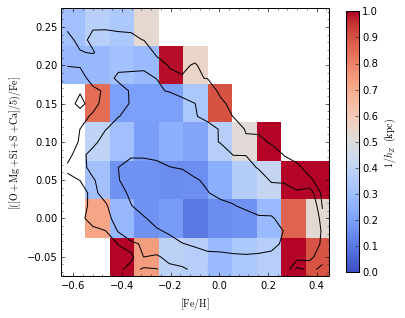

In [381]:
maps.plot(numpy.std(numpy.array(outsamples_twoexp)[:,1],axis=-1),
          vmin=0.,vmax=1.,minnstar=15,zlabel=r'$1/h_Z\,(\mathrm{kpc})$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

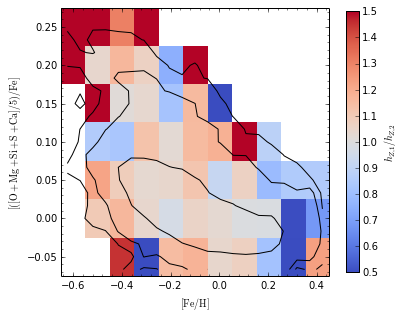

In [357]:
figsize(6,6)
maps.plot(numpy.median(numpy.array(outsamples_twoexp)[:,5]/numpy.array(outsamples_twoexp)[:,1],axis=-1),
          vmin=0.5,vmax=1.5,minnstar=15,zlabel=r'$h_{Z,1}/h_{Z,2}$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

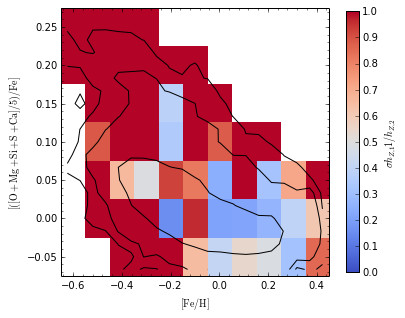

In [358]:
maps.plot(numpy.std(numpy.array(outsamples_twoexp)[:,5]/numpy.array(outsamples_twoexp)[:,1],axis=-1),
          vmin=0.,vmax=1.,minnstar=15,zlabel=r'$\sigma h_{Z,1}1/h_{Z,2}$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

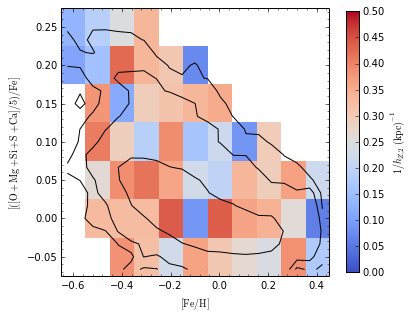

In [359]:
maps.plot(numpy.median(densprofiles.ilogit(numpy.array(outsamples_twoexp)[:,4]),axis=-1),
          vmin=0.,vmax=.5,minnstar=15,zlabel=r'$1/h_{Z,2}\,(\mathrm{kpc})^{-1}$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

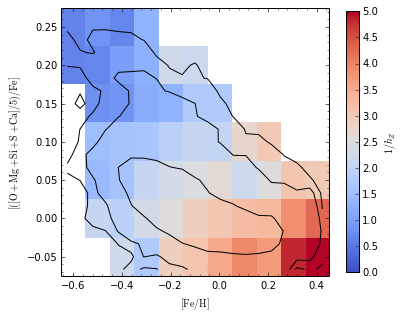

In [367]:
figsize(6,6)
maps.plot(numpy.median((1.-densprofiles.ilogit(numpy.array(outsamples_twoexp)[:,4]))*numpy.array(outsamples_twoexp)[:,1]
                       +(densprofiles.ilogit(numpy.array(outsamples_twoexp)[:,4]))*numpy.array(outsamples_twoexp)[:,5],axis=-1),
          vmin=0.,vmax=5.,minnstar=15,zlabel=r'$1/h_Z$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

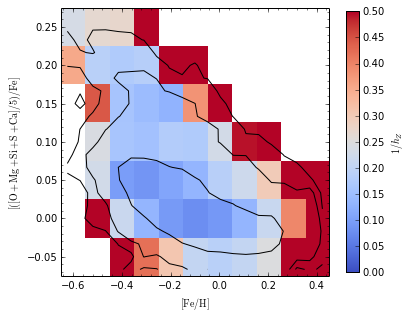

In [379]:
figsize(6,6)
maps.plot(numpy.std((1.-densprofiles.ilogit(numpy.array(outsamples_twoexp)[:,4]))*numpy.array(outsamples_twoexp)[:,1]
                       +(densprofiles.ilogit(numpy.array(outsamples_twoexp)[:,4]))*numpy.array(outsamples_twoexp)[:,5],axis=-1),
          vmin=0.,vmax=.5,minnstar=15,zlabel=r'$1/h_Z$')
bovy_plot.scatterplot(maps.data[define_rcsample._FEHTAG],maps.data[define_rcsample._AFETAG],contours=True,overplot=True,
                      levels=[0.68,0.95,0.99,1.01],justcontours=True,aspect=2.,bins=21,
                      xrange=[maps.xmin,maps.xmax],yrange=[maps.ymin,maps.ymax])

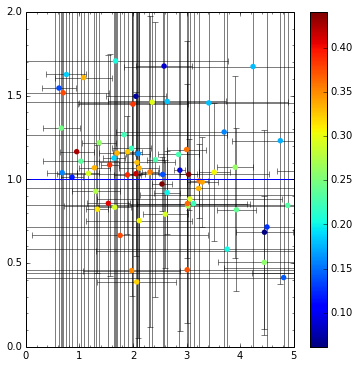

In [389]:
bovy_plot.bovy_plot(numpy.median(numpy.array(outsamples_twoexp),axis=-1)[:,1],
                    numpy.median(numpy.array(outsamples_twoexp)[:,5]/numpy.array(outsamples_twoexp)[:,1],axis=-1),
        c=densprofiles.ilogit(numpy.median(numpy.array(outsamples_twoexp),axis=-1)[:,4]),scatter=True,colorbar=True,edgecolor='none',
        s=30.,xrange=[0.,5.],yrange=[0.,2.],zorder=1)
errorbar(numpy.median(numpy.array(outsamples_twoexp),axis=-1)[:,1],numpy.median(numpy.array(outsamples_twoexp)[:,5]/numpy.array(outsamples_twoexp)[:,1],axis=-1),
         xerr=numpy.std(numpy.array(outsamples_twoexp),axis=-1)[:,1],yerr=numpy.std(numpy.array(outsamples_twoexp)[:,5]/numpy.array(outsamples_twoexp)[:,1],axis=-1),
         marker='None',ls='None',color='k',zorder=0,lw=0.5)
plot((0,10),(1,1))

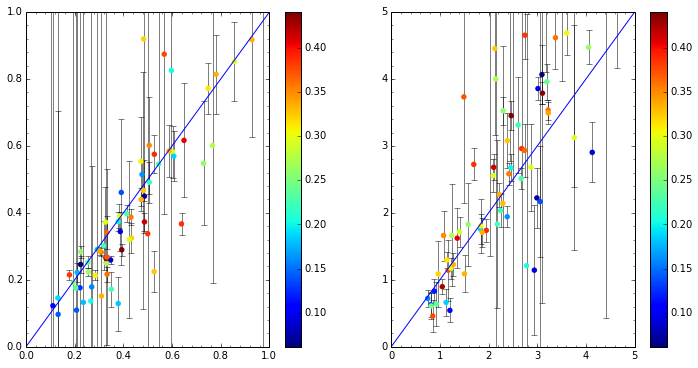

In [399]:
figsize(12,6)
subplot(1,2,1)
bovy_plot.bovy_plot(numpy.median(1./numpy.array(outsamples_twoexp),axis=-1)[:,1],
                    numpy.median(1./numpy.array(outsamples)[:,1],axis=-1),
        c=densprofiles.ilogit(numpy.median(numpy.array(outsamples_twoexp),axis=-1)[:,4]),scatter=True,colorbar=True,edgecolor='none',
        s=30.,xrange=[0.,1.],yrange=[0.,1.],zorder=1,gcf=True)
errorbar(numpy.median(1./numpy.array(outsamples_twoexp),axis=-1)[:,1],numpy.median(1./numpy.array(outsamples)[:,1],axis=-1),
         yerr=numpy.std(1./numpy.array(outsamples)[:,1],axis=-1),
         marker='None',ls='None',color='k',zorder=0,lw=0.5)
plot((0,10),(0,10))
figsize(12,6)
subplot(1,2,2)
bovy_plot.bovy_plot(numpy.median(numpy.array(outsamples_twoexp),axis=-1)[:,5],
                    numpy.median(numpy.array(outsamples)[:,1],axis=-1),
        c=densprofiles.ilogit(numpy.median(numpy.array(outsamples_twoexp),axis=-1)[:,4]),scatter=True,colorbar=True,edgecolor='none',
        s=30.,xrange=[0.,5.],yrange=[0.,5.],zorder=1,gcf=True)
errorbar(numpy.median(numpy.array(outsamples_twoexp),axis=-1)[:,5],numpy.median(numpy.array(outsamples)[:,1],axis=-1),
         yerr=numpy.std(numpy.array(outsamples)[:,1],axis=-1),
         marker='None',ls='None',color='k',zorder=0,lw=0.5)
plot((0,10),(0,10))

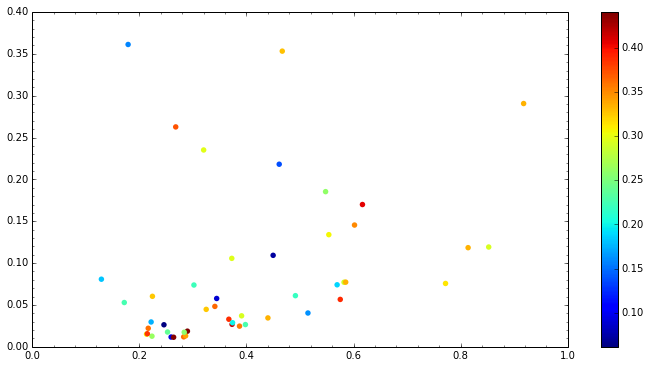

In [397]:
bovy_plot.bovy_plot(numpy.median(1./numpy.array(outsamples)[:,1],axis=-1),
                    numpy.std(1./numpy.array(outsamples)[:,1],axis=-1),
        c=densprofiles.ilogit(numpy.median(numpy.array(outsamples_twoexp),axis=-1)[:,4]),scatter=True,colorbar=True,edgecolor='none',
        s=30.,xrange=[0.,1.],yrange=[0.,.4],zorder=1)

In [401]:
mapsamples= numpy.reshape(numpy.array(outsamples_twoexp),(11,7,6,nsamples))

Quantiles:
[(0.16, 0.15527917217288353), (0.5, 0.2156610744969874), (0.84, 0.28882761988911709)]
Quantiles:
[(0.16, 2.8860815061620073), (0.5, 3.0390411908063073), (0.84, 3.1715502474205532)]
Quantiles:
[(0.16, 0.70872844490496423), (0.5, 0.74792966403392946), (0.84, 0.78848201355304115)]
Quantiles:
[(0.16, 2.2032816143418015), (0.5, 2.220458860222541), (0.84, 2.2392789454836532)]
Quantiles:
[(0.16, -1.8561606801315755), (0.5, -0.25033534150463632), (0.84, -0.11327105571428416)]
Quantiles:
[(0.16, 2.8862121912935597), (0.5, 3.1065612476394513), (0.84, 3.4635890788799539)]


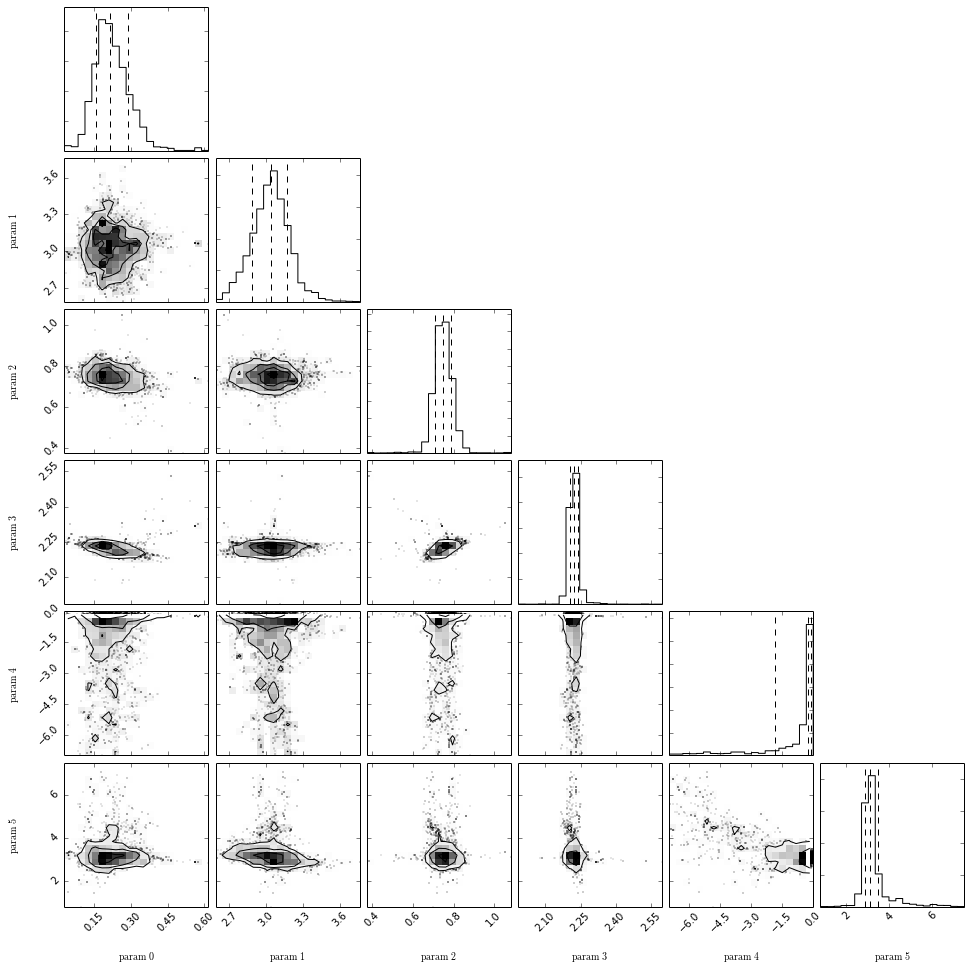

In [403]:
plot_map_mcmc(6,1)